In [25]:
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib widget
from sklearn.datasets import make_blobs
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
np.set_printoptions(precision=2)
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)
tf.autograph.set_verbosity(0)
import shap
from sklearn.inspection import permutation_importance
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from itertools import product

In [38]:
courses_number = 12
knowledge_lvl_questions = 5

answers_train = np.array([
    #---0
    [2,3,3,1,3,1,1,4,3,2,1,1,1,3,1,1,1,3,4,1,1,1,3,1,1,2,4,1,3,1,3,2,1,3,1],
    [2,3,3,1,2,1,1,4,3,2,1,1,1,1,1,1,1,1,1,1,2,1,3,1,3,3,4,1,3,1,1,2,1,3,3],
    [2,3,1,2,3,1,1,4,3,3,1,1,1,1,1,2,1,1,3,1,2,1,2,1,2,3,3,1,2,1,1,1,1,2,2],
    [2,2,3,1,3,1,1,4,1,2,1,1,1,1,1,1,1,1,3,1,3,1,1,1,2,2,4,2,3,1,1,2,2,3,3],
    [2,3,3,1,3,1,1,4,3,2,2,1,1,3,1,1,1,1,1,1,2,1,3,1,1,3,3,1,2,1,1,1,1,2,2],
    #---1
    [2,2,3,2,3,3,1,1,2,4,4,2,3,4,2,1,2,2,1,2,1,1,2,2,1,2,4,2,1,2,4,3,2,4,3],
    [2,1,2,2,3,3,1,1,2,4,4,2,2,4,1,2,2,2,4,2,1,2,1,2,1,1,3,2,1,2,2,2,1,1,3],
    [2,2,1,2,3,3,1,1,1,4,3,1,3,4,1,2,2,2,4,2,1,2,2,2,1,1,2,2,2,1,2,2,1,2,3],
    [2,2,2,2,2,3,1,1,2,4,4,2,2,4,2,2,2,2,2,2,1,2,1,2,1,2,2,2,2,1,2,2,1,1,3],
    [2,2,2,2,1,3,1,1,1,4,3,2,2,4,1,1,2,2,4,1,1,2,2,2,2,1,2,2,2,2,2,1,1,2,2],
    #---2
    [2,1,2,2,2,2,2,2,1,1,3,2,3,2,1,1,3,1,1,2,2,1,2,2,2,2,1,2,2,2,1,1,1,2,2],
    [2,1,1,1,2,2,2,2,1,1,3,2,2,2,1,3,2,2,2,1,1,2,2,2,2,1,1,1,2,2,1,3,2,1,1],
    [2,1,1,2,2,2,2,2,2,1,3,2,2,2,1,3,2,2,3,1,1,3,2,2,2,1,1,2,2,2,1,2,2,2,2],
    [2,1,1,1,2,2,2,2,2,1,3,2,3,2,1,3,2,2,2,1,1,2,1,2,2,1,1,2,1,2,1,2,2,2,2],
    [2,2,1,2,2,2,2,2,1,1,3,2,2,2,1,3,2,2,2,1,2,2,1,2,2,2,2,1,2,2,2,3,2,1,1],
    #---3
    [1,2,2,2,1,1,1,4,1,2,2,1,1,3,1,2,1,2,2,2,2,1,2,2,2,2,4,1,2,1,2,2,1,1,3],
    [1,2,2,2,1,4,1,4,3,2,3,4,4,3,2,3,3,4,3,3,2,4,3,3,3,2,1,1,3,2,2,2,2,4,3],
    [1,2,2,2,1,4,1,4,4,2,3,4,3,3,2,3,3,3,4,3,2,4,2,3,3,2,1,1,2,2,2,2,2,4,3],
    [1,2,2,2,1,4,1,4,4,2,3,4,4,3,2,3,3,3,3,3,2,4,3,3,3,1,1,1,3,2,2,2,2,3,3],
    [1,2,2,2,1,4,1,4,3,2,3,4,4,3,2,3,3,4,3,4,2,4,2,3,3,1,1,1,3,2,2,2,2,3,3],
    #--4
    [1,1,1,2,1,3,1,2,2,4,3,2,2,4,3,4,2,1,1,3,3,3,1,1,2,3,4,2,3,2,1,3,1,2,2],
    [1,1,1,2,1,2,4,3,2,4,2,3,3,2,4,4,4,4,4,4,3,3,4,3,4,4,2,3,4,3,3,4,4,1,4],
    [1,1,1,2,1,2,4,3,3,4,2,3,3,2,4,4,4,3,4,4,4,3,3,3,4,4,2,3,4,3,3,4,4,2,3],
    [1,1,1,2,1,2,4,3,4,4,2,3,4,2,4,4,4,4,4,4,3,3,4,3,4,4,2,3,4,3,3,4,4,2,3],
    [1,1,1,2,1,2,4,3,3,4,2,3,4,2,4,4,4,3,4,4,3,3,3,3,4,4,3,3,4,3,3,4,4,2,4],
    #--5
    [2,2,2,1,2,4,1,3,3,3,1,3,1,1,1,1,4,2,1,1,2,1,3,3,1,1,3,1,4,1,1,1,1,1,1],
    [2,2,2,1,2,1,2,1,2,2,1,2,2,1,2,1,1,1,2,2,2,1,2,2,2,3,3,2,2,1,2,3,3,2,1],
    [2,2,2,1,2,1,2,1,1,2,1,2,2,1,2,1,1,1,3,2,2,1,2,2,2,3,3,2,3,1,2,3,3,2,1],
    [2,2,2,1,2,1,2,1,2,2,1,2,2,1,2,1,1,2,2,2,2,2,2,2,2,3,3,2,2,1,2,3,3,2,1],
    [2,2,2,1,2,1,2,1,1,2,1,2,2,1,2,1,1,2,2,2,3,2,2,2,2,3,3,2,2,1,2,3,3,2,1],
    #--6
    [2,1,2,1,1,2,2,2,2,1,3,2,3,2,1,1,2,1,1,2,2,2,2,2,2,2,1,2,3,2,2,2,2,1,2],
    [2,1,2,1,1,3,2,2,1,3,3,3,3,3,2,3,3,3,3,2,1,3,2,2,3,2,1,2,3,2,1,3,2,3,3],
    [2,1,2,1,1,3,2,2,1,3,3,3,3,3,2,3,3,3,3,2,1,3,2,2,3,2,1,2,3,2,1,3,2,3,2],
    [2,1,2,1,1,3,2,2,1,3,3,3,3,3,2,3,3,3,3,2,1,3,3,2,3,2,1,2,3,2,1,3,2,3,2],
    [2,1,2,1,1,3,2,2,2,3,3,3,3,3,2,3,3,3,3,2,1,3,2,2,3,2,1,2,3,2,1,3,2,3,3],
    #--7
    [1,2,2,2,1,1,3,4,3,3,1,1,1,1,1,2,1,3,4,1,1,1,3,3,3,2,4,1,3,1,1,2,1,1,1],
    [1,2,2,2,1,1,3,2,2,1,2,1,1,1,3,2,1,1,1,1,3,1,3,1,3,1,4,2,3,1,1,1,3,1,2],
    [1,2,2,2,1,1,3,2,3,1,2,1,1,1,3,2,1,1,1,1,3,1,2,1,3,1,4,2,3,1,1,1,3,1,2],
    [1,2,2,2,1,1,3,2,2,1,2,1,1,1,3,2,1,1,2,1,3,1,2,1,3,1,4,2,3,1,1,1,3,2,2],
    [1,2,2,2,1,1,3,2,2,1,2,1,1,1,3,2,1,1,1,1,3,1,3,1,3,1,4,2,3,1,1,1,3,1,1],
    #--8
    [2,2,2,2,2,1,1,4,1,2,2,1,1,3,1,2,1,3,3,2,1,1,3,3,2,2,4,1,2,1,2,3,2,1,3],
    [2,2,2,2,2,2,2,1,1,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2],
    [2,2,2,2,2,2,2,1,1,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,1,2],
    [2,2,2,2,2,2,2,1,1,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,3,2],
    [2,2,2,2,2,2,2,1,1,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,4,2],
    #--9
    [3,3,3,3,3,4,1,3,2,3,4,4,1,1,1,1,1,3,4,2,1,1,4,4,1,2,4,2,3,1,3,1,3,1,2],
    [3,3,3,3,3,4,3,3,4,3,3,3,4,3,3,3,3,3,2,3,4,3,4,3,3,2,4,3,2,3,4,3,3,3,3],
    [3,3,3,3,3,4,3,3,4,3,3,3,4,3,3,3,3,3,2,3,4,3,4,3,3,2,4,3,2,3,4,3,3,3,2],
    [3,3,3,3,3,4,3,3,4,3,3,3,4,3,3,3,3,3,2,3,4,3,4,3,3,2,4,3,2,3,4,3,3,2,3],
    [3,3,3,3,3,4,3,3,4,3,3,3,4,3,3,3,3,3,2,3,4,3,4,3,3,2,4,3,2,3,4,3,3,2,2],
    #--10
    [4,3,3,3,4,3,1,1,2,4,4,2,3,4,2,1,2,2,1,2,1,1,2,2,1,3,4,2,2,1,3,2,2,4,3],
    [4,3,3,3,4,1,4,4,3,4,4,4,4,4,4,4,4,4,3,4,2,4,4,4,4,4,1,4,4,3,3,4,4,4,4],
    [4,3,3,3,4,1,4,4,3,4,4,4,4,4,4,4,4,4,3,4,2,4,4,4,4,4,1,4,4,3,3,4,4,4,3],
    [4,3,3,3,4,1,4,4,3,4,4,4,4,4,4,4,4,4,3,4,2,4,4,4,4,4,1,4,4,3,3,4,4,3,4],
    [4,3,3,3,4,1,4,4,3,4,4,4,4,4,4,4,4,4,3,4,2,4,4,4,4,4,1,4,4,3,3,4,4,2,4],
    #--11
    [2,2,2,2,2,2,2,2,1,1,3,3,2,2,1,1,2,1,1,2,2,1,2,2,2,2,1,2,2,2,1,1,2,2,2],
    [2,2,2,2,2,3,1,2,1,3,3,2,3,3,1,3,3,3,3,3,1,3,2,2,3,2,2,2,3,2,2,3,3,3,3],
    [2,2,2,2,2,3,1,2,1,3,3,2,3,3,1,3,3,3,3,3,1,3,2,2,3,2,2,2,3,2,2,3,3,2,3],
    [2,2,2,2,2,3,1,2,1,3,3,2,3,3,1,3,3,3,3,3,1,3,2,2,3,2,2,2,3,2,2,3,3,2,2],
    [2,2,2,2,2,3,1,2,1,3,3,2,3,3,1,3,3,3,3,3,1,3,2,2,3,2,2,2,3,2,2,3,3,3,2]
    
    
])
train_sets = len(answers_train) // courses_number
course_train = []
for i in range(len(answers_train) // train_sets):
    for j in range(train_sets):
        course_train.append(i)
course_train = np.array(course_train)

answers_dev = np.array([
    [2,	3,	3,	1,	3,	1,	1,	4,	4,	2,	1,	1,	1,	1,	2,	2,	1,	3,	4,	1,	3,	4,	2,	3,	4,	3,	2,	2,	3,	4,	4,	1,	2,	3,	1],
    [2,	2,	2,	2,	3,	3,	1,	1,	1,	4,	4,	3,	3,	4,	3,	3,	3,	2,	3,	2,	1,	3,	2,	3,	4,	4,	2,	2,	3,	1,	3,	2,	2,	3,	4],
    [2,	1,	1,	2,	2,	2,	2,	2,	1,	1,	2,	3,	3,	3,	1,	2,	3,	3,	2,	3,	3,	1,	3,	4,	4,	2,	3,	4,	4,	4,	2,	1,	4,	4,	3],
    [1,	2,	2,	2,	1,	1,	1,	4,	1,	3,	1,	1,	1,	3,	2,	3,	1,	4,	4,	2,	4,	3,	1,	2,	3,	3,	2,	2,	3,	3,	4,	3,	1,	3,	2],
    [1,	1,	1,	2,	1,	3,	4,	4,	2,	4,	3,	2,	2,	4,	4,	4,	2,	1,	1,	4,	3,	3,	4,	1,	4,	4,	4,	3,	4,	3,	4,	2,	3,	4,	3],
    [2,	2,	2,	1,	2,	4,	1,	3,	3,	3,	4,	3,	4,	1,	3,	3,	4,	4,	4,	3,	3,	3,	3,	3,	1,	4,	3,	3,	4,	4,	4,	1,	2,	1,	1],
    [2,	1,	2,	1,	1,	2,	2,	2,	2,	1,	3,	2,	3,	2,	1,	3,	3,	3,	3,	2,	3,	2,	2,	2,	3,	1,	3,	3,	4,	3,	3,	2,	1,	3,	4],
    [1,	2,	2,	2,	1,	1,	3,	4,	3,	3,	1,	1,	1,	3,	3,	2,	1,	4,	4,	2,	3,	3,	3,	3,	4,	4,	1,	3,	3,	3,	3,	1,	3,	3,	1],
    [2,	2,	2,	2,	2,	1,	1,	4,	4,	2,	1,	1,	1,	3,	2,	2,	1,	4,	3,	2,	3,	4,	2,	3,	3,	3,	2,	1,	3,	3,	4,	2,	3,	4,	2],
    [3,	3,	3,	3,	3,	1,	1,	4,	3,	3,	2,	4,	1,	1,	2,	3,	1,	3,	4,	4,	3,	4,	2,	4,	3,	4,	3,	2,	1,	4,	2,	4,	4,	3,	4],
    [4,	3,	3,	3,	4,	3,	1,	1,	4,	2,	1,	1,	1,	1,	1,	2,	3,	3,	3,	3,	1,	3,	4,	3,	3,	4,	3,	4,	3,	1,	4,	3,	1,	2,	3],
    [2,	2,	2,	2,	2,	2,	4,	2,	1,	1,	3,	2,	3,	2,	3,	2,	3,	3,	4,	3,	3,	2,	4,	2,	4,	2,	4,	4,	4,	3,	1,	2,	1,	3,	2]
])

course_dev = np.array([
    [0, 3, 8],
    [1, 10, -1],
    [2, 6, -1],
    [3, 0, 8],
    [4, -1, -1],
    [5, -1, -1],
    [6, 2, -1],
    [7, -1, -1],
    [8, 0, 3],
    [9, -1, -1],
    [10, 1, -1],
    [11, 6, 2]
])

answers_test = np.array([
    [2,	3,	3,	1,	3,	1,	1,	4,	4,	3,	1,	1,	1,	1,	2,	2,	1,	3,	4,	1,	3,	4,	2,	3,	4,	3,	2,	2,	3,	4,	4,	1,	2,	3,	1],
    [2,	2,	2,	2,	3,	3,	1,	1,	2,	4,	2,	2,	3,	2,	2,	2,	3,	2,	3,	2,	1,	3,	2,	3,	4,	4,	2,	2,	3,	1,	3,	2,	2,	3,	4],
    [2,	1,	1,	2,	2,	2,	2,	2,	2,	1,	3,	3,	3,	2,	2,	1,	2,	3,	2,	3,	3,	1,	3,	4,	4,	2,	3,	4,	4,	4,	2,	1,	4,	4,	3],
    [1,	2,	2,	2,	1,	1,	1,	4,	4,	2,	2,	1,	1,	1,	3,	2,	1,	4,	4,	2,	4,	3,	1,	2,	3,	3,	2,	2,	3,	3,	4,	3,	1,	3,	2],
    [1,	1,	1,	2,	1,	3,	4,	4,	2,	4,	3,	2,	2,	1,	4,	1,	2,	1,	1,	4,	3,	3,	4,	1,	4,	4,	4,	3,	4,	3,	4,	2,	3,	4,	3],
    [2,	2,	2,	1,	2,	4,	1,	3,	4,	3,	4,	3,	3,	4,	2,	4,	4,	4,	4,	3,	3,	3,	3,	3,	1,	4,	3,	3,	4,	4,	4,	1,	2,	1,	1],
    [2,	1,	2,	1,	1,	2,	2,	2,	1,	1,	2,	3,	3,	3,	1,	2,	2,	3,	3,	2,	3,	2,	2,	2,	3,	1,	3,	3,	4,	3,	3,	2,	1,	3,	4],
    [1,	2,	2,	2,	1,	1,	3,	4,	4,	2,	1,	1,	1,	1,	3,	2,	1,	4,	4,	2,	3,	3,	3,	3,	4,	4,	1,	3,	3,	3,	3,	1,	3,	3,	1],
    [2,	2,	2,	2,	2,	1,	1,	3,	3,	3,	1,	1,	1,	1,	1,	2,	1,	4,	3,	2,	3,	4,	2,	3,	3,	3,	2,	1,	3,	3,	4,	2,	3,	4,	2],
    [3,	3,	3,	3,	3,	1,	1,	4,	4,	3,	3,	4,	3,	1,	3,	2,	4,	3,	4,	4,	3,	4,	2,	4,	3,	4,	3,	2,	1,	4,	2,	4,	4,	3,	4],
    [4,	3,	3,	3,	4,	3,	1,	1,	4,	4,	4,	2,	2,	2,	3,	3,	2,	3,	3,	3,	1,	3,	4,	3,	3,	4,	3,	4,	3,	1,	4,	3,	1,	2,	3],
    [2,	2,	2,	2,	2,	2,	4,	2,	1,	1,	2,	1,	2,	2,	3,	1,	2,	3,	4,	3,	3,	2,	4,	2,	4,	2,	4,	4,	4,	3,	1,	2,	1,	3,	2]
])

course_test = np.array([
    [0, 3, 8],
    [1, 10, -1],
    [2, 6, -1],
    [3, 0, 8],
    [4, -1, -1],
    [5, -1, -1],
    [6, 2, -1],
    [7, -1, -1],
    [8, 0, 3],
    [9, -1, -1],
    [10, 1, -1],
    [11, 6, 2]
])

In [39]:
answers_train_no_lvl = np.array([x[knowledge_lvl_questions:] for x in answers_train])
print(answers_train_no_lvl.shape, course_train.shape)
answers_test_no_lvl = np.array([x[knowledge_lvl_questions:] for x in answers_test])

(60, 30) (60,)


In [40]:
tf.random.set_seed(1234)
model_v3 = Sequential(
    [
        Dense(24, activation='relu', name="L1"),
        Dense(20, activation='relu', name="L2"),
        Dense(12, activation='softmax', name="Output")
    ]
)
model_v3.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(0.01),
)

model_v3.fit(
    answers_train_no_lvl, course_train,
    epochs=200,
    verbose=0
)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


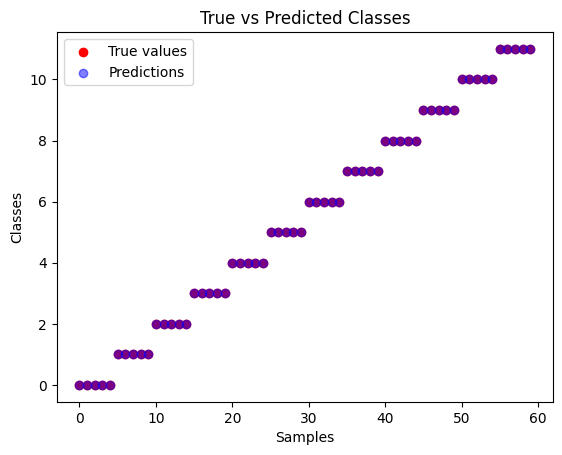

In [41]:
predictions = predict_with_course_lvl(model_v3, answers_train, knowledge_lvl_questions)
predictions = np.argmax(predictions, axis=1)
plt.scatter(range(len(course_train)), course_train, label='True values', color='red')
plt.scatter(range(len(predictions)), predictions, label='Predictions', color='blue', alpha=0.5)
plt.xlabel('Samples')
plt.ylabel('Classes')
plt.legend()
plt.title('True vs Predicted Classes')
plt.show()

In [42]:
def test_error_J(predicted, actual):
    if len(predicted) != len(actual):
        raise ValueError('Actual array length doesnt equals to predicted array length')
    total = len(predicted)
    correct = 0
    for i in range(total):
        if predicted[i] in actual[i]:
            correct += 1
    return correct / total

In [43]:
predictions_test = model_v3.predict(answers_test_no_lvl)
predictions_test = np.argmax(predictions_test, axis=1)

print('J_test: ', test_error_J(predictions_test, course_test))
print(predictions_test)
print(course_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
J_test:  0.4166666666666667
[ 3 10  8  3  4  9  8  5  3  3  8  7]
[[ 0  3  8]
 [ 1 10 -1]
 [ 2  6 -1]
 [ 3  0  8]
 [ 4 -1 -1]
 [ 5 -1 -1]
 [ 6  2 -1]
 [ 7 -1 -1]
 [ 8  0  3]
 [ 9 -1 -1]
 [10  1 -1]
 [11  6  2]]


In [44]:
neurons_options = [8, 16, 24, 32, 48, 64]
num_layers_options = [1, 2, 3, 4]

best_score = 0
best_model = []
best_config = []

# Check different layers amount
for num_layers in num_layers_options:
    # check different neurons amount
    for neuron_config in product(neurons_options, repeat=num_layers):
        print(f"Testing configuration: {num_layers} layers, neurnons {neuron_config}")

        # Создаём модель
        model = Sequential()
        model.add(tf.keras.Input(shape=(30,)))  # Input layer
        for neurons in neuron_config:
            model.add(Dense(neurons, activation='relu')) # Adding hidden layers
        model.add(Dense(12, activation='softmax'))  # Output layer

        # Компиляция
        model.compile(
            loss=tf.keras.losses.SparseCategoricalCrossentropy(),
            optimizer=tf.keras.optimizers.Adam(0.005),  # Learning rate уменьшили
        )

        # Обучение на тренировочном наборе
        model.fit(answers_train_no_lvl, course_train, epochs=50, verbose=0)

        # Оценка на валидации
        predictions_dev = np.argmax(predict_with_course_lvl(model, answers_dev, knowledge_lvl_questions), axis=1)
        score = test_error_J(predictions_dev, course_dev)
        print(f"Модель {model.summary()} дала точность {score:.4f} на валидации")

        # Запоминаем лучшую модель
        if score > best_score or score >= 1.0:
            best_score = score
            best_model.append(model)
            best_config.append(neuron_config)

# Final Testing on answers_test
#predictions_test = np.argmax(predict_with_course_lvl(best_model, answers_test), axis=1)
#test_score = test_error_J(predictions_test, course_test)
#print(f"\Best architecture: {best_config[0]} layers, {best_config[1]} neurons")
print(f"Best model shown accuracy {test_score:.4f} on test data set")

Тестируем конфигурацию: 1 слоёв, нейроны (8,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,070 (4.18 KB)

 Trainable params: 356 (1.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 714 (2.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 1 слоёв, нейроны (16,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                      │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,102 (8.21 KB)

 Trainable params: 700 (2.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,402 (5.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 1 слоёв, нейроны (24,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                      │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,134 (12.25 KB)

 Trainable params: 1,044 (4.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,090 (8.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 1 слоёв, нейроны (32,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                      │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,166 (16.28 KB)

 Trainable params: 1,388 (5.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,778 (10.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 1 слоёв, нейроны (48,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_8 (Dense)                      │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,230 (24.34 KB)

 Trainable params: 2,076 (8.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,154 (16.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 1 слоёв, нейроны (64,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                     │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,294 (32.40 KB)

 Trainable params: 2,764 (10.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,530 (21.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_12 (Dense)                     │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,286 (5.03 KB)

 Trainable params: 428 (1.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 858 (3.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_15 (Dense)                     │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,790 (7.00 KB)

 Trainable params: 596 (2.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,194 (4.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                     │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,294 (8.96 KB)

 Trainable params: 764 (2.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,530 (5.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                     │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,798 (10.93 KB)

 Trainable params: 932 (3.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,866 (7.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                     │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,806 (14.87 KB)

 Trainable params: 1,268 (4.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,538 (9.92 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_27 (Dense)                     │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,814 (18.81 KB)

 Trainable params: 1,604 (6.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,210 (12.54 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_30 (Dense)                     │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,222 (8.68 KB)

 Trainable params: 740 (2.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,482 (5.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_33 (Dense)                     │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,918 (11.40 KB)

 Trainable params: 972 (3.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,946 (7.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                     │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,614 (14.12 KB)

 Trainable params: 1,204 (4.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,410 (9.42 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_39 (Dense)                     │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,310 (16.84 KB)

 Trainable params: 1,436 (5.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,874 (11.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                     │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_44 (Dense)                     │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,702 (22.28 KB)

 Trainable params: 1,900 (7.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,802 (14.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_45 (Dense)                     │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_46 (Dense)                     │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_47 (Dense)                     │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,094 (27.71 KB)

 Trainable params: 2,364 (9.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,730 (18.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                     │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_49 (Dense)                     │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_50 (Dense)                     │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,158 (12.34 KB)

 Trainable params: 1,052 (4.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,106 (8.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_51 (Dense)                     │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_52 (Dense)                     │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_53 (Dense)                     │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,046 (15.81 KB)

 Trainable params: 1,348 (5.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,698 (10.54 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_54 (Dense)                     │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_55 (Dense)                     │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_56 (Dense)                     │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,934 (19.28 KB)

 Trainable params: 1,644 (6.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,290 (12.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_57 (Dense)                     │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_58 (Dense)                     │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_59 (Dense)                     │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,822 (22.75 KB)

 Trainable params: 1,940 (7.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,882 (15.17 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                     │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_61 (Dense)                     │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_62 (Dense)                     │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,598 (29.68 KB)

 Trainable params: 2,532 (9.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,066 (19.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                     │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_64 (Dense)                     │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_65 (Dense)                     │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,374 (36.62 KB)

 Trainable params: 3,124 (12.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,250 (24.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_66 (Dense)                     │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_67 (Dense)                     │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_68 (Dense)                     │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,094 (16.00 KB)

 Trainable params: 1,364 (5.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,730 (10.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_69 (Dense)                     │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_70 (Dense)                     │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_71 (Dense)                     │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,174 (20.21 KB)

 Trainable params: 1,724 (6.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,450 (13.48 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                     │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_73 (Dense)                     │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_74 (Dense)                     │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,254 (24.43 KB)

 Trainable params: 2,084 (8.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,170 (16.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_75 (Dense)                     │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_76 (Dense)                     │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_77 (Dense)                     │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,334 (28.65 KB)

 Trainable params: 2,444 (9.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,890 (19.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_78 (Dense)                     │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_79 (Dense)                     │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_80 (Dense)                     │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,494 (37.09 KB)

 Trainable params: 3,164 (12.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,330 (24.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_81 (Dense)                     │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_82 (Dense)                     │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_83 (Dense)                     │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,654 (45.53 KB)

 Trainable params: 3,884 (15.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,770 (30.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                     │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_85 (Dense)                     │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_86 (Dense)                     │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,966 (23.31 KB)

 Trainable params: 1,988 (7.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,978 (15.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_87 (Dense)                     │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_88 (Dense)                     │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_89 (Dense)                     │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,430 (29.03 KB)

 Trainable params: 2,476 (9.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,954 (19.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_90 (Dense)                     │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_91 (Dense)                     │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_92 (Dense)                     │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,894 (34.75 KB)

 Trainable params: 2,964 (11.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,930 (23.17 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_93 (Dense)                     │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_94 (Dense)                     │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_95 (Dense)                     │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,358 (40.46 KB)

 Trainable params: 3,452 (13.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,906 (26.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                     │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_97 (Dense)                     │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_98 (Dense)                     │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,286 (51.90 KB)

 Trainable params: 4,428 (17.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,858 (34.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_99 (Dense)                     │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_100 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_101 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,214 (63.34 KB)

 Trainable params: 5,404 (21.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,810 (42.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_102 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_103 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_104 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,838 (30.62 KB)

 Trainable params: 2,612 (10.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,226 (20.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_106 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_107 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,686 (37.84 KB)

 Trainable params: 3,228 (12.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,458 (25.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_109 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_110 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,534 (45.06 KB)

 Trainable params: 3,844 (15.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,690 (30.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_111 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_112 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_113 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,382 (52.28 KB)

 Trainable params: 4,460 (17.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,922 (34.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_114 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_115 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_116 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,078 (66.71 KB)

 Trainable params: 5,692 (22.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,386 (44.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 2 слоёв, нейроны (64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_117 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_118 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_119 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,774 (81.15 KB)

 Trainable params: 6,924 (27.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,850 (54.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_121 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_122 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_123 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,502 (5.87 KB)

 Trainable params: 500 (1.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,002 (3.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_125 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_126 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_127 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,006 (7.84 KB)

 Trainable params: 668 (2.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,338 (5.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_129 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_130 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_131 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,510 (9.81 KB)

 Trainable params: 836 (3.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,674 (6.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_133 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_134 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_135 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,014 (11.78 KB)

 Trainable params: 1,004 (3.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,010 (7.86 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_137 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_138 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_139 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,022 (15.71 KB)

 Trainable params: 1,340 (5.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,682 (10.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_141 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_142 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_143 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,030 (19.65 KB)

 Trainable params: 1,676 (6.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,354 (13.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_145 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_146 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_147 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,910 (7.46 KB)

 Trainable params: 636 (2.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,274 (4.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_149 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_150 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_151 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,606 (10.18 KB)

 Trainable params: 868 (3.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,738 (6.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_153 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_154 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_155 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,302 (12.90 KB)

 Trainable params: 1,100 (4.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,202 (8.61 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_157 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_158 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_159 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,998 (15.62 KB)

 Trainable params: 1,332 (5.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,666 (10.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_161 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_162 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_163 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,390 (21.06 KB)

 Trainable params: 1,796 (7.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,594 (14.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_164 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_165 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_166 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_167 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,782 (26.50 KB)

 Trainable params: 2,260 (8.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,522 (17.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_169 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_170 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_171 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,318 (9.06 KB)

 Trainable params: 772 (3.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,546 (6.04 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_172 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_173 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_174 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_175 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,206 (12.53 KB)

 Trainable params: 1,068 (4.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,138 (8.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_176 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_177 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_178 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_179 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,094 (16.00 KB)

 Trainable params: 1,364 (5.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,730 (10.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_180 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_181 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_182 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_183 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,982 (19.46 KB)

 Trainable params: 1,660 (6.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,322 (12.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_184 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_185 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_186 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_187 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,758 (26.40 KB)

 Trainable params: 2,252 (8.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,506 (17.61 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_188 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_189 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_190 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_191 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,534 (33.34 KB)

 Trainable params: 2,844 (11.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,690 (22.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_192 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_193 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_194 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_195 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,726 (10.65 KB)

 Trainable params: 908 (3.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,818 (7.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_197 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_198 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_199 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,806 (14.87 KB)

 Trainable params: 1,268 (4.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,538 (9.92 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_200 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_201 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_202 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_203 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,886 (19.09 KB)

 Trainable params: 1,628 (6.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,258 (12.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_204 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_205 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_206 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_207 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,966 (23.31 KB)

 Trainable params: 1,988 (7.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,978 (15.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_208 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_209 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_210 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_211 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,126 (31.75 KB)

 Trainable params: 2,708 (10.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,418 (21.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_212 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_213 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_214 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_215 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,286 (40.18 KB)

 Trainable params: 3,428 (13.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,858 (26.79 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_216 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_217 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_218 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_219 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,542 (13.84 KB)

 Trainable params: 1,180 (4.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,362 (9.23 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_220 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_221 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_222 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_223 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,006 (19.56 KB)

 Trainable params: 1,668 (6.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,338 (13.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_225 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_226 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_227 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,470 (25.28 KB)

 Trainable params: 2,156 (8.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,314 (16.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_228 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_229 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_230 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_231 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,934 (31.00 KB)

 Trainable params: 2,644 (10.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,290 (20.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_232 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_233 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_234 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_235 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,862 (42.43 KB)

 Trainable params: 3,620 (14.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,242 (28.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_236 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_237 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_238 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_239 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,790 (53.87 KB)

 Trainable params: 4,596 (17.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,194 (35.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_240 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_241 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_242 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_243 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,358 (17.03 KB)

 Trainable params: 1,452 (5.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,906 (11.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_244 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_245 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_246 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_247 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,206 (24.25 KB)

 Trainable params: 2,068 (8.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,138 (16.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_248 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_249 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_250 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_251 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_253 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_254 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_255 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,902 (38.68 KB)

 Trainable params: 3,300 (12.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,602 (25.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_256 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_257 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_258 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_259 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,598 (53.12 KB)

 Trainable params: 4,532 (17.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,066 (35.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (8, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_260 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_261 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_262 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_263 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,294 (67.56 KB)

 Trainable params: 5,764 (22.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,530 (45.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_264 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_265 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_266 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_267 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,438 (9.53 KB)

 Trainable params: 812 (3.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,626 (6.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_268 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_269 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_270 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_271 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,942 (11.50 KB)

 Trainable params: 980 (3.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,962 (7.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_272 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_273 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_274 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_275 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,446 (13.46 KB)

 Trainable params: 1,148 (4.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,298 (8.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_276 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_277 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_278 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_279 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,950 (15.43 KB)

 Trainable params: 1,316 (5.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,634 (10.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_281 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_282 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_283 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,958 (19.37 KB)

 Trainable params: 1,652 (6.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,306 (12.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_284 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_285 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_286 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_287 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,966 (23.31 KB)

 Trainable params: 1,988 (7.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,978 (15.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_288 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_289 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_290 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_291 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,038 (11.87 KB)

 Trainable params: 1,012 (3.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,026 (7.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_292 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_293 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_294 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_295 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,734 (14.59 KB)

 Trainable params: 1,244 (4.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,490 (9.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_296 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_297 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_298 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_299 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,430 (17.31 KB)

 Trainable params: 1,476 (5.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,954 (11.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_300 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_301 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_302 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_303 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,126 (20.03 KB)

 Trainable params: 1,708 (6.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,418 (13.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_304 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_305 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_306 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_307 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,518 (25.46 KB)

 Trainable params: 2,172 (8.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,346 (16.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_309 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_310 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_311 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,910 (30.90 KB)

 Trainable params: 2,636 (10.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,274 (20.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_312 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_313 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_314 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_315 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,638 (14.21 KB)

 Trainable params: 1,212 (4.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,426 (9.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_316 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_317 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_318 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_319 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,526 (17.68 KB)

 Trainable params: 1,508 (5.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,018 (11.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_320 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_321 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_322 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_323 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,414 (21.15 KB)

 Trainable params: 1,804 (7.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,610 (14.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_324 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_325 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_326 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_327 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,302 (24.62 KB)

 Trainable params: 2,100 (8.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,202 (16.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_328 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_329 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_330 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_331 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,078 (31.56 KB)

 Trainable params: 2,692 (10.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,386 (21.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_332 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_333 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_334 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_335 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,854 (38.50 KB)

 Trainable params: 3,284 (12.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,570 (25.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_337 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_338 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_339 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,238 (16.56 KB)

 Trainable params: 1,412 (5.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,826 (11.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_340 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_341 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_342 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_343 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,318 (20.78 KB)

 Trainable params: 1,772 (6.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,546 (13.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_344 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_345 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_346 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_347 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,398 (25.00 KB)

 Trainable params: 2,132 (8.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,266 (16.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_348 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_349 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_350 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_351 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,478 (29.21 KB)

 Trainable params: 2,492 (9.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,986 (19.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_352 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_353 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_354 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_355 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,638 (37.65 KB)

 Trainable params: 3,212 (12.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,426 (25.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_356 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_357 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_358 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_359 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,798 (46.09 KB)

 Trainable params: 3,932 (15.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,866 (30.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_360 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_361 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_362 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_363 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,438 (21.25 KB)

 Trainable params: 1,812 (7.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,626 (14.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_365 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_366 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_367 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,902 (26.96 KB)

 Trainable params: 2,300 (8.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,602 (17.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_368 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_369 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_370 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_371 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,366 (32.68 KB)

 Trainable params: 2,788 (10.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,578 (21.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_372 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_373 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_374 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_375 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,830 (38.40 KB)

 Trainable params: 3,276 (12.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,554 (25.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_376 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_377 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_378 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_379 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,758 (49.84 KB)

 Trainable params: 4,252 (16.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,506 (33.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_380 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_381 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_382 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_383 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,686 (61.28 KB)

 Trainable params: 5,228 (20.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,458 (40.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_384 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_385 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_386 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_387 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,638 (25.93 KB)

 Trainable params: 2,212 (8.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,426 (17.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_388 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_389 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_390 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_391 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,486 (33.15 KB)

 Trainable params: 2,828 (11.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,658 (22.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_393 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_394 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_395 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,334 (40.37 KB)

 Trainable params: 3,444 (13.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,890 (26.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_396 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_397 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_398 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_399 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,182 (47.59 KB)

 Trainable params: 4,060 (15.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,122 (31.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_400 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_401 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_402 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_403 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,878 (62.03 KB)

 Trainable params: 5,292 (20.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,586 (41.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (16, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_404 (Dense)                    │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_405 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_406 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_407 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,574 (76.46 KB)

 Trainable params: 6,524 (25.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,050 (50.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_408 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_409 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_410 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_411 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,374 (13.18 KB)

 Trainable params: 1,124 (4.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,250 (8.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_412 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_413 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_414 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_415 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,878 (15.15 KB)

 Trainable params: 1,292 (5.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,586 (10.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_416 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_417 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_418 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_419 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,382 (17.12 KB)

 Trainable params: 1,460 (5.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,922 (11.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_421 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_422 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_423 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,886 (19.09 KB)

 Trainable params: 1,628 (6.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,258 (12.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_424 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_425 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_426 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_427 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,894 (23.03 KB)

 Trainable params: 1,964 (7.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,930 (15.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_428 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_429 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_430 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_431 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,902 (26.96 KB)

 Trainable params: 2,300 (8.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,602 (17.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_432 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_433 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_434 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_435 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,166 (16.28 KB)

 Trainable params: 1,388 (5.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,778 (10.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_436 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_437 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_438 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_439 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,862 (19.00 KB)

 Trainable params: 1,620 (6.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,242 (12.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_440 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_441 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_442 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_443 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,558 (21.71 KB)

 Trainable params: 1,852 (7.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,706 (14.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_444 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_445 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_446 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_447 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,254 (24.43 KB)

 Trainable params: 2,084 (8.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,170 (16.29 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_449 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_450 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_451 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,646 (29.87 KB)

 Trainable params: 2,548 (9.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,098 (19.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_452 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_453 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_454 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_455 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,038 (35.31 KB)

 Trainable params: 3,012 (11.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,026 (23.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_456 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_457 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_458 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_459 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,958 (19.37 KB)

 Trainable params: 1,652 (6.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,306 (12.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_460 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_461 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_462 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_463 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,846 (22.84 KB)

 Trainable params: 1,948 (7.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,898 (15.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_464 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_465 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_466 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_467 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,734 (26.31 KB)

 Trainable params: 2,244 (8.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,490 (17.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_468 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_469 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_470 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_471 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,622 (29.78 KB)

 Trainable params: 2,540 (9.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,082 (19.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_472 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_473 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_474 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_475 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,398 (36.71 KB)

 Trainable params: 3,132 (12.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,266 (24.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_477 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_478 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_479 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,174 (43.65 KB)

 Trainable params: 3,724 (14.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,450 (29.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_480 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_481 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_482 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_483 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,750 (22.46 KB)

 Trainable params: 1,916 (7.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,834 (14.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_484 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_485 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_486 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_487 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,830 (26.68 KB)

 Trainable params: 2,276 (8.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,554 (17.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_488 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_489 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_490 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_491 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,910 (30.90 KB)

 Trainable params: 2,636 (10.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,274 (20.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_492 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_493 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_494 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_495 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,990 (35.12 KB)

 Trainable params: 2,996 (11.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,994 (23.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_496 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_497 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_498 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_499 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,150 (43.56 KB)

 Trainable params: 3,716 (14.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,434 (29.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_500 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_501 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_502 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_503 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,310 (52.00 KB)

 Trainable params: 4,436 (17.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,874 (34.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_505 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_506 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_507 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,334 (28.65 KB)

 Trainable params: 2,444 (9.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,890 (19.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_508 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_509 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_510 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_511 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,798 (34.37 KB)

 Trainable params: 2,932 (11.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,866 (22.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_512 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_513 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_514 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_515 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,262 (40.09 KB)

 Trainable params: 3,420 (13.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,842 (26.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_516 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_517 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_518 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_519 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,726 (45.81 KB)

 Trainable params: 3,908 (15.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,818 (30.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_520 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_521 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_522 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_523 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,654 (57.25 KB)

 Trainable params: 4,884 (19.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,770 (38.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_524 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_525 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_526 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_527 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,582 (68.68 KB)

 Trainable params: 5,860 (22.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,722 (45.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_528 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_529 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_530 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_531 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,918 (34.84 KB)

 Trainable params: 2,972 (11.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,946 (23.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_533 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_534 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_535 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,766 (42.06 KB)

 Trainable params: 3,588 (14.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,178 (28.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_536 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_537 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_538 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_539 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,614 (49.28 KB)

 Trainable params: 4,204 (16.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,410 (32.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_540 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_541 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_542 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_543 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,462 (56.50 KB)

 Trainable params: 4,820 (18.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,642 (37.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_544 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_545 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_546 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_547 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,158 (70.93 KB)

 Trainable params: 6,052 (23.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,106 (47.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (24, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_548 (Dense)                    │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_549 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_550 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_551 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,854 (85.37 KB)

 Trainable params: 7,284 (28.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,570 (56.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_552 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_553 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_554 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_555 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,310 (16.84 KB)

 Trainable params: 1,436 (5.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,874 (11.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_556 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_557 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_558 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_559 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,814 (18.81 KB)

 Trainable params: 1,604 (6.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,210 (12.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_561 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_562 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_563 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,318 (20.78 KB)

 Trainable params: 1,772 (6.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,546 (13.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_564 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_565 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_566 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_567 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,822 (22.75 KB)

 Trainable params: 1,940 (7.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,882 (15.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_568 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_569 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_570 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_571 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,830 (26.68 KB)

 Trainable params: 2,276 (8.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,554 (17.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_572 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_573 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_574 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_575 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,838 (30.62 KB)

 Trainable params: 2,612 (10.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,226 (20.42 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_576 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_577 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_578 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_579 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,294 (20.68 KB)

 Trainable params: 1,764 (6.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,530 (13.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_580 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_581 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_582 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_583 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,990 (23.40 KB)

 Trainable params: 1,996 (7.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,994 (15.61 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_584 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_585 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_586 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_587 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,686 (26.12 KB)

 Trainable params: 2,228 (8.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,458 (17.42 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_589 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_590 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_591 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,382 (28.84 KB)

 Trainable params: 2,460 (9.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,922 (19.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_592 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_593 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_594 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_595 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,774 (34.28 KB)

 Trainable params: 2,924 (11.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,850 (22.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_596 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_597 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_598 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_599 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,166 (39.71 KB)

 Trainable params: 3,388 (13.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,778 (26.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_600 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_601 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_602 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_603 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,278 (24.53 KB)

 Trainable params: 2,092 (8.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,186 (16.36 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_604 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_605 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_606 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_607 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,166 (28.00 KB)

 Trainable params: 2,388 (9.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,778 (18.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_608 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_609 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_610 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_611 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_612 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_613 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_614 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_615 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,942 (34.93 KB)

 Trainable params: 2,980 (11.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,962 (23.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_617 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_618 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_619 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,718 (41.87 KB)

 Trainable params: 3,572 (13.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,146 (27.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_620 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_621 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_622 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_623 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,494 (48.81 KB)

 Trainable params: 4,164 (16.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,330 (32.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_624 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_625 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_626 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_627 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,262 (28.37 KB)

 Trainable params: 2,420 (9.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,842 (18.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_628 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_629 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_630 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_631 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,342 (32.59 KB)

 Trainable params: 2,780 (10.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,562 (21.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_632 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_633 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_634 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_635 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,422 (36.81 KB)

 Trainable params: 3,140 (12.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,282 (24.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_636 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_637 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_638 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_639 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,502 (41.03 KB)

 Trainable params: 3,500 (13.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,002 (27.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_640 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_641 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_642 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_643 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,662 (49.46 KB)

 Trainable params: 4,220 (16.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,442 (32.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_645 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_646 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_647 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,822 (57.90 KB)

 Trainable params: 4,940 (19.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,882 (38.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_648 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_649 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_650 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_651 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,230 (36.06 KB)

 Trainable params: 3,076 (12.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,154 (24.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_652 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_653 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_654 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_655 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,694 (41.78 KB)

 Trainable params: 3,564 (13.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,130 (27.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_656 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_657 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_658 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_659 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,158 (47.50 KB)

 Trainable params: 4,052 (15.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,106 (31.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_660 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_661 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_662 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_663 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,622 (53.21 KB)

 Trainable params: 4,540 (17.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,082 (35.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_664 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_665 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_666 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_667 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,550 (64.65 KB)

 Trainable params: 5,516 (21.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,034 (43.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_668 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_669 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_670 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_671 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,478 (76.09 KB)

 Trainable params: 6,492 (25.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,986 (50.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_673 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_674 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_675 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,198 (43.75 KB)

 Trainable params: 3,732 (14.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,466 (29.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_676 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_677 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_678 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_679 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,046 (50.96 KB)

 Trainable params: 4,348 (16.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,698 (33.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_680 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_681 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_682 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_683 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,894 (58.18 KB)

 Trainable params: 4,964 (19.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,930 (38.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_684 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_685 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_686 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_687 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,742 (65.40 KB)

 Trainable params: 5,580 (21.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,162 (43.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_688 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_689 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_690 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_691 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,438 (79.84 KB)

 Trainable params: 6,812 (26.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,626 (53.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (32, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_692 (Dense)                    │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_693 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_694 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_695 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,134 (94.28 KB)

 Trainable params: 8,044 (31.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,090 (62.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_696 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_697 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_698 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_699 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,182 (24.15 KB)

 Trainable params: 2,060 (8.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,122 (16.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_701 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_702 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_703 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,686 (26.12 KB)

 Trainable params: 2,228 (8.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,458 (17.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_704 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_705 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_706 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_707 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,190 (28.09 KB)

 Trainable params: 2,396 (9.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,794 (18.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_708 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_709 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_710 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_711 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,694 (30.06 KB)

 Trainable params: 2,564 (10.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,130 (20.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_712 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_713 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_714 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_715 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,702 (34.00 KB)

 Trainable params: 2,900 (11.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,802 (22.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_716 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_717 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_718 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_719 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,710 (37.93 KB)

 Trainable params: 3,236 (12.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,474 (25.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_720 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_721 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_722 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_723 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,550 (29.50 KB)

 Trainable params: 2,516 (9.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,034 (19.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_724 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_725 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_726 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_727 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,246 (32.21 KB)

 Trainable params: 2,748 (10.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,498 (21.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_729 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_730 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_731 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,942 (34.93 KB)

 Trainable params: 2,980 (11.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,962 (23.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_732 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_733 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_734 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_735 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,638 (37.65 KB)

 Trainable params: 3,212 (12.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,426 (25.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_736 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_737 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_738 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_739 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,030 (43.09 KB)

 Trainable params: 3,676 (14.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,354 (28.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_740 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_741 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_742 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_743 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,422 (48.53 KB)

 Trainable params: 4,140 (16.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,282 (32.36 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_744 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_745 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_746 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_747 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,918 (34.84 KB)

 Trainable params: 2,972 (11.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,946 (23.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_748 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_749 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_750 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_751 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,806 (38.31 KB)

 Trainable params: 3,268 (12.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,538 (25.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_752 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_753 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_754 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_755 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,694 (41.78 KB)

 Trainable params: 3,564 (13.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,130 (27.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_757 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_758 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_759 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,582 (45.25 KB)

 Trainable params: 3,860 (15.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,722 (30.17 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_760 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_761 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_762 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_763 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,358 (52.18 KB)

 Trainable params: 4,452 (17.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,906 (34.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_764 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_765 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_766 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_767 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,134 (59.12 KB)

 Trainable params: 5,044 (19.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,090 (39.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_768 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_769 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_770 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_771 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,286 (40.18 KB)

 Trainable params: 3,428 (13.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,858 (26.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_772 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_773 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_774 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_775 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,366 (44.40 KB)

 Trainable params: 3,788 (14.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,578 (29.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_776 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_777 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_778 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_779 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,446 (48.62 KB)

 Trainable params: 4,148 (16.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,298 (32.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_780 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_781 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_782 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_783 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,526 (52.84 KB)

 Trainable params: 4,508 (17.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,018 (35.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_785 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_786 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_787 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,686 (61.28 KB)

 Trainable params: 5,228 (20.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,458 (40.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_788 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_789 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_790 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_791 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,846 (69.71 KB)

 Trainable params: 5,948 (23.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,898 (46.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_792 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_793 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_794 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_795 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,022 (50.87 KB)

 Trainable params: 4,340 (16.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,682 (33.92 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_796 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_797 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_798 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_799 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,486 (56.59 KB)

 Trainable params: 4,828 (18.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,658 (37.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_800 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_801 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_802 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_803 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,950 (62.31 KB)

 Trainable params: 5,316 (20.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,634 (41.54 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_804 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_805 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_806 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_807 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,414 (68.03 KB)

 Trainable params: 5,804 (22.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,610 (45.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_808 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_809 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_810 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_811 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,342 (79.46 KB)

 Trainable params: 6,780 (26.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,562 (52.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_813 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_814 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_815 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,270 (90.90 KB)

 Trainable params: 7,756 (30.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,514 (60.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_816 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_817 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_818 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_819 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,758 (61.56 KB)

 Trainable params: 5,252 (20.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,506 (41.04 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_820 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_821 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_822 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_823 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,606 (68.78 KB)

 Trainable params: 5,868 (22.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,738 (45.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_824 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_825 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_826 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_827 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,454 (76.00 KB)

 Trainable params: 6,484 (25.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,970 (50.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_828 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_829 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_830 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_831 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,302 (83.21 KB)

 Trainable params: 7,100 (27.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,202 (55.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_832 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_833 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_834 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_835 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,998 (97.65 KB)

 Trainable params: 8,332 (32.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,666 (65.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (48, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_226"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_836 (Dense)                    │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_837 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_838 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_839 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,694 (112.09 KB)

 Trainable params: 9,564 (37.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,130 (74.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_227"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_841 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_842 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_843 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_228"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_844 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_845 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_846 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_847 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,558 (33.43 KB)

 Trainable params: 2,852 (11.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,706 (22.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_229"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_848 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_849 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_850 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_851 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,062 (35.40 KB)

 Trainable params: 3,020 (11.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,042 (23.61 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_230"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_852 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_853 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_854 (Dense)                    │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_855 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,566 (37.37 KB)

 Trainable params: 3,188 (12.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,378 (24.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_231"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_856 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_857 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_858 (Dense)                    │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_859 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,574 (41.31 KB)

 Trainable params: 3,524 (13.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,050 (27.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_232"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_860 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_861 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_862 (Dense)                    │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_863 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,582 (45.25 KB)

 Trainable params: 3,860 (15.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,722 (30.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_233"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_864 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_865 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_866 (Dense)                    │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_867 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,806 (38.31 KB)

 Trainable params: 3,268 (12.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,538 (25.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_869 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_870 (Dense)                    │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_871 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,502 (41.03 KB)

 Trainable params: 3,500 (13.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,002 (27.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_872 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_873 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_874 (Dense)                    │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_875 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,198 (43.75 KB)

 Trainable params: 3,732 (14.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,466 (29.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_876 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_877 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_878 (Dense)                    │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_879 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,894 (46.46 KB)

 Trainable params: 3,964 (15.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,930 (30.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_880 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_881 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_882 (Dense)                    │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_883 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,286 (51.90 KB)

 Trainable params: 4,428 (17.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,858 (34.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_884 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_885 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_886 (Dense)                    │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_887 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,678 (57.34 KB)

 Trainable params: 4,892 (19.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,786 (38.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_888 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_889 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_890 (Dense)                    │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_891 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,558 (45.15 KB)

 Trainable params: 3,852 (15.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,706 (30.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_892 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_893 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_894 (Dense)                    │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_895 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,446 (48.62 KB)

 Trainable params: 4,148 (16.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,298 (32.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_897 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_898 (Dense)                    │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_899 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,334 (52.09 KB)

 Trainable params: 4,444 (17.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,890 (34.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_900 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_901 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_902 (Dense)                    │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_903 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,222 (55.56 KB)

 Trainable params: 4,740 (18.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,482 (37.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_904 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_905 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_906 (Dense)                    │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_907 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,998 (62.50 KB)

 Trainable params: 5,332 (20.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,666 (41.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_908 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_909 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_910 (Dense)                    │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_911 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,774 (69.43 KB)

 Trainable params: 5,924 (23.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,850 (46.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_912 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_913 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_914 (Dense)                    │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_915 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,310 (52.00 KB)

 Trainable params: 4,436 (17.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,874 (34.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_916 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_917 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_918 (Dense)                    │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_919 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,390 (56.21 KB)

 Trainable params: 4,796 (18.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,594 (37.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_920 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_921 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_922 (Dense)                    │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_923 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,470 (60.43 KB)

 Trainable params: 5,156 (20.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,314 (40.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_925 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_926 (Dense)                    │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_927 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,550 (64.65 KB)

 Trainable params: 5,516 (21.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,034 (43.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_928 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_929 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_930 (Dense)                    │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_931 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,710 (73.09 KB)

 Trainable params: 6,236 (24.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,474 (48.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_932 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_933 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_934 (Dense)                    │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_935 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,870 (81.53 KB)

 Trainable params: 6,956 (27.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,914 (54.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_936 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_937 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_938 (Dense)                    │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_939 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,814 (65.68 KB)

 Trainable params: 5,604 (21.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,210 (43.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_940 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_941 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_942 (Dense)                    │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_943 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,278 (71.40 KB)

 Trainable params: 6,092 (23.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,186 (47.61 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_944 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_945 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_946 (Dense)                    │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_947 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,742 (77.12 KB)

 Trainable params: 6,580 (25.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,162 (51.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_948 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_949 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_950 (Dense)                    │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_951 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,206 (82.84 KB)

 Trainable params: 7,068 (27.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,138 (55.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_953 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_954 (Dense)                    │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_955 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,134 (94.28 KB)

 Trainable params: 8,044 (31.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,090 (62.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_956 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_957 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_958 (Dense)                    │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_959 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,062 (105.71 KB)

 Trainable params: 9,020 (35.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,042 (70.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_960 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_961 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_962 (Dense)                    │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_963 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,318 (79.37 KB)

 Trainable params: 6,772 (26.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,546 (52.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_964 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_965 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_966 (Dense)                    │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_967 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,166 (86.59 KB)

 Trainable params: 7,388 (28.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,778 (57.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Model: "sequential_259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_968 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_969 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_970 (Dense)                    │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_971 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,014 (93.81 KB)

 Trainable params: 8,004 (31.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,010 (62.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_972 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_973 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_974 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_975 (Dense)                    │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,862 (101.03 KB)

 Trainable params: 8,620 (33.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,242 (67.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_976 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_977 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_978 (Dense)                    │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_979 (Dense)                    │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,558 (115.46 KB)

 Trainable params: 9,852 (38.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,706 (76.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 3 слоёв, нейроны (64, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Model: "sequential_262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)                    │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_981 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_982 (Dense)                    │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_983 (Dense)                    │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 33,254 (129.90 KB)

 Trainable params: 11,084 (43.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,170 (86.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_984 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_985 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_986 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_987 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_988 (Dense)                    │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,718 (6.71 KB)

 Trainable params: 572 (2.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,146 (4.48 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_989 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_990 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_991 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_992 (Dense)                    │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_993 (Dense)                    │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,222 (8.68 KB)

 Trainable params: 740 (2.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,482 (5.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_995 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_996 (Dense)                    │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_997 (Dense)                    │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_998 (Dense)                    │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,726 (10.65 KB)

 Trainable params: 908 (3.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,818 (7.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)                    │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1000 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1001 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1002 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1003 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,230 (12.62 KB)

 Trainable params: 1,076 (4.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,154 (8.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1004 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1005 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1006 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1007 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1008 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,238 (16.56 KB)

 Trainable params: 1,412 (5.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,826 (11.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1009 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1010 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1011 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1012 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1013 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,246 (20.50 KB)

 Trainable params: 1,748 (6.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,498 (13.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1015 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1016 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1017 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1018 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,126 (8.31 KB)

 Trainable params: 708 (2.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,418 (5.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1019 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1020 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1021 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1022 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1023 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,822 (11.03 KB)

 Trainable params: 940 (3.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,882 (7.36 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1024 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1025 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1026 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1027 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1028 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,518 (13.75 KB)

 Trainable params: 1,172 (4.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,346 (9.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1030 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1031 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1032 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1033 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,214 (16.46 KB)

 Trainable params: 1,404 (5.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,810 (10.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1034 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1035 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1036 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1037 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1038 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,606 (21.90 KB)

 Trainable params: 1,868 (7.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,738 (14.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1039 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1040 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1041 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1042 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1043 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,998 (27.34 KB)

 Trainable params: 2,332 (9.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,666 (18.23 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1045 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1046 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1047 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1048 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,534 (9.90 KB)

 Trainable params: 844 (3.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,690 (6.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1049 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1050 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1051 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1052 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1053 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,422 (13.37 KB)

 Trainable params: 1,140 (4.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,282 (8.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1054 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1055 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1056 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1057 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1058 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,310 (16.84 KB)

 Trainable params: 1,436 (5.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,874 (11.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1060 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1061 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1062 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1063 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,198 (20.31 KB)

 Trainable params: 1,732 (6.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,466 (13.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1065 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1066 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1067 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1068 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,974 (27.25 KB)

 Trainable params: 2,324 (9.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,650 (18.17 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1069 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1070 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1071 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1072 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1073 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,750 (34.18 KB)

 Trainable params: 2,916 (11.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,834 (22.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1075 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1076 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1077 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1078 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,942 (11.50 KB)

 Trainable params: 980 (3.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,962 (7.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1079 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1080 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1081 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1082 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1083 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,022 (15.71 KB)

 Trainable params: 1,340 (5.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,682 (10.48 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1084 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1085 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1086 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1087 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1088 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,102 (19.93 KB)

 Trainable params: 1,700 (6.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,402 (13.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1090 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1091 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1092 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1093 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,182 (24.15 KB)

 Trainable params: 2,060 (8.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,122 (16.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1094 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1095 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1096 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1097 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1098 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,342 (32.59 KB)

 Trainable params: 2,780 (10.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,562 (21.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1100 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1101 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1102 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1103 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,502 (41.03 KB)

 Trainable params: 3,500 (13.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,002 (27.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1104 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1105 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1106 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1107 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1108 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,758 (14.68 KB)

 Trainable params: 1,252 (4.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,506 (9.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1109 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1110 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1111 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1112 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1113 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,222 (20.40 KB)

 Trainable params: 1,740 (6.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,482 (13.61 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1114 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1115 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1116 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1117 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1118 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,686 (26.12 KB)

 Trainable params: 2,228 (8.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,458 (17.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1120 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1121 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1122 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1123 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,150 (31.84 KB)

 Trainable params: 2,716 (10.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,434 (21.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1124 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1125 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1126 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1127 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1128 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,078 (43.28 KB)

 Trainable params: 3,692 (14.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,386 (28.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1129 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1130 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1131 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1132 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1133 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,006 (54.71 KB)

 Trainable params: 4,668 (18.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,338 (36.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1135 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1136 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1137 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1138 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,574 (17.87 KB)

 Trainable params: 1,524 (5.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,050 (11.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1139 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1140 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1141 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1142 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1143 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,422 (25.09 KB)

 Trainable params: 2,140 (8.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,282 (16.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1144 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1145 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1146 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1147 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1148 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,270 (32.31 KB)

 Trainable params: 2,756 (10.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,514 (21.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1150 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1151 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1152 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1153 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,118 (39.53 KB)

 Trainable params: 3,372 (13.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,746 (26.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1154 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1155 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1156 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1157 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1158 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,814 (53.96 KB)

 Trainable params: 4,604 (17.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,210 (35.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 8, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1159 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1160 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1161 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1162 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1163 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,510 (68.40 KB)

 Trainable params: 5,836 (22.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,674 (45.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1165 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1166 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1167 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1168 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,126 (8.31 KB)

 Trainable params: 708 (2.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,418 (5.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1170 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1171 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1172 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1173 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,630 (10.28 KB)

 Trainable params: 876 (3.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,754 (6.86 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1174 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1175 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1176 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1177 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1178 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,134 (12.25 KB)

 Trainable params: 1,044 (4.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,090 (8.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1180 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1181 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1182 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1183 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,638 (14.21 KB)

 Trainable params: 1,212 (4.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,426 (9.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1184 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1185 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1186 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1187 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1188 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,646 (18.15 KB)

 Trainable params: 1,548 (6.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,098 (12.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1189 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1190 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1191 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1192 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1193 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,654 (22.09 KB)

 Trainable params: 1,884 (7.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,770 (14.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1195 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1196 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1197 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1198 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,726 (10.65 KB)

 Trainable params: 908 (3.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,818 (7.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1199 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1200 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1201 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1202 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1203 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,422 (13.37 KB)

 Trainable params: 1,140 (4.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,282 (8.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1205 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1206 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1207 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1208 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,118 (16.09 KB)

 Trainable params: 1,372 (5.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,746 (10.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1210 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1211 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1212 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1213 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,814 (18.81 KB)

 Trainable params: 1,604 (6.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,210 (12.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1214 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1215 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1216 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1217 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1218 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,206 (24.25 KB)

 Trainable params: 2,068 (8.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,138 (16.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1220 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1221 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1222 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1223 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,598 (29.68 KB)

 Trainable params: 2,532 (9.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,066 (19.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1224 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1225 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1226 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1227 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1228 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,326 (13.00 KB)

 Trainable params: 1,108 (4.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,218 (8.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1229 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1230 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1231 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1232 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1233 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,214 (16.46 KB)

 Trainable params: 1,404 (5.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,810 (10.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1234 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1235 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1236 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1237 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1238 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,102 (19.93 KB)

 Trainable params: 1,700 (6.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,402 (13.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1240 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1241 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1242 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1243 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,990 (23.40 KB)

 Trainable params: 1,996 (7.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,994 (15.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1244 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1245 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1246 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1247 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1248 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,766 (30.34 KB)

 Trainable params: 2,588 (10.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,178 (20.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1249 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1250 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1251 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1252 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1253 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,542 (37.28 KB)

 Trainable params: 3,180 (12.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,362 (24.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1254 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1255 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1256 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1257 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1258 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,926 (15.34 KB)

 Trainable params: 1,308 (5.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,618 (10.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1260 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1261 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1262 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1263 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,006 (19.56 KB)

 Trainable params: 1,668 (6.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,338 (13.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1264 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1265 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1266 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1267 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1268 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,086 (23.78 KB)

 Trainable params: 2,028 (7.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,058 (15.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1269 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1270 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1271 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1272 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1273 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,166 (28.00 KB)

 Trainable params: 2,388 (9.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,778 (18.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1275 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1276 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1277 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1278 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,326 (36.43 KB)

 Trainable params: 3,108 (12.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,218 (24.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1280 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1281 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1282 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1283 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,486 (44.87 KB)

 Trainable params: 3,828 (14.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,658 (29.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1284 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1285 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1286 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1287 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1288 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,126 (20.03 KB)

 Trainable params: 1,708 (6.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,418 (13.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1289 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1290 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1291 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1292 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1293 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,590 (25.75 KB)

 Trainable params: 2,196 (8.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,394 (17.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1294 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1295 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1296 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1297 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1298 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1300 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1301 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1302 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1303 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,518 (37.18 KB)

 Trainable params: 3,172 (12.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,346 (24.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1304 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1305 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1306 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1307 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1308 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,446 (48.62 KB)

 Trainable params: 4,148 (16.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,298 (32.42 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1310 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1311 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1312 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1313 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,374 (60.06 KB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,250 (40.04 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1314 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1315 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1316 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1317 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1318 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,326 (24.71 KB)

 Trainable params: 2,108 (8.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,218 (16.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1320 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1321 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1322 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1323 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,174 (31.93 KB)

 Trainable params: 2,724 (10.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,450 (21.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1324 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1325 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1326 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1327 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1328 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,022 (39.15 KB)

 Trainable params: 3,340 (13.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,682 (26.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1329 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1330 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1331 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1332 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1333 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,870 (46.37 KB)

 Trainable params: 3,956 (15.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,914 (30.92 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1334 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1335 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1336 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1337 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1338 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,566 (60.81 KB)

 Trainable params: 5,188 (20.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,378 (40.54 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 16, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1340 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1341 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1342 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1343 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,262 (75.25 KB)

 Trainable params: 6,420 (25.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,842 (50.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1345 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1346 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1347 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1348 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,534 (9.90 KB)

 Trainable params: 844 (3.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,690 (6.61 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1349 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1350 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1351 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1352 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1353 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,038 (11.87 KB)

 Trainable params: 1,012 (3.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,026 (7.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1354 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1355 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1356 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1357 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1358 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,542 (13.84 KB)

 Trainable params: 1,180 (4.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,362 (9.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1359 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1360 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1361 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1362 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1363 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,046 (15.81 KB)

 Trainable params: 1,348 (5.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,698 (10.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1364 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1365 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1366 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1367 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1368 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,054 (19.75 KB)

 Trainable params: 1,684 (6.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,370 (13.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1369 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1370 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1371 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1372 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1373 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,062 (23.68 KB)

 Trainable params: 2,020 (7.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,042 (15.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1374 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1375 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1376 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1377 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1378 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,326 (13.00 KB)

 Trainable params: 1,108 (4.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,218 (8.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1380 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1381 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1382 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1383 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,022 (15.71 KB)

 Trainable params: 1,340 (5.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,682 (10.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1384 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1385 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1386 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1387 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1388 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,718 (18.43 KB)

 Trainable params: 1,572 (6.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,146 (12.29 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_344"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1389 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1390 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1391 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1392 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1393 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,414 (21.15 KB)

 Trainable params: 1,804 (7.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,610 (14.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1394 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1395 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1396 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1397 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1398 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,806 (26.59 KB)

 Trainable params: 2,268 (8.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,538 (17.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1399 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1400 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1401 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1402 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1403 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,198 (32.03 KB)

 Trainable params: 2,732 (10.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,466 (21.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1404 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1405 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1406 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1407 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1408 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,118 (16.09 KB)

 Trainable params: 1,372 (5.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,746 (10.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1409 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1410 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1411 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1412 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1413 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,006 (19.56 KB)

 Trainable params: 1,668 (6.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,338 (13.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1415 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1416 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1417 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1418 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,894 (23.03 KB)

 Trainable params: 1,964 (7.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,930 (15.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1419 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1420 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1421 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1422 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1423 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,782 (26.50 KB)

 Trainable params: 2,260 (8.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,522 (17.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1424 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1425 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1426 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1427 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1428 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,558 (33.43 KB)

 Trainable params: 2,852 (11.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,706 (22.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1429 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1430 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1431 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1432 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1433 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,334 (40.37 KB)

 Trainable params: 3,444 (13.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,890 (26.92 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1434 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1435 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1436 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1437 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1438 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,910 (19.18 KB)

 Trainable params: 1,636 (6.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,274 (12.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1439 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1440 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1441 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1442 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1443 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,990 (23.40 KB)

 Trainable params: 1,996 (7.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,994 (15.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1444 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1445 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1446 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1447 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1448 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,070 (27.62 KB)

 Trainable params: 2,356 (9.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,714 (18.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1450 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1451 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1452 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1453 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,150 (31.84 KB)

 Trainable params: 2,716 (10.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,434 (21.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1454 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1455 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1456 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1457 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1458 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,310 (40.28 KB)

 Trainable params: 3,436 (13.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,874 (26.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1459 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1460 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1461 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1462 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1463 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,470 (48.71 KB)

 Trainable params: 4,156 (16.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,314 (32.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1464 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1465 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1466 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1467 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1468 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,494 (25.37 KB)

 Trainable params: 2,164 (8.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,330 (16.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1469 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1470 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1471 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1472 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1473 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,958 (31.09 KB)

 Trainable params: 2,652 (10.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,306 (20.73 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1474 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1475 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1476 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1477 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1478 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,422 (36.81 KB)

 Trainable params: 3,140 (12.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,282 (24.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1479 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1480 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1481 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1482 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1483 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,886 (42.53 KB)

 Trainable params: 3,628 (14.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,258 (28.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1485 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1486 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1487 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1488 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,814 (53.96 KB)

 Trainable params: 4,604 (17.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,210 (35.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1489 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1490 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1491 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1492 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1493 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,742 (65.40 KB)

 Trainable params: 5,580 (21.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,162 (43.61 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1494 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1495 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1496 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1497 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1498 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,078 (31.56 KB)

 Trainable params: 2,692 (10.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,386 (21.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1499 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1500 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1501 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1502 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1503 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,926 (38.78 KB)

 Trainable params: 3,308 (12.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,618 (25.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1504 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1505 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1506 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1507 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1508 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,774 (46.00 KB)

 Trainable params: 3,924 (15.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,850 (30.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1509 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1510 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1511 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1512 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1513 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,622 (53.21 KB)

 Trainable params: 4,540 (17.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,082 (35.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1514 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1515 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1516 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1517 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1518 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,318 (67.65 KB)

 Trainable params: 5,772 (22.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,546 (45.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 24, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1519 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1520 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1521 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1522 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1523 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,014 (82.09 KB)

 Trainable params: 7,004 (27.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,010 (54.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1524 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1525 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1526 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1527 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1528 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,942 (11.50 KB)

 Trainable params: 980 (3.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,962 (7.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1529 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1530 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1531 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1532 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1533 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,446 (13.46 KB)

 Trainable params: 1,148 (4.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,298 (8.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1534 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1535 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1536 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1537 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1538 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,950 (15.43 KB)

 Trainable params: 1,316 (5.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,634 (10.29 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1539 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1540 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1541 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1542 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1543 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,454 (17.40 KB)

 Trainable params: 1,484 (5.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,970 (11.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1544 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1545 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1546 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1547 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1548 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,462 (21.34 KB)

 Trainable params: 1,820 (7.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,642 (14.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1549 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1550 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1551 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1552 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1553 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,470 (25.28 KB)

 Trainable params: 2,156 (8.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,314 (16.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1555 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1556 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1557 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1558 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,926 (15.34 KB)

 Trainable params: 1,308 (5.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,618 (10.23 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1559 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1560 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1561 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1562 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1563 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,622 (18.06 KB)

 Trainable params: 1,540 (6.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,082 (12.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1564 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1565 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1566 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1567 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1568 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,318 (20.78 KB)

 Trainable params: 1,772 (6.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,546 (13.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1569 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1570 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1571 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1572 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1573 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,014 (23.50 KB)

 Trainable params: 2,004 (7.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,010 (15.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1574 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1575 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1576 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1577 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1578 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,406 (28.93 KB)

 Trainable params: 2,468 (9.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,938 (19.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1579 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1580 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1581 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1582 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1583 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,798 (34.37 KB)

 Trainable params: 2,932 (11.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,866 (22.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1584 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1585 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1586 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1587 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1588 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,910 (19.18 KB)

 Trainable params: 1,636 (6.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,274 (12.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1589 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1590 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1591 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1592 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1593 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,798 (22.65 KB)

 Trainable params: 1,932 (7.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,866 (15.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1594 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1595 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1596 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1597 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1598 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,686 (26.12 KB)

 Trainable params: 2,228 (8.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,458 (17.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1599 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1600 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1601 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1602 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1603 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,574 (29.59 KB)

 Trainable params: 2,524 (9.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,050 (19.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1604 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1605 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1606 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1607 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1608 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,350 (36.53 KB)

 Trainable params: 3,116 (12.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,234 (24.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1609 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1610 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1611 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1612 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1613 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,126 (43.46 KB)

 Trainable params: 3,708 (14.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,418 (28.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1614 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1615 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1616 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1617 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1618 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,894 (23.03 KB)

 Trainable params: 1,964 (7.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,930 (15.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1619 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1620 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1621 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1622 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1623 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,974 (27.25 KB)

 Trainable params: 2,324 (9.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,650 (18.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1624 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1625 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1626 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1627 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1628 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1629 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1630 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1631 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1632 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1633 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,134 (35.68 KB)

 Trainable params: 3,044 (11.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,090 (23.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1634 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1635 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1636 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1637 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1638 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,294 (44.12 KB)

 Trainable params: 3,764 (14.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,530 (29.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1639 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1640 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1641 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1642 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1643 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,454 (52.56 KB)

 Trainable params: 4,484 (17.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,970 (35.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1644 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1645 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1646 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1647 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1648 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,862 (30.71 KB)

 Trainable params: 2,620 (10.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,242 (20.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1649 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1650 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1651 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1652 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1653 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,326 (36.43 KB)

 Trainable params: 3,108 (12.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,218 (24.29 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1654 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1655 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1656 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1657 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1658 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,790 (42.15 KB)

 Trainable params: 3,596 (14.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,194 (28.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1659 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1660 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1661 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1662 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1663 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,254 (47.87 KB)

 Trainable params: 4,084 (15.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,170 (31.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1664 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1665 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1666 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1667 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1668 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,182 (59.31 KB)

 Trainable params: 5,060 (19.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,122 (39.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1669 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1670 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1671 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1672 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1673 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,110 (70.75 KB)

 Trainable params: 6,036 (23.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,074 (47.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1674 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1675 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1676 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1677 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1678 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,830 (38.40 KB)

 Trainable params: 3,276 (12.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,554 (25.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1679 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1680 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1681 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1682 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1683 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,678 (45.62 KB)

 Trainable params: 3,892 (15.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,786 (30.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1684 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1685 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1686 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1687 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1688 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,526 (52.84 KB)

 Trainable params: 4,508 (17.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,018 (35.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1689 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1690 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1691 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1692 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1693 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,374 (60.06 KB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,250 (40.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1694 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1695 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1696 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1697 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1698 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,070 (74.50 KB)

 Trainable params: 6,356 (24.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,714 (49.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 32, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1699 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1700 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1701 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1702 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1703 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,766 (88.93 KB)

 Trainable params: 7,588 (29.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,178 (59.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1704 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1705 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1706 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1707 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1708 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,758 (14.68 KB)

 Trainable params: 1,252 (4.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,506 (9.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1709 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1710 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1711 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1712 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1713 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,262 (16.65 KB)

 Trainable params: 1,420 (5.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,842 (11.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1714 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1715 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1716 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1717 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1718 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,766 (18.62 KB)

 Trainable params: 1,588 (6.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,178 (12.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1719 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1720 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1721 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1722 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1723 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,270 (20.59 KB)

 Trainable params: 1,756 (6.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,514 (13.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1724 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1725 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1726 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1727 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1728 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,278 (24.53 KB)

 Trainable params: 2,092 (8.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,186 (16.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1729 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1730 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1731 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1732 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1733 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,286 (28.46 KB)

 Trainable params: 2,428 (9.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,858 (18.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1734 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1735 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1736 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1737 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1738 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,126 (20.03 KB)

 Trainable params: 1,708 (6.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,418 (13.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1739 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1740 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1741 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1742 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1743 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,822 (22.75 KB)

 Trainable params: 1,940 (7.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,882 (15.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1744 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1745 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1746 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1747 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1748 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,518 (25.46 KB)

 Trainable params: 2,172 (8.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,346 (16.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1749 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1750 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1751 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1752 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1753 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,214 (28.18 KB)

 Trainable params: 2,404 (9.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,810 (18.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_417"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1754 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1755 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1756 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1757 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1758 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,606 (33.62 KB)

 Trainable params: 2,868 (11.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,738 (22.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_418"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1759 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1760 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1761 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1762 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1763 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,998 (39.06 KB)

 Trainable params: 3,332 (13.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,666 (26.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_419"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1764 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1765 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1766 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1767 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1768 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,494 (25.37 KB)

 Trainable params: 2,164 (8.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,330 (16.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_420"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1769 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1770 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1771 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1772 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1773 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,382 (28.84 KB)

 Trainable params: 2,460 (9.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,922 (19.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_421"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1774 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1775 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1776 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1777 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1778 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,270 (32.31 KB)

 Trainable params: 2,756 (10.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,514 (21.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_422"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1779 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1780 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1781 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1782 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1783 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,158 (35.78 KB)

 Trainable params: 3,052 (11.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,106 (23.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_423"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1784 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1785 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1786 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1787 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1788 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,934 (42.71 KB)

 Trainable params: 3,644 (14.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,290 (28.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_424"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1789 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1790 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1791 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1792 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1793 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,710 (49.65 KB)

 Trainable params: 4,236 (16.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,474 (33.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_425"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1794 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1795 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1796 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1797 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1798 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,862 (30.71 KB)

 Trainable params: 2,620 (10.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,242 (20.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_426"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1799 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1800 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1801 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1802 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1803 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,942 (34.93 KB)

 Trainable params: 2,980 (11.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,962 (23.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_427"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1804 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1805 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1806 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1807 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1808 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,022 (39.15 KB)

 Trainable params: 3,340 (13.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,682 (26.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_428"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1809 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1810 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1811 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1812 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1813 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,102 (43.37 KB)

 Trainable params: 3,700 (14.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,402 (28.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_429"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1814 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1815 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1816 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1817 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1818 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,262 (51.81 KB)

 Trainable params: 4,420 (17.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,842 (34.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_430"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1819 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1820 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1821 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1822 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1823 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,422 (60.25 KB)

 Trainable params: 5,140 (20.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,282 (40.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_431"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1824 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1825 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1826 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1827 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1828 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,598 (41.40 KB)

 Trainable params: 3,532 (13.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,066 (27.61 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_432"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1829 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1830 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1831 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1832 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1833 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,062 (47.12 KB)

 Trainable params: 4,020 (15.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,042 (31.42 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_433"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1834 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1835 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1836 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1837 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1838 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,526 (52.84 KB)

 Trainable params: 4,508 (17.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,018 (35.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_434"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1839 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1840 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1841 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1842 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1843 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,990 (58.56 KB)

 Trainable params: 4,996 (19.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,994 (39.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_435"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1844 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1845 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1846 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1847 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1848 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,918 (70.00 KB)

 Trainable params: 5,972 (23.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,946 (46.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_436"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1849 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1850 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1851 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1852 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1853 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,846 (81.43 KB)

 Trainable params: 6,948 (27.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,898 (54.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_437"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1854 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1855 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1856 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1857 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1858 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,334 (52.09 KB)

 Trainable params: 4,444 (17.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,890 (34.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_438"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1859 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1860 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1861 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1862 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1863 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,182 (59.31 KB)

 Trainable params: 5,060 (19.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,122 (39.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_439"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1864 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1865 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1866 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1867 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1868 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,030 (66.53 KB)

 Trainable params: 5,676 (22.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,354 (44.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_440"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1869 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1870 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1871 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1872 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1873 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,878 (73.75 KB)

 Trainable params: 6,292 (24.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,586 (49.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_441"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1874 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1875 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1876 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1877 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1878 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,574 (88.18 KB)

 Trainable params: 7,524 (29.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,050 (58.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 48, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_442"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1879 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1880 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1881 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1882 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1883 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,270 (102.62 KB)

 Trainable params: 8,756 (34.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,514 (68.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_443"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1884 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1885 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1886 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1887 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1888 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,574 (17.87 KB)

 Trainable params: 1,524 (5.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,050 (11.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_444"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1889 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1890 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1891 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1892 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1893 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,078 (19.84 KB)

 Trainable params: 1,692 (6.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,386 (13.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_445"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1894 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1895 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1896 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1897 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1898 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,582 (21.81 KB)

 Trainable params: 1,860 (7.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,722 (14.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_446"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1899 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1900 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1901 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1902 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1903 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,086 (23.78 KB)

 Trainable params: 2,028 (7.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,058 (15.86 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_447"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1904 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1905 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1906 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1907 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1908 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,094 (27.71 KB)

 Trainable params: 2,364 (9.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,730 (18.48 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_448"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1909 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1910 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1911 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1912 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1913 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,102 (31.65 KB)

 Trainable params: 2,700 (10.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,402 (21.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_449"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1914 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1915 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1916 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1917 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1918 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,326 (24.71 KB)

 Trainable params: 2,108 (8.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,218 (16.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_450"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1919 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1920 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1921 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1922 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1923 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,022 (27.43 KB)

 Trainable params: 2,340 (9.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,682 (18.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_451"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1924 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1925 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1926 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1927 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1928 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,718 (30.15 KB)

 Trainable params: 2,572 (10.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,146 (20.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_452"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1929 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1930 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1931 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1932 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1933 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,414 (32.87 KB)

 Trainable params: 2,804 (10.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,610 (21.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_453"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1934 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1935 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1936 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1937 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1938 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,806 (38.31 KB)

 Trainable params: 3,268 (12.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,538 (25.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_454"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1939 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1940 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1941 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1942 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1943 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,198 (43.75 KB)

 Trainable params: 3,732 (14.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,466 (29.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_455"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1944 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1945 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1946 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1947 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1948 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,078 (31.56 KB)

 Trainable params: 2,692 (10.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,386 (21.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_456"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1949 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1950 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1951 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1952 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1953 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,966 (35.03 KB)

 Trainable params: 2,988 (11.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,978 (23.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_457"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1954 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1955 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1956 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1957 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1958 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,854 (38.50 KB)

 Trainable params: 3,284 (12.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,570 (25.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_458"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1959 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1960 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1961 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1962 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1963 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,742 (41.96 KB)

 Trainable params: 3,580 (13.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,162 (27.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_459"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1964 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1965 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1966 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1967 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1968 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,518 (48.90 KB)

 Trainable params: 4,172 (16.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,346 (32.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_460"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1969 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1970 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1971 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1972 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1973 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,294 (55.84 KB)

 Trainable params: 4,764 (18.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,530 (37.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_461"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1974 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1975 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1976 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1977 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1978 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,830 (38.40 KB)

 Trainable params: 3,276 (12.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,554 (25.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_462"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1979 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1980 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1981 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1982 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1983 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,910 (42.62 KB)

 Trainable params: 3,636 (14.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,274 (28.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_463"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1984 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1985 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1986 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1987 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1988 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,990 (46.84 KB)

 Trainable params: 3,996 (15.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,994 (31.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_464"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1989 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1990 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1991 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1992 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1993 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,070 (51.06 KB)

 Trainable params: 4,356 (17.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,714 (34.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_465"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1994 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1995 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1996 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1997 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1998 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,230 (59.50 KB)

 Trainable params: 5,076 (19.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,154 (39.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_466"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1999 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2000 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2001 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2002 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2003 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,390 (67.93 KB)

 Trainable params: 5,796 (22.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,594 (45.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_467"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2004 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2005 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2006 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2007 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2008 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,334 (52.09 KB)

 Trainable params: 4,444 (17.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,890 (34.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_468"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2009 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2010 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2011 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2012 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2013 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,798 (57.81 KB)

 Trainable params: 4,932 (19.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,866 (38.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_469"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2014 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2015 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2016 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2017 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2018 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,262 (63.53 KB)

 Trainable params: 5,420 (21.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,842 (42.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_470"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2019 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2020 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2021 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2022 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2023 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,726 (69.25 KB)

 Trainable params: 5,908 (23.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,818 (46.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_471"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2024 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2025 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2026 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2027 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2028 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,654 (80.68 KB)

 Trainable params: 6,884 (26.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,770 (53.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_472"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2029 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2030 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2031 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2032 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2033 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,582 (92.12 KB)

 Trainable params: 7,860 (30.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,722 (61.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_473"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2034 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2035 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2036 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2037 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2038 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,838 (65.78 KB)

 Trainable params: 5,612 (21.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,226 (43.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_474"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2039 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2040 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2041 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2042 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2043 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,686 (73.00 KB)

 Trainable params: 6,228 (24.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,458 (48.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_475"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2044 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2045 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2046 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2047 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2048 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,534 (80.21 KB)

 Trainable params: 6,844 (26.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,690 (53.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_476"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2049 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2050 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2051 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2052 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2053 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,382 (87.43 KB)

 Trainable params: 7,460 (29.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,922 (58.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_477"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2054 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2055 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2056 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2057 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2058 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,078 (101.87 KB)

 Trainable params: 8,692 (33.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,386 (67.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (8, 64, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_478"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2059 (Dense)                   │ (None, 8)                   │             248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2060 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2061 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2062 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2063 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,774 (116.31 KB)

 Trainable params: 9,924 (38.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,850 (77.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_479"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2064 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2065 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2066 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2067 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2068 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,654 (10.37 KB)

 Trainable params: 884 (3.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,770 (6.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_480"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2069 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2070 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2071 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2072 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2073 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,158 (12.34 KB)

 Trainable params: 1,052 (4.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,106 (8.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_481"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2074 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2075 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2076 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2077 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2078 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,662 (14.31 KB)

 Trainable params: 1,220 (4.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,442 (9.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_482"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2079 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2080 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2081 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2082 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2083 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,166 (16.28 KB)

 Trainable params: 1,388 (5.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,778 (10.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_483"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2084 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2085 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2086 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2087 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2088 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,174 (20.21 KB)

 Trainable params: 1,724 (6.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,450 (13.48 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_484"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2089 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2090 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2091 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2092 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2093 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,182 (24.15 KB)

 Trainable params: 2,060 (8.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,122 (16.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_485"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2094 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2095 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2096 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2097 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2098 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,062 (11.96 KB)

 Trainable params: 1,020 (3.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,042 (7.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_486"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2099 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2100 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2101 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2102 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2103 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,758 (14.68 KB)

 Trainable params: 1,252 (4.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,506 (9.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_487"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2104 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2105 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2106 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2107 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2108 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,454 (17.40 KB)

 Trainable params: 1,484 (5.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,970 (11.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_488"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2109 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2110 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2111 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2112 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2113 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,150 (20.12 KB)

 Trainable params: 1,716 (6.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,434 (13.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_489"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2114 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2115 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2116 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2117 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2118 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,542 (25.56 KB)

 Trainable params: 2,180 (8.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,362 (17.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_490"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2119 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2120 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2121 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2122 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2123 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,934 (31.00 KB)

 Trainable params: 2,644 (10.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,290 (20.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_491"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2124 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2125 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2126 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2127 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2128 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,470 (13.56 KB)

 Trainable params: 1,156 (4.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,314 (9.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_492"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2129 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2130 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2131 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2132 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2133 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,358 (17.03 KB)

 Trainable params: 1,452 (5.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,906 (11.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_493"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2134 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2135 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2136 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2137 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2138 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,246 (20.50 KB)

 Trainable params: 1,748 (6.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,498 (13.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_494"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2139 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2140 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2141 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2142 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2143 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,134 (23.96 KB)

 Trainable params: 2,044 (7.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,090 (15.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_495"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2144 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2145 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2146 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2147 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2148 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,910 (30.90 KB)

 Trainable params: 2,636 (10.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,274 (20.61 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_496"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2149 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2150 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2151 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2152 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2153 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,686 (37.84 KB)

 Trainable params: 3,228 (12.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,458 (25.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_497"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2154 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2155 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2156 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2157 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2158 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,878 (15.15 KB)

 Trainable params: 1,292 (5.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,586 (10.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_498"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2159 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2160 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2161 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2162 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2163 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,958 (19.37 KB)

 Trainable params: 1,652 (6.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,306 (12.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_499"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2164 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2165 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2166 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2167 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2168 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,038 (23.59 KB)

 Trainable params: 2,012 (7.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,026 (15.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_500"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2169 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2170 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2171 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2172 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2173 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,118 (27.81 KB)

 Trainable params: 2,372 (9.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,746 (18.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Model: "sequential_501"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2174 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2175 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2176 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2177 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2178 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,278 (36.25 KB)

 Trainable params: 3,092 (12.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,186 (24.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_502"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2179 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2180 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2181 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2182 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2183 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,438 (44.68 KB)

 Trainable params: 3,812 (14.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,626 (29.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_503"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2184 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2185 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2186 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2187 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2188 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,694 (18.34 KB)

 Trainable params: 1,564 (6.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,130 (12.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_504"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2189 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2190 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2191 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2192 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2193 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,158 (24.06 KB)

 Trainable params: 2,052 (8.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,106 (16.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_505"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2194 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2195 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2196 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2197 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2198 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,622 (29.78 KB)

 Trainable params: 2,540 (9.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,082 (19.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_506"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2199 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2200 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2201 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2202 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2203 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,086 (35.50 KB)

 Trainable params: 3,028 (11.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,058 (23.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_507"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2204 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2205 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2206 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2207 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2208 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,014 (46.93 KB)

 Trainable params: 4,004 (15.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,010 (31.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_508"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2209 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2210 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2211 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2212 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2213 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,942 (58.37 KB)

 Trainable params: 4,980 (19.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,962 (38.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_509"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2214 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2215 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2216 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2217 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2218 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,510 (21.53 KB)

 Trainable params: 1,836 (7.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,674 (14.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_510"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2219 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2220 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2221 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2222 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2223 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,358 (28.75 KB)

 Trainable params: 2,452 (9.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,906 (19.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_511"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2224 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2225 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2226 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2227 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2228 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,206 (35.96 KB)

 Trainable params: 3,068 (11.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,138 (23.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_512"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2229 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2230 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2231 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2232 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2233 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,054 (43.18 KB)

 Trainable params: 3,684 (14.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,370 (28.79 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_513"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2234 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2235 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2236 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2237 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2238 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,750 (57.62 KB)

 Trainable params: 4,916 (19.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,834 (38.42 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 8, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_514"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2239 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2240 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2241 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2242 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2243 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,446 (72.06 KB)

 Trainable params: 6,148 (24.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,298 (48.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_515"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2244 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2245 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2246 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2247 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2248 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,254 (12.71 KB)

 Trainable params: 1,084 (4.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,170 (8.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_516"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2249 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2250 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2251 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2252 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2253 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,758 (14.68 KB)

 Trainable params: 1,252 (4.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,506 (9.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_517"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2254 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2255 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2256 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2257 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2258 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,262 (16.65 KB)

 Trainable params: 1,420 (5.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,842 (11.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_518"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2259 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2260 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2261 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2262 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2263 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,766 (18.62 KB)

 Trainable params: 1,588 (6.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,178 (12.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_519"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2264 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2265 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2266 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2267 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2268 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,774 (22.56 KB)

 Trainable params: 1,924 (7.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,850 (15.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_520"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2269 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2270 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2271 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2272 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2273 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,782 (26.50 KB)

 Trainable params: 2,260 (8.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,522 (17.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_521"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2274 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2275 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2276 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2277 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2278 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,854 (15.06 KB)

 Trainable params: 1,284 (5.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,570 (10.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_522"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2279 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2280 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2281 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2282 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2283 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,550 (17.78 KB)

 Trainable params: 1,516 (5.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,034 (11.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_523"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2284 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2285 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2286 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2287 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2288 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,246 (20.50 KB)

 Trainable params: 1,748 (6.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,498 (13.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_524"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2289 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2290 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2291 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2292 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2293 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,942 (23.21 KB)

 Trainable params: 1,980 (7.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,962 (15.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_525"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2294 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2295 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2296 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2297 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2298 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,334 (28.65 KB)

 Trainable params: 2,444 (9.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,890 (19.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_526"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2299 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2300 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2301 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2302 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2303 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,726 (34.09 KB)

 Trainable params: 2,908 (11.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,818 (22.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_527"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2304 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2305 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2306 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2307 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2308 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,454 (17.40 KB)

 Trainable params: 1,484 (5.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,970 (11.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_528"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2309 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2310 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2311 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2312 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2313 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,342 (20.87 KB)

 Trainable params: 1,780 (6.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,562 (13.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_529"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2314 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2315 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2316 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2317 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2318 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,230 (24.34 KB)

 Trainable params: 2,076 (8.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,154 (16.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_530"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2319 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2320 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2321 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2322 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2323 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,118 (27.81 KB)

 Trainable params: 2,372 (9.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,746 (18.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_531"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2324 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2325 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2326 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2327 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2328 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,894 (34.75 KB)

 Trainable params: 2,964 (11.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,930 (23.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_532"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2329 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2330 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2331 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2332 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2333 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,670 (41.68 KB)

 Trainable params: 3,556 (13.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,114 (27.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_533"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2334 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2335 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2336 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2337 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2338 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,054 (19.75 KB)

 Trainable params: 1,684 (6.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,370 (13.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_534"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2339 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2340 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2341 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2342 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2343 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,134 (23.96 KB)

 Trainable params: 2,044 (7.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,090 (15.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_535"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2344 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2345 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2346 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2347 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2348 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,214 (28.18 KB)

 Trainable params: 2,404 (9.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,810 (18.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_536"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2349 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2350 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2351 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2352 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2353 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,294 (32.40 KB)

 Trainable params: 2,764 (10.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,530 (21.61 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_537"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2354 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2355 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2356 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2357 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2358 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,454 (40.84 KB)

 Trainable params: 3,484 (13.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,970 (27.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_538"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2359 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2360 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2361 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2362 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2363 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,614 (49.28 KB)

 Trainable params: 4,204 (16.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,410 (32.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_539"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2364 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2365 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2366 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2367 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2368 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,254 (24.43 KB)

 Trainable params: 2,084 (8.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,170 (16.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_540"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2369 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2370 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2371 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2372 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2373 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,718 (30.15 KB)

 Trainable params: 2,572 (10.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,146 (20.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_541"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2374 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2375 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2376 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2377 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2378 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,182 (35.87 KB)

 Trainable params: 3,060 (11.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,122 (23.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_542"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2379 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2380 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2381 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2382 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2383 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,646 (41.59 KB)

 Trainable params: 3,548 (13.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,098 (27.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_543"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2384 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2385 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2386 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2387 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2388 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,574 (53.03 KB)

 Trainable params: 4,524 (17.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,050 (35.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_544"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2389 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2390 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2391 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2392 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2393 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,502 (64.46 KB)

 Trainable params: 5,500 (21.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,002 (42.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_545"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2394 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2395 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2396 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2397 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2398 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,454 (29.12 KB)

 Trainable params: 2,484 (9.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,970 (19.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_546"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2399 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2400 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2401 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2402 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2403 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,302 (36.34 KB)

 Trainable params: 3,100 (12.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,202 (24.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_547"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2404 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2405 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2406 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2407 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2408 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,150 (43.56 KB)

 Trainable params: 3,716 (14.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,434 (29.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_548"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2409 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2410 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2411 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2412 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2413 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,998 (50.78 KB)

 Trainable params: 4,332 (16.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,666 (33.86 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_549"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2414 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2415 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2416 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2417 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2418 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,694 (65.21 KB)

 Trainable params: 5,564 (21.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,130 (43.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 16, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_550"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2419 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2420 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2421 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2422 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2423 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,390 (79.65 KB)

 Trainable params: 6,796 (26.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,594 (53.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_551"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2424 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2425 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2426 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2427 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2428 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,854 (15.06 KB)

 Trainable params: 1,284 (5.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,570 (10.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_552"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2429 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2430 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2431 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2432 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2433 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,358 (17.03 KB)

 Trainable params: 1,452 (5.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,906 (11.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_553"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2434 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2435 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2436 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2437 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2438 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,862 (19.00 KB)

 Trainable params: 1,620 (6.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,242 (12.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_554"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2439 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2440 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2441 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2442 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2443 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,366 (20.96 KB)

 Trainable params: 1,788 (6.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,578 (13.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_555"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2444 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2445 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2446 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2447 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2448 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,374 (24.90 KB)

 Trainable params: 2,124 (8.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,250 (16.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_556"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2449 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2450 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2451 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2452 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2453 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,382 (28.84 KB)

 Trainable params: 2,460 (9.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,922 (19.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_557"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2454 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2455 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2456 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2457 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2458 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,646 (18.15 KB)

 Trainable params: 1,548 (6.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,098 (12.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_558"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2459 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2460 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2461 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2462 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2463 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,342 (20.87 KB)

 Trainable params: 1,780 (6.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,562 (13.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_559"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2464 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2465 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2466 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2467 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2468 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,038 (23.59 KB)

 Trainable params: 2,012 (7.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,026 (15.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_560"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2469 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2470 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2471 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2472 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2473 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,734 (26.31 KB)

 Trainable params: 2,244 (8.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,490 (17.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_561"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2474 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2475 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2476 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2477 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2478 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,126 (31.75 KB)

 Trainable params: 2,708 (10.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,418 (21.17 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_562"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2479 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2480 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2481 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2482 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2483 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,518 (37.18 KB)

 Trainable params: 3,172 (12.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,346 (24.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_563"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2484 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2485 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2486 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2487 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2488 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,438 (21.25 KB)

 Trainable params: 1,812 (7.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,626 (14.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_564"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2489 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2490 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2491 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2492 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2493 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,326 (24.71 KB)

 Trainable params: 2,108 (8.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,218 (16.48 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_565"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2494 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2495 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2496 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2497 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2498 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,214 (28.18 KB)

 Trainable params: 2,404 (9.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,810 (18.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_566"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2499 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2500 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2501 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2502 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2503 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,102 (31.65 KB)

 Trainable params: 2,700 (10.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,402 (21.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_567"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2504 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2505 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2506 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2507 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2508 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,878 (38.59 KB)

 Trainable params: 3,292 (12.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,586 (25.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_568"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2509 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2510 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2511 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2512 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2513 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,654 (45.53 KB)

 Trainable params: 3,884 (15.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,770 (30.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_569"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2514 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2515 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2516 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2517 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2518 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,230 (24.34 KB)

 Trainable params: 2,076 (8.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,154 (16.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_570"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2519 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2520 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2521 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2522 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2523 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,310 (28.56 KB)

 Trainable params: 2,436 (9.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,874 (19.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_571"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2524 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2525 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2526 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2527 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2528 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,390 (32.78 KB)

 Trainable params: 2,796 (10.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,594 (21.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_572"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2529 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2530 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2531 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2532 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2533 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,470 (37.00 KB)

 Trainable params: 3,156 (12.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,314 (24.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_573"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2534 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2535 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2536 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2537 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2538 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,630 (45.43 KB)

 Trainable params: 3,876 (15.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,754 (30.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_574"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2539 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2540 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2541 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2542 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2543 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,790 (53.87 KB)

 Trainable params: 4,596 (17.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,194 (35.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_575"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2544 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2545 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2546 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2547 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2548 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,814 (30.53 KB)

 Trainable params: 2,604 (10.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,210 (20.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_576"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2549 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2550 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2551 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2552 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2553 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,278 (36.25 KB)

 Trainable params: 3,092 (12.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,186 (24.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_577"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2554 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2555 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2556 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2557 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2558 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,742 (41.96 KB)

 Trainable params: 3,580 (13.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,162 (27.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_578"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2559 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2560 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2561 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2562 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2563 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,206 (47.68 KB)

 Trainable params: 4,068 (15.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,138 (31.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_579"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2564 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2565 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2566 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2567 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2568 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,134 (59.12 KB)

 Trainable params: 5,044 (19.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,090 (39.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_580"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2569 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2570 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2571 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2572 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2573 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,062 (70.56 KB)

 Trainable params: 6,020 (23.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,042 (47.04 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_581"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2574 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2575 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2576 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2577 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2578 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,398 (36.71 KB)

 Trainable params: 3,132 (12.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,266 (24.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_582"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2579 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2580 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2581 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2582 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2583 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,246 (43.93 KB)

 Trainable params: 3,748 (14.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,498 (29.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_583"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2584 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2585 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2586 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2587 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2588 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,094 (51.15 KB)

 Trainable params: 4,364 (17.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,730 (34.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_584"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2589 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2590 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2591 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2592 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2593 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,942 (58.37 KB)

 Trainable params: 4,980 (19.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,962 (38.92 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_585"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2594 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2595 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2596 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2597 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2598 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,638 (72.81 KB)

 Trainable params: 6,212 (24.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,426 (48.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 24, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_586"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2599 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2600 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2601 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2602 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2603 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,334 (87.25 KB)

 Trainable params: 7,444 (29.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,890 (58.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_587"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2604 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2605 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2606 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2607 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2608 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,454 (17.40 KB)

 Trainable params: 1,484 (5.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,970 (11.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_588"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2609 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2610 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2611 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2612 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2613 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,958 (19.37 KB)

 Trainable params: 1,652 (6.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,306 (12.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_589"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2614 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2615 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2616 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2617 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2618 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,462 (21.34 KB)

 Trainable params: 1,820 (7.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,642 (14.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_590"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2619 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2620 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2621 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2622 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2623 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,966 (23.31 KB)

 Trainable params: 1,988 (7.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,978 (15.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_591"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2624 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2625 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2626 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2627 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2628 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,974 (27.25 KB)

 Trainable params: 2,324 (9.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,650 (18.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_592"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2629 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2630 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2631 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2632 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2633 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,982 (31.18 KB)

 Trainable params: 2,660 (10.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,322 (20.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_593"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2634 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2635 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2636 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2637 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2638 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,438 (21.25 KB)

 Trainable params: 1,812 (7.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,626 (14.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_594"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2639 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2640 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2641 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2642 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2643 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,134 (23.96 KB)

 Trainable params: 2,044 (7.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,090 (15.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_595"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2644 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2645 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2646 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2647 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2648 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,830 (26.68 KB)

 Trainable params: 2,276 (8.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,554 (17.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_596"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2649 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2650 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2651 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2652 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2653 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,526 (29.40 KB)

 Trainable params: 2,508 (9.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,018 (19.61 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_597"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2654 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2655 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2656 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2657 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2658 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,918 (34.84 KB)

 Trainable params: 2,972 (11.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,946 (23.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_598"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2659 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2660 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2661 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2662 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2663 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,310 (40.28 KB)

 Trainable params: 3,436 (13.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,874 (26.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_599"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2664 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2665 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2666 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2667 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2668 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,422 (25.09 KB)

 Trainable params: 2,140 (8.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,282 (16.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_600"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2669 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2670 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2671 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2672 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2673 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,310 (28.56 KB)

 Trainable params: 2,436 (9.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,874 (19.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_601"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2674 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2675 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2676 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2677 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2678 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,198 (32.03 KB)

 Trainable params: 2,732 (10.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,466 (21.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_602"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2679 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2680 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2681 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2682 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2683 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,086 (35.50 KB)

 Trainable params: 3,028 (11.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,058 (23.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_603"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2684 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2685 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2686 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2687 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2688 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,862 (42.43 KB)

 Trainable params: 3,620 (14.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,242 (28.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_604"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2689 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2690 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2691 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2692 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2693 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,638 (49.37 KB)

 Trainable params: 4,212 (16.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,426 (32.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_605"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2694 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2695 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2696 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2697 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2698 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,406 (28.93 KB)

 Trainable params: 2,468 (9.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,938 (19.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_606"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2699 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2700 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2701 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2702 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2703 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,486 (33.15 KB)

 Trainable params: 2,828 (11.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,658 (22.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_607"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2704 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2705 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2706 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2707 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2708 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,566 (37.37 KB)

 Trainable params: 3,188 (12.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,378 (24.92 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_608"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2709 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2710 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2711 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2712 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2713 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,646 (41.59 KB)

 Trainable params: 3,548 (13.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,098 (27.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_609"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2714 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2715 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2716 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2717 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2718 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,806 (50.03 KB)

 Trainable params: 4,268 (16.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,538 (33.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_610"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2719 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2720 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2721 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2722 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2723 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,966 (58.46 KB)

 Trainable params: 4,988 (19.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,978 (38.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_611"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2724 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2725 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2726 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2727 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2728 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,374 (36.62 KB)

 Trainable params: 3,124 (12.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,250 (24.42 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_612"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2729 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2730 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2731 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2732 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2733 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,838 (42.34 KB)

 Trainable params: 3,612 (14.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,226 (28.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_613"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2734 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2735 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2736 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2737 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2738 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,302 (48.06 KB)

 Trainable params: 4,100 (16.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,202 (32.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_614"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2739 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2740 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2741 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2742 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2743 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,766 (53.78 KB)

 Trainable params: 4,588 (17.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,178 (35.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_615"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2744 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2745 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2746 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2747 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2748 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,694 (65.21 KB)

 Trainable params: 5,564 (21.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,130 (43.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_616"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2749 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2750 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2751 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2752 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2753 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,622 (76.65 KB)

 Trainable params: 6,540 (25.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,082 (51.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_617"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2754 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2755 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2756 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2757 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2758 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,342 (44.31 KB)

 Trainable params: 3,780 (14.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,562 (29.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_618"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2759 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2760 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2761 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2762 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2763 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,190 (51.53 KB)

 Trainable params: 4,396 (17.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,794 (34.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_619"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2764 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2765 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2766 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2767 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2768 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,038 (58.75 KB)

 Trainable params: 5,012 (19.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,026 (39.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_620"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2769 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2770 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2771 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2772 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2773 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,886 (65.96 KB)

 Trainable params: 5,628 (21.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,258 (43.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_621"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2774 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2775 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2776 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2777 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2778 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,582 (80.40 KB)

 Trainable params: 6,860 (26.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,722 (53.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 32, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_622"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2779 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2780 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2781 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2782 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2783 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,278 (94.84 KB)

 Trainable params: 8,092 (31.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,186 (63.23 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_623"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2784 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2785 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2786 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2787 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2788 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,654 (22.09 KB)

 Trainable params: 1,884 (7.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,770 (14.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_624"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2789 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2790 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2791 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2792 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2793 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,158 (24.06 KB)

 Trainable params: 2,052 (8.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,106 (16.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_625"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2794 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2795 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2796 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2797 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2798 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,662 (26.03 KB)

 Trainable params: 2,220 (8.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,442 (17.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_626"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2799 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2800 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2801 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2802 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2803 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,166 (28.00 KB)

 Trainable params: 2,388 (9.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,778 (18.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_627"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2804 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2805 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2806 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2807 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2808 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,174 (31.93 KB)

 Trainable params: 2,724 (10.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,450 (21.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_628"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2809 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2810 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2811 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2812 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2813 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,182 (35.87 KB)

 Trainable params: 3,060 (11.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,122 (23.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_629"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2814 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2815 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2816 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2817 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2818 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,022 (27.43 KB)

 Trainable params: 2,340 (9.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,682 (18.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_630"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2819 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2820 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2821 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2822 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2823 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,718 (30.15 KB)

 Trainable params: 2,572 (10.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,146 (20.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_631"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2824 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2825 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2826 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2827 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2828 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,414 (32.87 KB)

 Trainable params: 2,804 (10.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,610 (21.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_632"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2829 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2830 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2831 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2832 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2833 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,110 (35.59 KB)

 Trainable params: 3,036 (11.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,074 (23.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_633"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2834 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2835 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2836 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2837 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2838 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,502 (41.03 KB)

 Trainable params: 3,500 (13.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,002 (27.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_634"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2839 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2840 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2841 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2842 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2843 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,894 (46.46 KB)

 Trainable params: 3,964 (15.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,930 (30.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_635"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2844 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2845 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2846 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2847 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2848 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,390 (32.78 KB)

 Trainable params: 2,796 (10.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,594 (21.86 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_636"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2849 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2850 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2851 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2852 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2853 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,278 (36.25 KB)

 Trainable params: 3,092 (12.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,186 (24.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_637"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2854 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2855 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2856 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2857 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2858 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,166 (39.71 KB)

 Trainable params: 3,388 (13.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,778 (26.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_638"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2859 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2860 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2861 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2862 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2863 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,054 (43.18 KB)

 Trainable params: 3,684 (14.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,370 (28.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_639"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2864 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2865 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2866 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2867 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2868 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,830 (50.12 KB)

 Trainable params: 4,276 (16.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,554 (33.42 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_640"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2869 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2870 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2871 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2872 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2873 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,606 (57.06 KB)

 Trainable params: 4,868 (19.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,738 (38.04 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_641"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2874 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2875 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2876 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2877 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2878 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,758 (38.12 KB)

 Trainable params: 3,252 (12.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,506 (25.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_642"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2879 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2880 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2881 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2882 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2883 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,838 (42.34 KB)

 Trainable params: 3,612 (14.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,226 (28.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_643"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2884 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2885 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2886 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2887 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2888 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,918 (46.56 KB)

 Trainable params: 3,972 (15.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,946 (31.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_644"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2889 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2890 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2891 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2892 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2893 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,998 (50.78 KB)

 Trainable params: 4,332 (16.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,666 (33.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_645"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2894 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2895 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2896 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2897 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2898 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,158 (59.21 KB)

 Trainable params: 5,052 (19.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,106 (39.48 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_646"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2899 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2900 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2901 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2902 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2903 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,318 (67.65 KB)

 Trainable params: 5,772 (22.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,546 (45.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_647"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2904 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2905 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2906 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2907 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2908 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,494 (48.81 KB)

 Trainable params: 4,164 (16.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,330 (32.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_648"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2909 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2910 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2911 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2912 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2913 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,958 (54.53 KB)

 Trainable params: 4,652 (18.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,306 (36.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_649"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2914 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2915 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2916 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2917 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2918 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,422 (60.25 KB)

 Trainable params: 5,140 (20.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,282 (40.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_650"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2919 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2920 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2921 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2922 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2923 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,886 (65.96 KB)

 Trainable params: 5,628 (21.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,258 (43.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_651"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2924 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2925 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2926 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2927 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2928 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,814 (77.40 KB)

 Trainable params: 6,604 (25.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,210 (51.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_652"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2929 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2930 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2931 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2932 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2933 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,742 (88.84 KB)

 Trainable params: 7,580 (29.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,162 (59.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Model: "sequential_653"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2934 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2935 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2936 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2937 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2938 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,230 (59.50 KB)

 Trainable params: 5,076 (19.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,154 (39.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_654"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2939 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2940 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2941 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2942 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2943 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,078 (66.71 KB)

 Trainable params: 5,692 (22.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,386 (44.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_655"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2944 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2945 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2946 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2947 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2948 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,926 (73.93 KB)

 Trainable params: 6,308 (24.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,618 (49.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_656"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2949 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2950 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2951 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2952 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2953 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,774 (81.15 KB)

 Trainable params: 6,924 (27.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,850 (54.11 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_657"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2954 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2955 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2956 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2957 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2958 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,470 (95.59 KB)

 Trainable params: 8,156 (31.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,314 (63.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 48, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_658"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2959 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2960 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2961 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2962 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2963 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,166 (110.03 KB)

 Trainable params: 9,388 (36.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,778 (73.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_659"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2964 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2965 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2966 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2967 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2968 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,854 (26.78 KB)

 Trainable params: 2,284 (8.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,570 (17.86 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_660"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2969 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2970 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2971 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2972 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2973 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,358 (28.75 KB)

 Trainable params: 2,452 (9.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,906 (19.17 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_661"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2974 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2975 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2976 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2977 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2978 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,862 (30.71 KB)

 Trainable params: 2,620 (10.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,242 (20.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_662"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2979 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2980 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2981 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2982 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2983 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,366 (32.68 KB)

 Trainable params: 2,788 (10.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,578 (21.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_663"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2984 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2985 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2986 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2987 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2988 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,374 (36.62 KB)

 Trainable params: 3,124 (12.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,250 (24.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_664"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2989 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2990 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2991 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2992 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2993 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,382 (40.56 KB)

 Trainable params: 3,460 (13.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,922 (27.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_665"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2994 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2995 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2996 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2997 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2998 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,606 (33.62 KB)

 Trainable params: 2,868 (11.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,738 (22.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_666"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2999 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3000 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3001 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3002 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3003 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,302 (36.34 KB)

 Trainable params: 3,100 (12.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,202 (24.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_667"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3004 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3005 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3006 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3007 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3008 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,998 (39.06 KB)

 Trainable params: 3,332 (13.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,666 (26.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_668"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3009 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3010 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3011 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3012 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3013 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,694 (41.78 KB)

 Trainable params: 3,564 (13.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,130 (27.86 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_669"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3014 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3015 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3016 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3017 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3018 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,086 (47.21 KB)

 Trainable params: 4,028 (15.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,058 (31.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_670"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3019 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3020 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3021 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3022 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3023 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,478 (52.65 KB)

 Trainable params: 4,492 (17.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,986 (35.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_671"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3024 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3025 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3026 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3027 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3028 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,358 (40.46 KB)

 Trainable params: 3,452 (13.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,906 (26.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_672"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3029 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3030 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3031 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3032 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3033 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,246 (43.93 KB)

 Trainable params: 3,748 (14.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,498 (29.29 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_673"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3034 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3035 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3036 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3037 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3038 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,134 (47.40 KB)

 Trainable params: 4,044 (15.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,090 (31.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_674"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3039 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3040 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3041 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3042 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3043 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,022 (50.87 KB)

 Trainable params: 4,340 (16.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,682 (33.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_675"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3044 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3045 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3046 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3047 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3048 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,798 (57.81 KB)

 Trainable params: 4,932 (19.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,866 (38.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_676"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3049 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3050 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3051 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3052 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3053 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,574 (64.75 KB)

 Trainable params: 5,524 (21.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,050 (43.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_677"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3054 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3055 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3056 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3057 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3058 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,110 (47.31 KB)

 Trainable params: 4,036 (15.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,074 (31.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_678"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3059 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3060 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3061 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3062 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3063 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,190 (51.53 KB)

 Trainable params: 4,396 (17.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,794 (34.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_679"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3064 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3065 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3066 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3067 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3068 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,270 (55.75 KB)

 Trainable params: 4,756 (18.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,514 (37.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_680"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3069 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3070 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3071 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3072 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3073 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,350 (59.96 KB)

 Trainable params: 5,116 (19.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,234 (39.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Model: "sequential_681"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3074 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3075 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3076 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3077 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3078 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,510 (68.40 KB)

 Trainable params: 5,836 (22.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,674 (45.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_682"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3079 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3080 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3081 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3082 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3083 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,670 (76.84 KB)

 Trainable params: 6,556 (25.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,114 (51.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


Model: "sequential_683"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3084 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3085 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3086 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3087 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3088 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,614 (61.00 KB)

 Trainable params: 5,204 (20.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,410 (40.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_684"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3089 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3090 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3091 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3092 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3093 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,078 (66.71 KB)

 Trainable params: 5,692 (22.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,386 (44.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_685"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3094 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3095 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3096 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3097 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3098 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,542 (72.43 KB)

 Trainable params: 6,180 (24.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,362 (48.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_686"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3099 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3100 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3101 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3102 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3103 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,006 (78.15 KB)

 Trainable params: 6,668 (26.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,338 (52.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_687"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3104 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3105 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3106 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3107 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3108 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,934 (89.59 KB)

 Trainable params: 7,644 (29.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,290 (59.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_688"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3109 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3110 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3111 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3112 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3113 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,862 (101.03 KB)

 Trainable params: 8,620 (33.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,242 (67.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_689"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3114 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3115 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3116 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3117 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3118 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,118 (74.68 KB)

 Trainable params: 6,372 (24.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,746 (49.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_690"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3119 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3120 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3121 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3122 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3123 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,966 (81.90 KB)

 Trainable params: 6,988 (27.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,978 (54.61 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_691"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3124 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3125 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3126 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3127 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3128 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,814 (89.12 KB)

 Trainable params: 7,604 (29.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,210 (59.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_692"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3129 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3130 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3131 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3132 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3133 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,662 (96.34 KB)

 Trainable params: 8,220 (32.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,442 (64.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_693"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3134 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3135 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3136 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3137 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3138 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,358 (110.78 KB)

 Trainable params: 9,452 (36.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,906 (73.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (16, 64, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_694"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3139 (Dense)                   │ (None, 16)                  │             496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3140 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3141 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3142 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3143 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,054 (125.21 KB)

 Trainable params: 10,684 (41.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,370 (83.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_695"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3144 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3145 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3146 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3147 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3148 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,590 (14.03 KB)

 Trainable params: 1,196 (4.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,394 (9.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_696"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3149 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3150 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3151 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3152 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3153 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,094 (16.00 KB)

 Trainable params: 1,364 (5.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,730 (10.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_697"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3154 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3155 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3156 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3157 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3158 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,598 (17.96 KB)

 Trainable params: 1,532 (5.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,066 (11.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_698"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3159 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3160 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3161 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3162 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3163 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,102 (19.93 KB)

 Trainable params: 1,700 (6.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,402 (13.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_699"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3164 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3165 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3166 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3167 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3168 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,110 (23.87 KB)

 Trainable params: 2,036 (7.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,074 (15.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_700"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3169 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3170 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3171 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3172 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3173 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,118 (27.81 KB)

 Trainable params: 2,372 (9.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,746 (18.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_701"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3174 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3175 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3176 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3177 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3178 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,998 (15.62 KB)

 Trainable params: 1,332 (5.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,666 (10.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_702"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3179 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3180 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3181 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3182 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3183 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,694 (18.34 KB)

 Trainable params: 1,564 (6.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,130 (12.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_703"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3184 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3185 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3186 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3187 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3188 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,390 (21.06 KB)

 Trainable params: 1,796 (7.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,594 (14.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_704"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3189 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3190 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3191 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3192 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3193 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,086 (23.78 KB)

 Trainable params: 2,028 (7.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,058 (15.86 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_705"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3194 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3195 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3196 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3197 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3198 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,478 (29.21 KB)

 Trainable params: 2,492 (9.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,986 (19.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_706"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3199 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3200 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3201 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3202 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3203 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,870 (34.65 KB)

 Trainable params: 2,956 (11.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,914 (23.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_707"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3204 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3205 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3206 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3207 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3208 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,406 (17.21 KB)

 Trainable params: 1,468 (5.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,938 (11.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_708"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3209 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3210 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3211 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3212 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3213 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,294 (20.68 KB)

 Trainable params: 1,764 (6.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,530 (13.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_709"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3214 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3215 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3216 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3217 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3218 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,182 (24.15 KB)

 Trainable params: 2,060 (8.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,122 (16.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_710"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3219 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3220 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3221 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3222 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3223 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,070 (27.62 KB)

 Trainable params: 2,356 (9.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,714 (18.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_711"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3224 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3225 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3226 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3227 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3228 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,846 (34.56 KB)

 Trainable params: 2,948 (11.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,898 (23.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_712"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3229 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3230 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3231 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3232 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3233 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,622 (41.50 KB)

 Trainable params: 3,540 (13.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,082 (27.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_713"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3234 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3235 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3236 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3237 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3238 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,814 (18.81 KB)

 Trainable params: 1,604 (6.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,210 (12.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_714"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3239 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3240 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3241 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3242 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3243 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,894 (23.03 KB)

 Trainable params: 1,964 (7.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,930 (15.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_715"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3244 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3245 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3246 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3247 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3248 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,974 (27.25 KB)

 Trainable params: 2,324 (9.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,650 (18.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_716"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3249 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3250 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3251 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3252 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3253 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_717"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3254 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3255 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3256 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3257 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3258 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,214 (39.90 KB)

 Trainable params: 3,404 (13.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,810 (26.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_718"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3259 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3260 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3261 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3262 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3263 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,374 (48.34 KB)

 Trainable params: 4,124 (16.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,250 (32.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_719"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3264 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3265 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3266 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3267 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3268 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,630 (22.00 KB)

 Trainable params: 1,876 (7.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,754 (14.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_720"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3269 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3270 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3271 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3272 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3273 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,094 (27.71 KB)

 Trainable params: 2,364 (9.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,730 (18.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_721"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3274 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3275 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3276 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3277 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3278 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,558 (33.43 KB)

 Trainable params: 2,852 (11.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,706 (22.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_722"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3279 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3280 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3281 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3282 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3283 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,022 (39.15 KB)

 Trainable params: 3,340 (13.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,682 (26.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_723"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3284 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3285 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3286 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3287 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3288 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,950 (50.59 KB)

 Trainable params: 4,316 (16.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,634 (33.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_724"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3289 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3290 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3291 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3292 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3293 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,878 (62.03 KB)

 Trainable params: 5,292 (20.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,586 (41.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_725"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3294 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3295 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3296 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3297 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3298 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,446 (25.18 KB)

 Trainable params: 2,148 (8.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,298 (16.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_726"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3299 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3300 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3301 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3302 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3303 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,294 (32.40 KB)

 Trainable params: 2,764 (10.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,530 (21.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_727"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3304 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3305 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3306 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3307 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3308 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,142 (39.62 KB)

 Trainable params: 3,380 (13.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,762 (26.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_728"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3309 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3310 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3311 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3312 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3313 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,990 (46.84 KB)

 Trainable params: 3,996 (15.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,994 (31.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_729"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3314 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3315 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3316 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3317 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3318 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,686 (61.28 KB)

 Trainable params: 5,228 (20.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,458 (40.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 8, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_730"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3319 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3320 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3321 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3322 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3323 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,382 (75.71 KB)

 Trainable params: 6,460 (25.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,922 (50.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_731"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3324 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3325 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3326 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3327 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3328 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,382 (17.12 KB)

 Trainable params: 1,460 (5.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,922 (11.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_732"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3329 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3330 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3331 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3332 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3333 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,886 (19.09 KB)

 Trainable params: 1,628 (6.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,258 (12.73 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_733"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3334 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3335 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3336 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3337 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3338 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,390 (21.06 KB)

 Trainable params: 1,796 (7.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,594 (14.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_734"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3339 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3340 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3341 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3342 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3343 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,894 (23.03 KB)

 Trainable params: 1,964 (7.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,930 (15.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_735"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3344 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3345 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3346 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3347 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3348 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,902 (26.96 KB)

 Trainable params: 2,300 (8.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,602 (17.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_736"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3349 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3350 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3351 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3352 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3353 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,910 (30.90 KB)

 Trainable params: 2,636 (10.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,274 (20.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_737"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3354 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3355 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3356 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3357 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3358 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,982 (19.46 KB)

 Trainable params: 1,660 (6.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,322 (12.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_738"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3359 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3360 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3361 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3362 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3363 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,678 (22.18 KB)

 Trainable params: 1,892 (7.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,786 (14.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_739"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3364 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3365 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3366 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3367 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3368 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,374 (24.90 KB)

 Trainable params: 2,124 (8.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,250 (16.61 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_740"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3369 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3370 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3371 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3372 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3373 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,070 (27.62 KB)

 Trainable params: 2,356 (9.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,714 (18.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_741"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3374 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3375 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3376 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3377 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3378 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,462 (33.06 KB)

 Trainable params: 2,820 (11.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,642 (22.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_742"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3379 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3380 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3381 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3382 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3383 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,854 (38.50 KB)

 Trainable params: 3,284 (12.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,570 (25.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_743"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3384 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3385 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3386 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3387 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3388 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,582 (21.81 KB)

 Trainable params: 1,860 (7.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,722 (14.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_744"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3389 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3390 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3391 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3392 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3393 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,470 (25.28 KB)

 Trainable params: 2,156 (8.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,314 (16.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_745"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3394 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3395 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3396 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3397 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3398 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,358 (28.75 KB)

 Trainable params: 2,452 (9.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,906 (19.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_746"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3399 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3400 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3401 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3402 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3403 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,246 (32.21 KB)

 Trainable params: 2,748 (10.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,498 (21.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_747"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3404 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3405 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3406 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3407 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3408 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,022 (39.15 KB)

 Trainable params: 3,340 (13.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,682 (26.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_748"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3409 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3410 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3411 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3412 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3413 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,798 (46.09 KB)

 Trainable params: 3,932 (15.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,866 (30.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_749"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3414 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3415 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3416 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3417 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3418 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,182 (24.15 KB)

 Trainable params: 2,060 (8.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,122 (16.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_750"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3419 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3420 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3421 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3422 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3423 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,262 (28.37 KB)

 Trainable params: 2,420 (9.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,842 (18.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_751"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3424 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3425 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3426 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3427 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3428 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,342 (32.59 KB)

 Trainable params: 2,780 (10.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,562 (21.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_752"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3429 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3430 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3431 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3432 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3433 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,422 (36.81 KB)

 Trainable params: 3,140 (12.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,282 (24.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_753"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3434 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3435 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3436 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3437 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3438 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,582 (45.25 KB)

 Trainable params: 3,860 (15.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,722 (30.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_754"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3439 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3440 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3441 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3442 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3443 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,742 (53.68 KB)

 Trainable params: 4,580 (17.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,162 (35.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_755"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3444 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3445 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3446 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3447 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3448 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,382 (28.84 KB)

 Trainable params: 2,460 (9.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,922 (19.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_756"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3449 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3450 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3451 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3452 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3453 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,846 (34.56 KB)

 Trainable params: 2,948 (11.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,898 (23.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_757"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3454 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3455 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3456 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3457 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3458 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,310 (40.28 KB)

 Trainable params: 3,436 (13.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,874 (26.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_758"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3459 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3460 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3461 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3462 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3463 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,774 (46.00 KB)

 Trainable params: 3,924 (15.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,850 (30.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_759"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3464 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3465 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3466 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3467 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3468 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,702 (57.43 KB)

 Trainable params: 4,900 (19.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,802 (38.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_760"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3469 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3470 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3471 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3472 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3473 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,630 (68.87 KB)

 Trainable params: 5,876 (22.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,754 (45.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_761"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3474 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3475 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3476 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3477 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3478 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,582 (33.53 KB)

 Trainable params: 2,860 (11.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,722 (22.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_762"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3479 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3480 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3481 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3482 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3483 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,430 (40.75 KB)

 Trainable params: 3,476 (13.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,954 (27.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_763"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3484 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3485 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3486 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3487 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3488 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,278 (47.96 KB)

 Trainable params: 4,092 (15.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,186 (31.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_764"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3489 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3490 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3491 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3492 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3493 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,126 (55.18 KB)

 Trainable params: 4,708 (18.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,418 (36.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_765"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3494 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3495 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3496 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3497 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3498 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,822 (69.62 KB)

 Trainable params: 5,940 (23.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,882 (46.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 16, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_766"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3499 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3500 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3501 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3502 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3503 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,518 (84.06 KB)

 Trainable params: 7,172 (28.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,346 (56.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_767"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3504 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3505 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3506 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3507 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3508 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,174 (20.21 KB)

 Trainable params: 1,724 (6.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,450 (13.48 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_768"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3509 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3510 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3511 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3512 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3513 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,678 (22.18 KB)

 Trainable params: 1,892 (7.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,786 (14.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_769"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3514 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3515 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3516 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3517 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3518 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,182 (24.15 KB)

 Trainable params: 2,060 (8.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,122 (16.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_770"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3519 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3520 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3521 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3522 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3523 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,686 (26.12 KB)

 Trainable params: 2,228 (8.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,458 (17.42 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_771"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3524 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3525 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3526 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3527 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3528 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,694 (30.06 KB)

 Trainable params: 2,564 (10.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,130 (20.04 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_772"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3529 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3530 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3531 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3532 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3533 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,702 (34.00 KB)

 Trainable params: 2,900 (11.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,802 (22.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_773"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3534 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3535 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3536 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3537 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3538 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,966 (23.31 KB)

 Trainable params: 1,988 (7.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,978 (15.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_774"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3539 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3540 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3541 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3542 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3543 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,662 (26.03 KB)

 Trainable params: 2,220 (8.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,442 (17.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_775"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3544 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3545 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3546 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3547 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3548 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,358 (28.75 KB)

 Trainable params: 2,452 (9.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,906 (19.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_776"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3549 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3550 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3551 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3552 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3553 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_777"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3554 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3555 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3556 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3557 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3558 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,446 (36.90 KB)

 Trainable params: 3,148 (12.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,298 (24.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_778"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3559 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3560 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3561 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3562 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3563 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,838 (42.34 KB)

 Trainable params: 3,612 (14.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,226 (28.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_779"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3564 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3565 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3566 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3567 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3568 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,758 (26.40 KB)

 Trainable params: 2,252 (8.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,506 (17.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_780"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3569 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3570 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3571 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3572 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3573 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,646 (29.87 KB)

 Trainable params: 2,548 (9.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,098 (19.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_781"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3574 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3575 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3576 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3577 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3578 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,534 (33.34 KB)

 Trainable params: 2,844 (11.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,690 (22.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_782"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3579 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3580 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3581 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3582 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3583 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,422 (36.81 KB)

 Trainable params: 3,140 (12.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,282 (24.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_783"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3584 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3585 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3586 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3587 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3588 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,198 (43.75 KB)

 Trainable params: 3,732 (14.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,466 (29.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_784"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3589 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3590 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3591 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3592 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3593 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,974 (50.68 KB)

 Trainable params: 4,324 (16.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,650 (33.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_785"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3594 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3595 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3596 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3597 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3598 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,550 (29.50 KB)

 Trainable params: 2,516 (9.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,034 (19.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_786"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3599 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3600 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3601 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3602 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3603 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,630 (33.71 KB)

 Trainable params: 2,876 (11.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,754 (22.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_787"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3604 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3605 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3606 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3607 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3608 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,710 (37.93 KB)

 Trainable params: 3,236 (12.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,474 (25.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_788"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3609 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3610 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3611 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3612 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3613 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,790 (42.15 KB)

 Trainable params: 3,596 (14.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,194 (28.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_789"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3614 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3615 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3616 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3617 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3618 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,950 (50.59 KB)

 Trainable params: 4,316 (16.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,634 (33.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_790"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3619 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3620 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3621 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3622 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3623 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,110 (59.03 KB)

 Trainable params: 5,036 (19.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,074 (39.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_791"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3624 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3625 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3626 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3627 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3628 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,134 (35.68 KB)

 Trainable params: 3,044 (11.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,090 (23.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_792"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3629 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3630 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3631 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3632 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3633 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,598 (41.40 KB)

 Trainable params: 3,532 (13.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,066 (27.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_793"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3634 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3635 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3636 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3637 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3638 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,062 (47.12 KB)

 Trainable params: 4,020 (15.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,042 (31.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_794"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3639 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3640 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3641 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3642 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3643 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,526 (52.84 KB)

 Trainable params: 4,508 (17.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,018 (35.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_795"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3644 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3645 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3646 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3647 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3648 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,454 (64.28 KB)

 Trainable params: 5,484 (21.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,970 (42.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_796"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3649 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3650 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3651 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3652 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3653 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,382 (75.71 KB)

 Trainable params: 6,460 (25.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,922 (50.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_797"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3654 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3655 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3656 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3657 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3658 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,718 (41.87 KB)

 Trainable params: 3,572 (13.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,146 (27.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_798"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3659 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3660 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3661 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3662 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3663 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,566 (49.09 KB)

 Trainable params: 4,188 (16.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,378 (32.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_799"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3664 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3665 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3666 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3667 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3668 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,414 (56.31 KB)

 Trainable params: 4,804 (18.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,610 (37.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_800"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3669 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3670 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3671 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3672 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3673 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,262 (63.53 KB)

 Trainable params: 5,420 (21.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,842 (42.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_801"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3674 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3675 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3676 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3677 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3678 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,958 (77.96 KB)

 Trainable params: 6,652 (25.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,306 (51.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 24, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_802"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3679 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3680 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3681 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3682 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3683 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,654 (92.40 KB)

 Trainable params: 7,884 (30.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,770 (61.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_803"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3684 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3685 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3686 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3687 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3688 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,966 (23.31 KB)

 Trainable params: 1,988 (7.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,978 (15.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_804"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3689 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3690 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3691 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3692 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3693 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,470 (25.28 KB)

 Trainable params: 2,156 (8.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,314 (16.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_805"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3694 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3695 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3696 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3697 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3698 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,974 (27.25 KB)

 Trainable params: 2,324 (9.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,650 (18.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_806"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3699 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3700 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3701 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3702 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3703 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,478 (29.21 KB)

 Trainable params: 2,492 (9.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,986 (19.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_807"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3704 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3705 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3706 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3707 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3708 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,486 (33.15 KB)

 Trainable params: 2,828 (11.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,658 (22.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_808"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3709 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3710 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3711 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3712 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3713 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,494 (37.09 KB)

 Trainable params: 3,164 (12.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,330 (24.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_809"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3714 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3715 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3716 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3717 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3718 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,950 (27.15 KB)

 Trainable params: 2,316 (9.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,634 (18.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_810"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3719 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3720 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3721 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3722 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3723 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,646 (29.87 KB)

 Trainable params: 2,548 (9.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,098 (19.92 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_811"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3724 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3725 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3726 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3727 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3728 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,342 (32.59 KB)

 Trainable params: 2,780 (10.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,562 (21.73 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_812"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3729 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3730 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3731 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3732 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3733 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,038 (35.31 KB)

 Trainable params: 3,012 (11.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,026 (23.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_813"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3734 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3735 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3736 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3737 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3738 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,430 (40.75 KB)

 Trainable params: 3,476 (13.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,954 (27.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_814"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3739 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3740 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3741 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3742 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3743 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,822 (46.18 KB)

 Trainable params: 3,940 (15.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,882 (30.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_815"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3744 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3745 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3746 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3747 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3748 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,934 (31.00 KB)

 Trainable params: 2,644 (10.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,290 (20.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_816"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3749 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3750 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3751 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3752 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3753 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,822 (34.46 KB)

 Trainable params: 2,940 (11.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,882 (22.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_817"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3754 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3755 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3756 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3757 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3758 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,710 (37.93 KB)

 Trainable params: 3,236 (12.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,474 (25.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_818"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3759 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3760 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3761 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3762 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3763 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,598 (41.40 KB)

 Trainable params: 3,532 (13.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,066 (27.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_819"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3764 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3765 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3766 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3767 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3768 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,374 (48.34 KB)

 Trainable params: 4,124 (16.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,250 (32.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_820"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3769 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3770 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3771 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3772 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3773 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,150 (55.28 KB)

 Trainable params: 4,716 (18.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,434 (36.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_821"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3774 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3775 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3776 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3777 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3778 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,918 (34.84 KB)

 Trainable params: 2,972 (11.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,946 (23.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_822"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3779 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3780 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3781 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3782 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3783 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,998 (39.06 KB)

 Trainable params: 3,332 (13.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,666 (26.04 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_823"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3784 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3785 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3786 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3787 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3788 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,078 (43.28 KB)

 Trainable params: 3,692 (14.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,386 (28.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_824"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3789 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3790 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3791 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3792 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3793 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,158 (47.50 KB)

 Trainable params: 4,052 (15.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,106 (31.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_825"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3794 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3795 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3796 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3797 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3798 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,318 (55.93 KB)

 Trainable params: 4,772 (18.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,546 (37.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_826"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3799 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3800 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3801 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3802 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3803 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,478 (64.37 KB)

 Trainable params: 5,492 (21.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,986 (42.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_827"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3804 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3805 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3806 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3807 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3808 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,886 (42.53 KB)

 Trainable params: 3,628 (14.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,258 (28.36 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_828"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3809 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3810 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3811 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3812 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3813 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,350 (48.25 KB)

 Trainable params: 4,116 (16.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,234 (32.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_829"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3814 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3815 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3816 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3817 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3818 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,814 (53.96 KB)

 Trainable params: 4,604 (17.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,210 (35.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_830"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3819 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3820 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3821 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3822 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3823 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,278 (59.68 KB)

 Trainable params: 5,092 (19.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,186 (39.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_831"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3824 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3825 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3826 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3827 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3828 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,206 (71.12 KB)

 Trainable params: 6,068 (23.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,138 (47.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_832"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3829 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3830 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3831 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3832 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3833 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,134 (82.56 KB)

 Trainable params: 7,044 (27.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,090 (55.04 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_833"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3834 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3835 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3836 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3837 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3838 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,854 (50.21 KB)

 Trainable params: 4,284 (16.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,570 (33.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_834"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3839 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3840 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3841 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3842 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3843 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,702 (57.43 KB)

 Trainable params: 4,900 (19.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,802 (38.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_835"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3844 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3845 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3846 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3847 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3848 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,550 (64.65 KB)

 Trainable params: 5,516 (21.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,034 (43.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_836"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3849 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3850 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3851 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3852 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3853 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,398 (71.87 KB)

 Trainable params: 6,132 (23.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,266 (47.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_837"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3854 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3855 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3856 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3857 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3858 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,094 (86.31 KB)

 Trainable params: 7,364 (28.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,730 (57.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 32, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_838"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3859 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3860 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3861 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3862 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3863 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,790 (100.75 KB)

 Trainable params: 8,596 (33.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,194 (67.17 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_839"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3864 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3865 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3866 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3867 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3868 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,550 (29.50 KB)

 Trainable params: 2,516 (9.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,034 (19.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_840"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3869 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3870 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3871 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3872 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3873 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_841"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3874 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3875 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3876 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3877 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3878 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,558 (33.43 KB)

 Trainable params: 2,852 (11.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,706 (22.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_842"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3879 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3880 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3881 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3882 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3883 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,062 (35.40 KB)

 Trainable params: 3,020 (11.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,042 (23.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_843"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3884 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3885 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3886 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3887 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3888 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,070 (39.34 KB)

 Trainable params: 3,356 (13.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,714 (26.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_844"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3889 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3890 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3891 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3892 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3893 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,078 (43.28 KB)

 Trainable params: 3,692 (14.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,386 (28.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_845"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3894 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3895 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3896 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3897 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3898 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,918 (34.84 KB)

 Trainable params: 2,972 (11.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,946 (23.23 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_846"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3899 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3900 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3901 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3902 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3903 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,614 (37.56 KB)

 Trainable params: 3,204 (12.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,410 (25.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_847"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3904 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3905 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3906 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3907 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3908 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,310 (40.28 KB)

 Trainable params: 3,436 (13.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,874 (26.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_848"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3909 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3910 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3911 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3912 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3913 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,006 (43.00 KB)

 Trainable params: 3,668 (14.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,338 (28.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_849"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3914 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3915 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3916 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3917 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3918 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,398 (48.43 KB)

 Trainable params: 4,132 (16.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,266 (32.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_850"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3919 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3920 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3921 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3922 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3923 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,790 (53.87 KB)

 Trainable params: 4,596 (17.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,194 (35.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_851"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3924 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3925 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3926 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3927 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3928 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,286 (40.18 KB)

 Trainable params: 3,428 (13.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,858 (26.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_852"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3929 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3930 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3931 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3932 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3933 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,174 (43.65 KB)

 Trainable params: 3,724 (14.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,450 (29.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_853"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3934 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3935 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3936 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3937 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3938 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,062 (47.12 KB)

 Trainable params: 4,020 (15.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,042 (31.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_854"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3939 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3940 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3941 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3942 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3943 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,950 (50.59 KB)

 Trainable params: 4,316 (16.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,634 (33.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_855"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3944 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3945 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3946 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3947 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3948 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,726 (57.53 KB)

 Trainable params: 4,908 (19.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,818 (38.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_856"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3949 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3950 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3951 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3952 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3953 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,502 (64.46 KB)

 Trainable params: 5,500 (21.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,002 (42.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_857"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3954 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3955 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3956 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3957 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3958 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,654 (45.53 KB)

 Trainable params: 3,884 (15.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,770 (30.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_858"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3959 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3960 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3961 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3962 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3963 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,734 (49.75 KB)

 Trainable params: 4,244 (16.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,490 (33.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_859"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3964 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3965 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3966 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3967 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3968 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,814 (53.96 KB)

 Trainable params: 4,604 (17.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,210 (35.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_860"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3969 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3970 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3971 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3972 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3973 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,894 (58.18 KB)

 Trainable params: 4,964 (19.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,930 (38.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_861"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3974 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3975 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3976 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3977 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3978 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,054 (66.62 KB)

 Trainable params: 5,684 (22.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,370 (44.42 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_862"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3979 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3980 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3981 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3982 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3983 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,214 (75.06 KB)

 Trainable params: 6,404 (25.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,810 (50.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_863"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3984 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3985 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3986 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3987 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3988 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,390 (56.21 KB)

 Trainable params: 4,796 (18.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,594 (37.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_864"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3989 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3990 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3991 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3992 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3993 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,854 (61.93 KB)

 Trainable params: 5,284 (20.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,570 (41.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_865"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3994 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3995 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3996 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3997 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3998 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,318 (67.65 KB)

 Trainable params: 5,772 (22.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,546 (45.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_866"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3999 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4000 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4001 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4002 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4003 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,782 (73.37 KB)

 Trainable params: 6,260 (24.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,522 (48.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_867"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4004 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4005 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4006 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4007 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4008 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,710 (84.81 KB)

 Trainable params: 7,236 (28.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,474 (56.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_868"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4009 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4010 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4011 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4012 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4013 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,638 (96.25 KB)

 Trainable params: 8,212 (32.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,426 (64.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_869"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4014 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4015 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4016 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4017 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4018 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,126 (66.90 KB)

 Trainable params: 5,708 (22.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,418 (44.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_870"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4019 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4020 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4021 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4022 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4023 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,974 (74.12 KB)

 Trainable params: 6,324 (24.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,650 (49.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_871"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4024 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4025 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4026 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4027 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4028 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,822 (81.34 KB)

 Trainable params: 6,940 (27.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,882 (54.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_872"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4029 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4030 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4031 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4032 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4033 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,670 (88.56 KB)

 Trainable params: 7,556 (29.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,114 (59.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_873"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4034 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4035 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4036 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4037 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4038 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,366 (103.00 KB)

 Trainable params: 8,788 (34.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,578 (68.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 48, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_874"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4039 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4040 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4041 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4042 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4043 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,062 (117.43 KB)

 Trainable params: 10,020 (39.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,042 (78.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_875"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4044 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4045 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4046 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4047 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4048 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,134 (35.68 KB)

 Trainable params: 3,044 (11.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,090 (23.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_876"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4049 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4050 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4051 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4052 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4053 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,638 (37.65 KB)

 Trainable params: 3,212 (12.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,426 (25.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_877"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4054 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4055 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4056 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4057 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4058 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,142 (39.62 KB)

 Trainable params: 3,380 (13.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,762 (26.42 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_878"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4059 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4060 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4061 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4062 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4063 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,646 (41.59 KB)

 Trainable params: 3,548 (13.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,098 (27.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_879"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4064 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4065 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4066 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4067 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4068 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,654 (45.53 KB)

 Trainable params: 3,884 (15.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,770 (30.36 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Model: "sequential_880"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4069 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4070 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4071 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4072 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4073 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,662 (49.46 KB)

 Trainable params: 4,220 (16.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,442 (32.98 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_881"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4074 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4075 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4076 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4077 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4078 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,886 (42.53 KB)

 Trainable params: 3,628 (14.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,258 (28.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_882"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4079 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4080 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4081 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4082 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4083 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,582 (45.25 KB)

 Trainable params: 3,860 (15.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,722 (30.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_883"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4084 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4085 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4086 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4087 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4088 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,278 (47.96 KB)

 Trainable params: 4,092 (15.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,186 (31.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_884"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4089 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4090 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4091 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4092 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4093 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,974 (50.68 KB)

 Trainable params: 4,324 (16.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,650 (33.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_885"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4094 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4095 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4096 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4097 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4098 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,366 (56.12 KB)

 Trainable params: 4,788 (18.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,578 (37.42 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_886"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4099 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4100 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4101 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4102 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4103 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,758 (61.56 KB)

 Trainable params: 5,252 (20.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,506 (41.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_887"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4104 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4105 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4106 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4107 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4108 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,638 (49.37 KB)

 Trainable params: 4,212 (16.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,426 (32.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_888"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4109 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4110 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4111 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4112 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4113 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,526 (52.84 KB)

 Trainable params: 4,508 (17.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,018 (35.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_889"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4114 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4115 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4116 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4117 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4118 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,414 (56.31 KB)

 Trainable params: 4,804 (18.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,610 (37.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_890"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4119 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4120 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4121 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4122 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4123 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,302 (59.78 KB)

 Trainable params: 5,100 (19.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,202 (39.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_891"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4124 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4125 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4126 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4127 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4128 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,078 (66.71 KB)

 Trainable params: 5,692 (22.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,386 (44.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_892"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4129 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4130 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4131 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4132 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4133 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,854 (73.65 KB)

 Trainable params: 6,284 (24.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,570 (49.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_893"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4134 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4135 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4136 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4137 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4138 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,390 (56.21 KB)

 Trainable params: 4,796 (18.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,594 (37.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_894"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4139 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4140 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4141 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4142 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4143 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,470 (60.43 KB)

 Trainable params: 5,156 (20.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,314 (40.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_895"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4144 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4145 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4146 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4147 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4148 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,550 (64.65 KB)

 Trainable params: 5,516 (21.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,034 (43.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_896"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4149 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4150 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4151 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4152 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4153 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,630 (68.87 KB)

 Trainable params: 5,876 (22.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,754 (45.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_897"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4154 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4155 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4156 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4157 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4158 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,790 (77.31 KB)

 Trainable params: 6,596 (25.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,194 (51.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_898"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4159 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4160 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4161 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4162 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4163 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,950 (85.75 KB)

 Trainable params: 7,316 (28.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,634 (57.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_899"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4164 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4165 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4166 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4167 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4168 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,894 (69.90 KB)

 Trainable params: 5,964 (23.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,930 (46.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_900"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4169 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4170 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4171 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4172 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4173 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,358 (75.62 KB)

 Trainable params: 6,452 (25.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,906 (50.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_901"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4174 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4175 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4176 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4177 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4178 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,822 (81.34 KB)

 Trainable params: 6,940 (27.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,882 (54.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_902"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4179 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4180 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4181 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4182 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4183 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,286 (87.06 KB)

 Trainable params: 7,428 (29.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,858 (58.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_903"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4184 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4185 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4186 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4187 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4188 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,214 (98.50 KB)

 Trainable params: 8,404 (32.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,810 (65.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_904"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4189 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4190 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4191 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4192 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4193 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,142 (109.93 KB)

 Trainable params: 9,380 (36.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,762 (73.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_905"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4194 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4195 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4196 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4197 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4198 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,398 (83.59 KB)

 Trainable params: 7,132 (27.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,266 (55.73 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_906"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4199 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4200 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4201 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4202 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4203 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,246 (90.81 KB)

 Trainable params: 7,748 (30.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,498 (60.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_907"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4204 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4205 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4206 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4207 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4208 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,094 (98.03 KB)

 Trainable params: 8,364 (32.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,730 (65.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_908"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4209 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4210 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4211 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4212 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4213 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,942 (105.25 KB)

 Trainable params: 8,980 (35.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,962 (70.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_909"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4214 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4215 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4216 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4217 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4218 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,638 (119.68 KB)

 Trainable params: 10,212 (39.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,426 (79.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (24, 64, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_910"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4219 (Dense)                   │ (None, 24)                  │             744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4220 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4221 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4222 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4223 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,334 (134.12 KB)

 Trainable params: 11,444 (44.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,890 (89.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_911"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4224 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4225 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4226 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4227 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4228 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,526 (17.68 KB)

 Trainable params: 1,508 (5.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,018 (11.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_912"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4229 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4230 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4231 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4232 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4233 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,030 (19.65 KB)

 Trainable params: 1,676 (6.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,354 (13.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Model: "sequential_913"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4234 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4235 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4236 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4237 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4238 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,534 (21.62 KB)

 Trainable params: 1,844 (7.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,690 (14.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_914"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4239 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4240 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4241 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4242 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4243 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,038 (23.59 KB)

 Trainable params: 2,012 (7.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,026 (15.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_915"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4244 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4245 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4246 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4247 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4248 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,046 (27.53 KB)

 Trainable params: 2,348 (9.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,698 (18.36 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_916"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4249 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4250 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4251 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4252 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4253 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,054 (31.46 KB)

 Trainable params: 2,684 (10.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,370 (20.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_917"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4254 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4255 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4256 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4257 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4258 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,934 (19.28 KB)

 Trainable params: 1,644 (6.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,290 (12.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_918"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4259 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4260 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4261 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4262 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4263 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,630 (22.00 KB)

 Trainable params: 1,876 (7.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,754 (14.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_919"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4264 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4265 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4266 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4267 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4268 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,326 (24.71 KB)

 Trainable params: 2,108 (8.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,218 (16.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_920"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4269 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4270 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4271 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4272 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4273 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,022 (27.43 KB)

 Trainable params: 2,340 (9.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,682 (18.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_921"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4274 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4275 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4276 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4277 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4278 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,414 (32.87 KB)

 Trainable params: 2,804 (10.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,610 (21.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_922"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4279 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4280 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4281 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4282 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4283 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,806 (38.31 KB)

 Trainable params: 3,268 (12.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,538 (25.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_923"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4284 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4285 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4286 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4287 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4288 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,342 (20.87 KB)

 Trainable params: 1,780 (6.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,562 (13.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_924"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4289 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4290 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4291 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4292 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4293 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,230 (24.34 KB)

 Trainable params: 2,076 (8.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,154 (16.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_925"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4294 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4295 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4296 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4297 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4298 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,118 (27.81 KB)

 Trainable params: 2,372 (9.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,746 (18.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_926"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4299 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4300 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4301 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4302 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4303 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,006 (31.28 KB)

 Trainable params: 2,668 (10.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,338 (20.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_927"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4304 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4305 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4306 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4307 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4308 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,782 (38.21 KB)

 Trainable params: 3,260 (12.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,522 (25.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_928"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4309 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4310 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4311 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4312 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4313 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,558 (45.15 KB)

 Trainable params: 3,852 (15.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,706 (30.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_929"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4314 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4315 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4316 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4317 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4318 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,750 (22.46 KB)

 Trainable params: 1,916 (7.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,834 (14.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_930"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4319 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4320 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4321 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4322 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4323 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,830 (26.68 KB)

 Trainable params: 2,276 (8.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,554 (17.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_931"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4324 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4325 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4326 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4327 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4328 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,910 (30.90 KB)

 Trainable params: 2,636 (10.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,274 (20.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_932"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4329 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4330 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4331 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4332 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4333 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,990 (35.12 KB)

 Trainable params: 2,996 (11.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,994 (23.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_933"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4334 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4335 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4336 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4337 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4338 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,150 (43.56 KB)

 Trainable params: 3,716 (14.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,434 (29.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_934"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4339 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4340 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4341 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4342 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4343 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,310 (52.00 KB)

 Trainable params: 4,436 (17.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,874 (34.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_935"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4344 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4345 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4346 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4347 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4348 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,566 (25.65 KB)

 Trainable params: 2,188 (8.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,378 (17.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_936"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4349 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4350 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4351 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4352 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4353 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,030 (31.37 KB)

 Trainable params: 2,676 (10.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,354 (20.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_937"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4354 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4355 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4356 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4357 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4358 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,494 (37.09 KB)

 Trainable params: 3,164 (12.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,330 (24.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_938"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4359 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4360 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4361 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4362 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4363 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,958 (42.81 KB)

 Trainable params: 3,652 (14.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,306 (28.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_939"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4364 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4365 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4366 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4367 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4368 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,886 (54.25 KB)

 Trainable params: 4,628 (18.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,258 (36.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_940"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4369 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4370 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4371 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4372 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4373 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,814 (65.68 KB)

 Trainable params: 5,604 (21.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,210 (43.79 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_941"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4374 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4375 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4376 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4377 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4378 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,382 (28.84 KB)

 Trainable params: 2,460 (9.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,922 (19.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_942"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4379 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4380 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4381 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4382 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4383 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,230 (36.06 KB)

 Trainable params: 3,076 (12.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,154 (24.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_943"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4384 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4385 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4386 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4387 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4388 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,078 (43.28 KB)

 Trainable params: 3,692 (14.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,386 (28.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_944"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4389 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4390 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4391 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4392 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4393 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,926 (50.50 KB)

 Trainable params: 4,308 (16.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,618 (33.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_945"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4394 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4395 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4396 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4397 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4398 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,622 (64.93 KB)

 Trainable params: 5,540 (21.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,082 (43.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 8, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_946"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4399 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4400 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4401 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4402 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4403 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,318 (79.37 KB)

 Trainable params: 6,772 (26.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,546 (52.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_947"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4404 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4405 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4406 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4407 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4408 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,510 (21.53 KB)

 Trainable params: 1,836 (7.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,674 (14.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_948"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4409 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4410 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4411 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4412 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4413 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,014 (23.50 KB)

 Trainable params: 2,004 (7.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,010 (15.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_949"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4414 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4415 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4416 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4417 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4418 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,518 (25.46 KB)

 Trainable params: 2,172 (8.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,346 (16.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_950"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4419 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4420 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4421 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4422 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4423 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,022 (27.43 KB)

 Trainable params: 2,340 (9.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,682 (18.29 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_951"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4424 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4425 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4426 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4427 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4428 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,030 (31.37 KB)

 Trainable params: 2,676 (10.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,354 (20.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_952"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4429 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4430 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4431 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4432 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4433 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,038 (35.31 KB)

 Trainable params: 3,012 (11.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,026 (23.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_953"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4434 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4435 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4436 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4437 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4438 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,110 (23.87 KB)

 Trainable params: 2,036 (7.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,074 (15.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_954"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4439 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4440 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4441 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4442 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4443 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,806 (26.59 KB)

 Trainable params: 2,268 (8.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,538 (17.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_955"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4444 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4445 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4446 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4447 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4448 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,502 (29.31 KB)

 Trainable params: 2,500 (9.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,002 (19.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_956"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4449 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4450 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4451 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4452 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4453 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,198 (32.03 KB)

 Trainable params: 2,732 (10.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,466 (21.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_957"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4454 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4455 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4456 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4457 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4458 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,590 (37.46 KB)

 Trainable params: 3,196 (12.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,394 (24.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_958"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4459 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4460 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4461 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4462 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4463 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,982 (42.90 KB)

 Trainable params: 3,660 (14.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,322 (28.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_959"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4464 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4465 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4466 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4467 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4468 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,710 (26.21 KB)

 Trainable params: 2,236 (8.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,474 (17.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_960"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4469 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4470 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4471 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4472 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4473 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,598 (29.68 KB)

 Trainable params: 2,532 (9.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,066 (19.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_961"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4474 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4475 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4476 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4477 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4478 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,486 (33.15 KB)

 Trainable params: 2,828 (11.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,658 (22.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_962"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4479 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4480 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4481 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4482 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4483 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,374 (36.62 KB)

 Trainable params: 3,124 (12.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,250 (24.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_963"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4484 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4485 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4486 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4487 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4488 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,150 (43.56 KB)

 Trainable params: 3,716 (14.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,434 (29.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_964"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4489 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4490 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4491 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4492 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4493 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,926 (50.50 KB)

 Trainable params: 4,308 (16.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,618 (33.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_965"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4494 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4495 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4496 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4497 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4498 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,310 (28.56 KB)

 Trainable params: 2,436 (9.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,874 (19.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_966"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4499 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4500 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4501 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4502 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4503 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,390 (32.78 KB)

 Trainable params: 2,796 (10.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,594 (21.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_967"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4504 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4505 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4506 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4507 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4508 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,470 (37.00 KB)

 Trainable params: 3,156 (12.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,314 (24.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_968"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4509 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4510 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4511 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4512 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4513 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,550 (41.21 KB)

 Trainable params: 3,516 (13.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,034 (27.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_969"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4514 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4515 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4516 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4517 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4518 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,710 (49.65 KB)

 Trainable params: 4,236 (16.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,474 (33.11 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_970"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4519 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4520 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4521 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4522 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4523 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,870 (58.09 KB)

 Trainable params: 4,956 (19.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,914 (38.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_971"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4524 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4525 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4526 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4527 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4528 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,510 (33.25 KB)

 Trainable params: 2,836 (11.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,674 (22.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_972"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4529 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4530 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4531 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4532 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4533 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,974 (38.96 KB)

 Trainable params: 3,324 (12.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,650 (25.98 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_973"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4534 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4535 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4536 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4537 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4538 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,438 (44.68 KB)

 Trainable params: 3,812 (14.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,626 (29.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_974"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4539 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4540 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4541 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4542 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4543 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,902 (50.40 KB)

 Trainable params: 4,300 (16.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,602 (33.61 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_975"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4544 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4545 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4546 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4547 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4548 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,830 (61.84 KB)

 Trainable params: 5,276 (20.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,554 (41.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_976"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4549 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4550 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4551 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4552 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4553 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,758 (73.28 KB)

 Trainable params: 6,252 (24.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,506 (48.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_977"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4554 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4555 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4556 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4557 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4558 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,710 (37.93 KB)

 Trainable params: 3,236 (12.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,474 (25.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_978"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4559 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4560 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4561 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4562 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4563 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,558 (45.15 KB)

 Trainable params: 3,852 (15.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,706 (30.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_979"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4564 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4565 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4566 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4567 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4568 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,406 (52.37 KB)

 Trainable params: 4,468 (17.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,938 (34.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_980"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4569 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4570 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4571 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4572 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4573 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,254 (59.59 KB)

 Trainable params: 5,084 (19.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,170 (39.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_981"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4574 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4575 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4576 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4577 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4578 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,950 (74.03 KB)

 Trainable params: 6,316 (24.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,634 (49.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 16, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_982"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4579 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4580 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4581 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4582 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4583 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,646 (88.46 KB)

 Trainable params: 7,548 (29.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,098 (58.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_983"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4584 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4585 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4586 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4587 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4588 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,494 (25.37 KB)

 Trainable params: 2,164 (8.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,330 (16.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_984"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4589 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4590 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4591 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4592 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4593 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,998 (27.34 KB)

 Trainable params: 2,332 (9.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,666 (18.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_985"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4594 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4595 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4596 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4597 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4598 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,502 (29.31 KB)

 Trainable params: 2,500 (9.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,002 (19.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_986"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4599 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4600 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4601 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4602 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4603 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,006 (31.28 KB)

 Trainable params: 2,668 (10.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,338 (20.86 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_987"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4604 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4605 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4606 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4607 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4608 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,014 (35.21 KB)

 Trainable params: 3,004 (11.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,010 (23.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_988"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4609 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4610 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4611 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4612 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4613 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,022 (39.15 KB)

 Trainable params: 3,340 (13.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,682 (26.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_989"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4614 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4615 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4616 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4617 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4618 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,286 (28.46 KB)

 Trainable params: 2,428 (9.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,858 (18.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_990"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4619 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4620 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4621 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4622 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4623 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,982 (31.18 KB)

 Trainable params: 2,660 (10.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,322 (20.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_991"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4624 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4625 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4626 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4627 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4628 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,678 (33.90 KB)

 Trainable params: 2,892 (11.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,786 (22.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_992"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4629 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4630 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4631 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4632 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4633 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,374 (36.62 KB)

 Trainable params: 3,124 (12.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,250 (24.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_993"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4634 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4635 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4636 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4637 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4638 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,766 (42.06 KB)

 Trainable params: 3,588 (14.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,178 (28.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_994"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4639 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4640 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4641 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4642 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4643 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,158 (47.50 KB)

 Trainable params: 4,052 (15.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,106 (31.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_995"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4644 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4645 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4646 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4647 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4648 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,078 (31.56 KB)

 Trainable params: 2,692 (10.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,386 (21.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_996"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4649 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4650 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4651 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4652 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4653 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,966 (35.03 KB)

 Trainable params: 2,988 (11.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,978 (23.36 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_997"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4654 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4655 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4656 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4657 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4658 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,854 (38.50 KB)

 Trainable params: 3,284 (12.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,570 (25.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_998"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4659 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4660 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4661 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4662 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4663 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,742 (41.96 KB)

 Trainable params: 3,580 (13.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,162 (27.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_999"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4664 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4665 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4666 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4667 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4668 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,518 (48.90 KB)

 Trainable params: 4,172 (16.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,346 (32.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1000"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4669 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4670 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4671 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4672 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4673 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,294 (55.84 KB)

 Trainable params: 4,764 (18.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,530 (37.23 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1001"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4674 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4675 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4676 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4677 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4678 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,870 (34.65 KB)

 Trainable params: 2,956 (11.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,914 (23.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Model: "sequential_1002"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4679 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4680 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4681 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4682 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4683 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,950 (38.87 KB)

 Trainable params: 3,316 (12.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,634 (25.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_1003"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4684 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4685 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4686 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4687 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4688 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,030 (43.09 KB)

 Trainable params: 3,676 (14.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,354 (28.73 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1004"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4689 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4690 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4691 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4692 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4693 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,110 (47.31 KB)

 Trainable params: 4,036 (15.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,074 (31.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1005"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4694 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4695 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4696 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4697 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4698 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,270 (55.75 KB)

 Trainable params: 4,756 (18.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,514 (37.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1006"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4699 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4700 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4701 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4702 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4703 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,430 (64.18 KB)

 Trainable params: 5,476 (21.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,954 (42.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1007"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4704 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4705 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4706 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4707 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4708 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,454 (40.84 KB)

 Trainable params: 3,484 (13.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,970 (27.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1008"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4709 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4710 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4711 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4712 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4713 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,918 (46.56 KB)

 Trainable params: 3,972 (15.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,946 (31.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1009"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4714 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4715 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4716 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4717 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4718 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,382 (52.28 KB)

 Trainable params: 4,460 (17.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,922 (34.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1010"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4719 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4720 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4721 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4722 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4723 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,846 (58.00 KB)

 Trainable params: 4,948 (19.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,898 (38.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1011"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4724 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4725 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4726 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4727 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4728 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,774 (69.43 KB)

 Trainable params: 5,924 (23.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,850 (46.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1012"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4729 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4730 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4731 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4732 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4733 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,702 (80.87 KB)

 Trainable params: 6,900 (26.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,802 (53.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1013"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4734 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4735 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4736 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4737 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4738 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,038 (47.03 KB)

 Trainable params: 4,012 (15.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,026 (31.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1014"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4739 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4740 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4741 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4742 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4743 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,886 (54.25 KB)

 Trainable params: 4,628 (18.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,258 (36.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1015"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4744 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4745 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4746 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4747 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4748 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,734 (61.46 KB)

 Trainable params: 5,244 (20.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,490 (40.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1016"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4749 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4750 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4751 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4752 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4753 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,582 (68.68 KB)

 Trainable params: 5,860 (22.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,722 (45.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1017"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4754 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4755 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4756 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4757 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4758 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,278 (83.12 KB)

 Trainable params: 7,092 (27.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,186 (55.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 24, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1018"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4759 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4760 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4761 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4762 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4763 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,974 (97.56 KB)

 Trainable params: 8,324 (32.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,650 (65.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1019"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4764 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4765 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4766 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4767 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4768 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,478 (29.21 KB)

 Trainable params: 2,492 (9.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,986 (19.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1020"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4769 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4770 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4771 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4772 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4773 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,982 (31.18 KB)

 Trainable params: 2,660 (10.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,322 (20.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1021"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4774 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4775 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4776 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4777 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4778 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,486 (33.15 KB)

 Trainable params: 2,828 (11.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,658 (22.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1022"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4779 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4780 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4781 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4782 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4783 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,990 (35.12 KB)

 Trainable params: 2,996 (11.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,994 (23.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Model: "sequential_1023"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4784 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4785 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4786 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4787 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4788 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,998 (39.06 KB)

 Trainable params: 3,332 (13.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,666 (26.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1024"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4789 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4790 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4791 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4792 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4793 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,006 (43.00 KB)

 Trainable params: 3,668 (14.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,338 (28.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1025"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4794 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4795 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4796 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4797 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4798 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,462 (33.06 KB)

 Trainable params: 2,820 (11.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,642 (22.04 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1026"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4799 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4800 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4801 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4802 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4803 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,158 (35.78 KB)

 Trainable params: 3,052 (11.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,106 (23.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1027"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4804 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4805 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4806 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4807 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4808 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,854 (38.50 KB)

 Trainable params: 3,284 (12.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,570 (25.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1028"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4809 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4810 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4811 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4812 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4813 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,550 (41.21 KB)

 Trainable params: 3,516 (13.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,034 (27.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1029"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4814 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4815 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4816 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4817 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4818 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,942 (46.65 KB)

 Trainable params: 3,980 (15.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,962 (31.11 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1030"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4819 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4820 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4821 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4822 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4823 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,334 (52.09 KB)

 Trainable params: 4,444 (17.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,890 (34.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1031"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4824 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4825 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4826 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4827 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4828 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,446 (36.90 KB)

 Trainable params: 3,148 (12.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,298 (24.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1032"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4829 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4830 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4831 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4832 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4833 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,334 (40.37 KB)

 Trainable params: 3,444 (13.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,890 (26.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1033"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4834 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4835 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4836 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4837 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4838 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,222 (43.84 KB)

 Trainable params: 3,740 (14.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,482 (29.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1034"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4839 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4840 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4841 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4842 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4843 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,110 (47.31 KB)

 Trainable params: 4,036 (15.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,074 (31.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1035"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4844 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4845 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4846 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4847 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4848 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,886 (54.25 KB)

 Trainable params: 4,628 (18.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,258 (36.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1036"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4849 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4850 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4851 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4852 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4853 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,662 (61.18 KB)

 Trainable params: 5,220 (20.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,442 (40.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1037"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4854 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4855 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4856 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4857 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4858 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,430 (40.75 KB)

 Trainable params: 3,476 (13.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,954 (27.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1038"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4859 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4860 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4861 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4862 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4863 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,510 (44.96 KB)

 Trainable params: 3,836 (14.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,674 (29.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1039"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4864 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4865 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4866 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4867 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4868 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,590 (49.18 KB)

 Trainable params: 4,196 (16.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,394 (32.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1040"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4869 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4870 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4871 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4872 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4873 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,670 (53.40 KB)

 Trainable params: 4,556 (17.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,114 (35.61 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1041"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4874 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4875 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4876 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4877 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4878 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,830 (61.84 KB)

 Trainable params: 5,276 (20.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,554 (41.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1042"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4879 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4880 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4881 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4882 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4883 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,990 (70.28 KB)

 Trainable params: 5,996 (23.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,994 (46.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1043"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4884 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4885 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4886 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4887 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4888 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,398 (48.43 KB)

 Trainable params: 4,132 (16.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,266 (32.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1044"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4889 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4890 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4891 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4892 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4893 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,862 (54.15 KB)

 Trainable params: 4,620 (18.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,242 (36.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1045"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4894 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4895 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4896 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4897 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4898 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,326 (59.87 KB)

 Trainable params: 5,108 (19.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,218 (39.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1046"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4899 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4900 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4901 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4902 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4903 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,790 (65.59 KB)

 Trainable params: 5,596 (21.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,194 (43.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1047"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4904 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4905 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4906 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4907 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4908 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,718 (77.03 KB)

 Trainable params: 6,572 (25.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,146 (51.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1048"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4909 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4910 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4911 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4912 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4913 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,646 (88.46 KB)

 Trainable params: 7,548 (29.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,098 (58.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1049"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4914 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4915 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4916 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4917 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4918 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,366 (56.12 KB)

 Trainable params: 4,788 (18.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,578 (37.42 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1050"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4919 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4920 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4921 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4922 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4923 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,214 (63.34 KB)

 Trainable params: 5,404 (21.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,810 (42.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1051"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4924 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4925 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4926 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4927 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4928 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,062 (70.56 KB)

 Trainable params: 6,020 (23.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,042 (47.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1052"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4929 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4930 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4931 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4932 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4933 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,910 (77.78 KB)

 Trainable params: 6,636 (25.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,274 (51.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1053"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4934 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4935 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4936 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4937 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4938 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,606 (92.21 KB)

 Trainable params: 7,868 (30.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,738 (61.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 32, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1054"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4939 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4940 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4941 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4942 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4943 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,302 (106.65 KB)

 Trainable params: 9,100 (35.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,202 (71.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1055"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4944 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4945 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4946 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4947 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4948 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,446 (36.90 KB)

 Trainable params: 3,148 (12.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,298 (24.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1056"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4949 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4950 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4951 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4952 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4953 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,950 (38.87 KB)

 Trainable params: 3,316 (12.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,634 (25.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_1057"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4954 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4955 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4956 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4957 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4958 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,454 (40.84 KB)

 Trainable params: 3,484 (13.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,970 (27.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1058"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4959 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4960 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4961 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4962 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4963 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,958 (42.81 KB)

 Trainable params: 3,652 (14.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,306 (28.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1059"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4964 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4965 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4966 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4967 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4968 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,966 (46.75 KB)

 Trainable params: 3,988 (15.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,978 (31.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1060"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4969 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4970 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4971 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4972 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4973 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,974 (50.68 KB)

 Trainable params: 4,324 (16.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,650 (33.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1061"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4974 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4975 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4976 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4977 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4978 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,814 (42.25 KB)

 Trainable params: 3,604 (14.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,210 (28.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1062"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4979 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4980 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4981 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4982 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4983 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,510 (44.96 KB)

 Trainable params: 3,836 (14.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,674 (29.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1063"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4984 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4985 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4986 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4987 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4988 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,206 (47.68 KB)

 Trainable params: 4,068 (15.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,138 (31.79 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1064"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4989 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4990 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4991 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4992 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4993 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,902 (50.40 KB)

 Trainable params: 4,300 (16.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,602 (33.61 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1065"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4994 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4995 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4996 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4997 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4998 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,294 (55.84 KB)

 Trainable params: 4,764 (18.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,530 (37.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1066"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4999 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5000 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5001 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5002 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5003 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,686 (61.28 KB)

 Trainable params: 5,228 (20.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,458 (40.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1067"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5004 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5005 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5006 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5007 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5008 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,182 (47.59 KB)

 Trainable params: 4,060 (15.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,122 (31.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1068"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5009 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5010 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5011 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5012 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5013 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,070 (51.06 KB)

 Trainable params: 4,356 (17.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,714 (34.04 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1069"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5014 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5015 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5016 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5017 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5018 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,958 (54.53 KB)

 Trainable params: 4,652 (18.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,306 (36.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1070"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5019 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5020 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5021 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5022 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5023 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,846 (58.00 KB)

 Trainable params: 4,948 (19.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,898 (38.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1071"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5024 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5025 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5026 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5027 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5028 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,622 (64.93 KB)

 Trainable params: 5,540 (21.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,082 (43.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1072"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5029 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5030 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5031 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5032 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5033 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,398 (71.87 KB)

 Trainable params: 6,132 (23.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,266 (47.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1073"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5034 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5035 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5036 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5037 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5038 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,550 (52.93 KB)

 Trainable params: 4,516 (17.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,034 (35.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1074"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5039 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5040 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5041 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5042 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5043 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,630 (57.15 KB)

 Trainable params: 4,876 (19.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,754 (38.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1075"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5044 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5045 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5046 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5047 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5048 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,710 (61.37 KB)

 Trainable params: 5,236 (20.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,474 (40.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1076"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5049 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5050 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5051 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5052 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5053 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,790 (65.59 KB)

 Trainable params: 5,596 (21.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,194 (43.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1077"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5054 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5055 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5056 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5057 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5058 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,950 (74.03 KB)

 Trainable params: 6,316 (24.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,634 (49.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1078"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5059 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5060 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5061 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5062 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5063 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,110 (82.46 KB)

 Trainable params: 7,036 (27.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,074 (54.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1079"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5064 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5065 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5066 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5067 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5068 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,286 (63.62 KB)

 Trainable params: 5,428 (21.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,858 (42.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1080"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5069 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5070 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5071 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5072 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5073 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,750 (69.34 KB)

 Trainable params: 5,916 (23.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,834 (46.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1081"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5074 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5075 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5076 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5077 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5078 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,214 (75.06 KB)

 Trainable params: 6,404 (25.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,810 (50.04 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1082"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5079 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5080 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5081 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5082 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5083 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,678 (80.78 KB)

 Trainable params: 6,892 (26.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,786 (53.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1083"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5084 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5085 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5086 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5087 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5088 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,606 (92.21 KB)

 Trainable params: 7,868 (30.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,738 (61.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1084"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5089 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5090 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5091 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5092 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5093 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,534 (103.65 KB)

 Trainable params: 8,844 (34.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,690 (69.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1085"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5094 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5095 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5096 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5097 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5098 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,022 (74.31 KB)

 Trainable params: 6,340 (24.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,682 (49.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1086"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5099 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5100 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5101 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5102 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5103 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,870 (81.53 KB)

 Trainable params: 6,956 (27.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,914 (54.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1087"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5104 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5105 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5106 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5107 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5108 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,718 (88.75 KB)

 Trainable params: 7,572 (29.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,146 (59.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1088"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5109 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5110 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5111 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5112 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5113 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,566 (95.96 KB)

 Trainable params: 8,188 (31.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,378 (63.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1089"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5114 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5115 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5116 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5117 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5118 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,262 (110.40 KB)

 Trainable params: 9,420 (36.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,842 (73.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 48, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1090"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5119 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5120 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5121 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5122 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5123 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,958 (124.84 KB)

 Trainable params: 10,652 (41.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,306 (83.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1091"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5124 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5125 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5126 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5127 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5128 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,414 (44.59 KB)

 Trainable params: 3,804 (14.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,610 (29.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1092"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5129 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5130 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5131 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5132 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5133 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,918 (46.56 KB)

 Trainable params: 3,972 (15.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,946 (31.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1093"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5134 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5135 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5136 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5137 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5138 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,422 (48.53 KB)

 Trainable params: 4,140 (16.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,282 (32.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1094"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5139 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5140 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5141 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5142 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5143 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,926 (50.50 KB)

 Trainable params: 4,308 (16.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,618 (33.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1095"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5144 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5145 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5146 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5147 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5148 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,934 (54.43 KB)

 Trainable params: 4,644 (18.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,290 (36.29 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1096"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5149 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5150 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5151 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5152 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5153 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,942 (58.37 KB)

 Trainable params: 4,980 (19.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,962 (38.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1097"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5154 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5155 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5156 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5157 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5158 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,166 (51.43 KB)

 Trainable params: 4,388 (17.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,778 (34.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1098"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5159 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5160 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5161 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5162 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5163 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,862 (54.15 KB)

 Trainable params: 4,620 (18.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,242 (36.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1099"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5164 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5165 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5166 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5167 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5168 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,558 (56.87 KB)

 Trainable params: 4,852 (18.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,706 (37.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5169 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5170 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5171 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5172 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5173 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,254 (59.59 KB)

 Trainable params: 5,084 (19.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,170 (39.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5174 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5175 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5176 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5177 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5178 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,646 (65.03 KB)

 Trainable params: 5,548 (21.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,098 (43.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5179 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5180 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5181 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5182 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5183 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,038 (70.46 KB)

 Trainable params: 6,012 (23.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,026 (46.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5184 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5185 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5186 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5187 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5188 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,918 (58.28 KB)

 Trainable params: 4,972 (19.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,946 (38.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5189 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5190 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5191 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5192 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5193 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,806 (61.75 KB)

 Trainable params: 5,268 (20.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,538 (41.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5194 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5195 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5196 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5197 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5198 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,694 (65.21 KB)

 Trainable params: 5,564 (21.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,130 (43.48 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5199 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5200 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5201 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5202 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5203 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,582 (68.68 KB)

 Trainable params: 5,860 (22.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,722 (45.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5204 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5205 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5206 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5207 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5208 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,358 (75.62 KB)

 Trainable params: 6,452 (25.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,906 (50.42 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5209 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5210 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5211 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5212 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5213 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,134 (82.56 KB)

 Trainable params: 7,044 (27.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,090 (55.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5214 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5215 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5216 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5217 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5218 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,670 (65.12 KB)

 Trainable params: 5,556 (21.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,114 (43.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5219 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5220 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5221 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5222 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5223 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,750 (69.34 KB)

 Trainable params: 5,916 (23.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,834 (46.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5224 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5225 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5226 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5227 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5228 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,830 (73.56 KB)

 Trainable params: 6,276 (24.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,554 (49.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5229 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5230 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5231 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5232 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5233 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,910 (77.78 KB)

 Trainable params: 6,636 (25.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,274 (51.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5234 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5235 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5236 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5237 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5238 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,070 (86.21 KB)

 Trainable params: 7,356 (28.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,714 (57.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5239 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5240 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5241 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5242 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5243 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,230 (94.65 KB)

 Trainable params: 8,076 (31.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,154 (63.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5244 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5245 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5246 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5247 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5248 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,174 (78.81 KB)

 Trainable params: 6,724 (26.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,450 (52.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5249 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5250 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5251 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5252 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5253 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,638 (84.53 KB)

 Trainable params: 7,212 (28.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,426 (56.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5254 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5255 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5256 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5257 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5258 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,102 (90.25 KB)

 Trainable params: 7,700 (30.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,402 (60.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5259 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5260 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5261 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5262 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5263 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,566 (95.96 KB)

 Trainable params: 8,188 (31.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,378 (63.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5264 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5265 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5266 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5267 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5268 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,494 (107.40 KB)

 Trainable params: 9,164 (35.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,330 (71.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5269 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5270 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5271 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5272 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5273 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,422 (118.84 KB)

 Trainable params: 10,140 (39.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,282 (79.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5274 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5275 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5276 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5277 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5278 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,678 (92.50 KB)

 Trainable params: 7,892 (30.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,786 (61.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5279 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5280 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5281 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5282 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5283 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,526 (99.71 KB)

 Trainable params: 8,508 (33.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,018 (66.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5284 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5285 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5286 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5287 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5288 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,374 (106.93 KB)

 Trainable params: 9,124 (35.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,250 (71.29 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5289 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5290 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5291 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5292 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5293 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,222 (114.15 KB)

 Trainable params: 9,740 (38.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,482 (76.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5294 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5295 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5296 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5297 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5298 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,918 (128.59 KB)

 Trainable params: 10,972 (42.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,946 (85.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (32, 64, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5299 (Dense)                   │ (None, 32)                  │             992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5300 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5301 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5302 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5303 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 36,614 (143.03 KB)

 Trainable params: 12,204 (47.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 24,410 (95.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5304 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5305 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5306 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5307 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5308 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,398 (25.00 KB)

 Trainable params: 2,132 (8.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,266 (16.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5309 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5310 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5311 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5312 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5313 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,902 (26.96 KB)

 Trainable params: 2,300 (8.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,602 (17.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5314 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5315 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5316 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5317 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5318 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,406 (28.93 KB)

 Trainable params: 2,468 (9.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,938 (19.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5319 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5320 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5321 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5322 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5323 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,910 (30.90 KB)

 Trainable params: 2,636 (10.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,274 (20.61 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5324 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5325 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5326 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5327 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5328 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,918 (34.84 KB)

 Trainable params: 2,972 (11.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,946 (23.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5329 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5330 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5331 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5332 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5333 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,926 (38.78 KB)

 Trainable params: 3,308 (12.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,618 (25.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5334 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5335 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5336 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5337 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5338 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,806 (26.59 KB)

 Trainable params: 2,268 (8.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,538 (17.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


Model: "sequential_1134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5339 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5340 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5341 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5342 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5343 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,502 (29.31 KB)

 Trainable params: 2,500 (9.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,002 (19.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5344 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5345 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5346 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5347 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5348 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,198 (32.03 KB)

 Trainable params: 2,732 (10.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,466 (21.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5349 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5350 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5351 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5352 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5353 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,894 (34.75 KB)

 Trainable params: 2,964 (11.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,930 (23.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5354 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5355 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5356 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5357 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5358 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,286 (40.18 KB)

 Trainable params: 3,428 (13.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,858 (26.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5359 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5360 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5361 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5362 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5363 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,678 (45.62 KB)

 Trainable params: 3,892 (15.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,786 (30.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5364 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5365 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5366 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5367 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5368 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,214 (28.18 KB)

 Trainable params: 2,404 (9.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,810 (18.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Model: "sequential_1140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5369 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5370 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5371 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5372 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5373 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,102 (31.65 KB)

 Trainable params: 2,700 (10.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,402 (21.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5374 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5375 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5376 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5377 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5378 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,990 (35.12 KB)

 Trainable params: 2,996 (11.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,994 (23.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5379 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5380 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5381 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5382 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5383 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,878 (38.59 KB)

 Trainable params: 3,292 (12.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,586 (25.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5384 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5385 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5386 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5387 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5388 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,654 (45.53 KB)

 Trainable params: 3,884 (15.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,770 (30.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5389 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5390 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5391 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5392 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5393 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,430 (52.46 KB)

 Trainable params: 4,476 (17.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,954 (34.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5394 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5395 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5396 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5397 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5398 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,622 (29.78 KB)

 Trainable params: 2,540 (9.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,082 (19.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5399 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5400 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5401 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5402 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5403 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,702 (34.00 KB)

 Trainable params: 2,900 (11.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,802 (22.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5404 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5405 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5406 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5407 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5408 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,782 (38.21 KB)

 Trainable params: 3,260 (12.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,522 (25.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5409 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5410 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5411 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5412 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5413 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,862 (42.43 KB)

 Trainable params: 3,620 (14.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,242 (28.29 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5414 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5415 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5416 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5417 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5418 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,022 (50.87 KB)

 Trainable params: 4,340 (16.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,682 (33.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5419 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5420 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5421 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5422 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5423 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,182 (59.31 KB)

 Trainable params: 5,060 (19.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,122 (39.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5424 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5425 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5426 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5427 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5428 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,438 (32.96 KB)

 Trainable params: 2,812 (10.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,626 (21.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Model: "sequential_1152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5429 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5430 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5431 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5432 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5433 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,902 (38.68 KB)

 Trainable params: 3,300 (12.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,602 (25.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5434 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5435 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5436 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5437 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5438 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,366 (44.40 KB)

 Trainable params: 3,788 (14.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,578 (29.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5439 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5440 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5441 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5442 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5443 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,830 (50.12 KB)

 Trainable params: 4,276 (16.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,554 (33.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5444 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5445 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5446 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5447 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5448 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,758 (61.56 KB)

 Trainable params: 5,252 (20.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,506 (41.04 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5449 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5450 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5451 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5452 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5453 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,686 (73.00 KB)

 Trainable params: 6,228 (24.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,458 (48.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5454 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5455 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5456 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5457 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5458 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,254 (36.15 KB)

 Trainable params: 3,084 (12.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,170 (24.11 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5459 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5460 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5461 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5462 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5463 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,102 (43.37 KB)

 Trainable params: 3,700 (14.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,402 (28.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5464 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5465 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5466 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5467 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5468 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,950 (50.59 KB)

 Trainable params: 4,316 (16.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,634 (33.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5469 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5470 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5471 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5472 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5473 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,798 (57.81 KB)

 Trainable params: 4,932 (19.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,866 (38.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5474 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5475 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5476 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5477 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5478 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,494 (72.25 KB)

 Trainable params: 6,164 (24.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,330 (48.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 8, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5479 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5480 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5481 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5482 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5483 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,190 (86.68 KB)

 Trainable params: 7,396 (28.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,794 (57.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5484 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5485 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5486 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5487 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5488 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,766 (30.34 KB)

 Trainable params: 2,588 (10.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,178 (20.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5489 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5490 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5491 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5492 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5493 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,270 (32.31 KB)

 Trainable params: 2,756 (10.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,514 (21.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5494 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5495 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5496 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5497 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5498 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,774 (34.28 KB)

 Trainable params: 2,924 (11.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,850 (22.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5499 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5500 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5501 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5502 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5503 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,278 (36.25 KB)

 Trainable params: 3,092 (12.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,186 (24.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5504 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5505 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5506 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5507 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5508 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,286 (40.18 KB)

 Trainable params: 3,428 (13.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,858 (26.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5509 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5510 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5511 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5512 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5513 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,294 (44.12 KB)

 Trainable params: 3,764 (14.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,530 (29.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5514 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5515 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5516 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5517 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5518 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,366 (32.68 KB)

 Trainable params: 2,788 (10.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,578 (21.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5519 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5520 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5521 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5522 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5523 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,062 (35.40 KB)

 Trainable params: 3,020 (11.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,042 (23.61 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


Model: "sequential_1171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5524 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5525 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5526 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5527 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5528 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,758 (38.12 KB)

 Trainable params: 3,252 (12.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,506 (25.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5529 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5530 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5531 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5532 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5533 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,454 (40.84 KB)

 Trainable params: 3,484 (13.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,970 (27.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5534 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5535 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5536 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5537 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5538 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,846 (46.28 KB)

 Trainable params: 3,948 (15.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,898 (30.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5539 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5540 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5541 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5542 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5543 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,238 (51.71 KB)

 Trainable params: 4,412 (17.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,826 (34.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5544 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5545 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5546 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5547 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5548 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,966 (35.03 KB)

 Trainable params: 2,988 (11.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,978 (23.36 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5549 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5550 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5551 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5552 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5553 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,854 (38.50 KB)

 Trainable params: 3,284 (12.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,570 (25.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5554 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5555 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5556 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5557 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5558 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,742 (41.96 KB)

 Trainable params: 3,580 (13.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,162 (27.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5559 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5560 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5561 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5562 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5563 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,630 (45.43 KB)

 Trainable params: 3,876 (15.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,754 (30.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5564 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5565 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5566 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5567 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5568 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,406 (52.37 KB)

 Trainable params: 4,468 (17.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,938 (34.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5569 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5570 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5571 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5572 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5573 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,182 (59.31 KB)

 Trainable params: 5,060 (19.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,122 (39.54 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5574 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5575 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5576 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5577 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5578 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,566 (37.37 KB)

 Trainable params: 3,188 (12.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,378 (24.92 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5579 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5580 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5581 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5582 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5583 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,646 (41.59 KB)

 Trainable params: 3,548 (13.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,098 (27.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5584 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5585 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5586 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5587 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5588 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,726 (45.81 KB)

 Trainable params: 3,908 (15.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,818 (30.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5589 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5590 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5591 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5592 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5593 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,806 (50.03 KB)

 Trainable params: 4,268 (16.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,538 (33.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5594 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5595 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5596 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5597 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5598 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,966 (58.46 KB)

 Trainable params: 4,988 (19.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,978 (38.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5599 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5600 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5601 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5602 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5603 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,126 (66.90 KB)

 Trainable params: 5,708 (22.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,418 (44.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


Model: "sequential_1187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5604 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5605 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5606 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5607 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5608 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,766 (42.06 KB)

 Trainable params: 3,588 (14.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,178 (28.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5609 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5610 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5611 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5612 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5613 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,230 (47.78 KB)

 Trainable params: 4,076 (15.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,154 (31.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5614 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5615 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5616 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5617 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5618 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,694 (53.50 KB)

 Trainable params: 4,564 (17.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,130 (35.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5619 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5620 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5621 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5622 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5623 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,158 (59.21 KB)

 Trainable params: 5,052 (19.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,106 (39.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Model: "sequential_1191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5624 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5625 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5626 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5627 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5628 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,086 (70.65 KB)

 Trainable params: 6,028 (23.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,058 (47.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5629 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5630 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5631 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5632 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5633 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,014 (82.09 KB)

 Trainable params: 7,004 (27.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,010 (54.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


Model: "sequential_1193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5634 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5635 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5636 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5637 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5638 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,966 (46.75 KB)

 Trainable params: 3,988 (15.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,978 (31.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5639 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5640 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5641 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5642 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5643 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,814 (53.96 KB)

 Trainable params: 4,604 (17.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,210 (35.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5644 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5645 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5646 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5647 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5648 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,662 (61.18 KB)

 Trainable params: 5,220 (20.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,442 (40.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5649 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5650 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5651 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5652 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5653 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,510 (68.40 KB)

 Trainable params: 5,836 (22.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,674 (45.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5654 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5655 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5656 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5657 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5658 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,206 (82.84 KB)

 Trainable params: 7,068 (27.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,138 (55.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 16, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5659 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5660 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5661 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5662 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5663 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,902 (97.28 KB)

 Trainable params: 8,300 (32.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,602 (64.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5664 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5665 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5666 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5667 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5668 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,134 (35.68 KB)

 Trainable params: 3,044 (11.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,090 (23.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5669 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5670 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5671 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5672 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5673 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,638 (37.65 KB)

 Trainable params: 3,212 (12.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,426 (25.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5674 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5675 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5676 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5677 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5678 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,142 (39.62 KB)

 Trainable params: 3,380 (13.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,762 (26.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5679 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5680 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5681 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5682 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5683 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,646 (41.59 KB)

 Trainable params: 3,548 (13.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,098 (27.73 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Model: "sequential_1203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5684 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5685 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5686 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5687 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5688 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,654 (45.53 KB)

 Trainable params: 3,884 (15.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,770 (30.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5689 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5690 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5691 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5692 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5693 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,662 (49.46 KB)

 Trainable params: 4,220 (16.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,442 (32.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_1205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5694 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5695 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5696 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5697 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5698 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,926 (38.78 KB)

 Trainable params: 3,308 (12.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,618 (25.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5699 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5700 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5701 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5702 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5703 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,622 (41.50 KB)

 Trainable params: 3,540 (13.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,082 (27.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5704 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5705 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5706 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5707 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5708 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,318 (44.21 KB)

 Trainable params: 3,772 (14.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,546 (29.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5709 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5710 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5711 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5712 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5713 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,014 (46.93 KB)

 Trainable params: 4,004 (15.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,010 (31.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Model: "sequential_1209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5714 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5715 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5716 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5717 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5718 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,406 (52.37 KB)

 Trainable params: 4,468 (17.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,938 (34.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5719 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5720 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5721 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5722 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5723 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,798 (57.81 KB)

 Trainable params: 4,932 (19.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,866 (38.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5724 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5725 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5726 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5727 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5728 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,718 (41.87 KB)

 Trainable params: 3,572 (13.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,146 (27.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5729 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5730 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5731 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5732 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5733 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,606 (45.34 KB)

 Trainable params: 3,868 (15.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,738 (30.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5734 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5735 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5736 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5737 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5738 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,494 (48.81 KB)

 Trainable params: 4,164 (16.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,330 (32.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


Model: "sequential_1214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5739 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5740 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5741 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5742 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5743 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,382 (52.28 KB)

 Trainable params: 4,460 (17.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,922 (34.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5744 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5745 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5746 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5747 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5748 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,158 (59.21 KB)

 Trainable params: 5,052 (19.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,106 (39.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5749 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5750 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5751 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5752 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5753 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,934 (66.15 KB)

 Trainable params: 5,644 (22.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,290 (44.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5754 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5755 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5756 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5757 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5758 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,510 (44.96 KB)

 Trainable params: 3,836 (14.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,674 (29.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5759 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5760 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5761 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5762 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5763 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,590 (49.18 KB)

 Trainable params: 4,196 (16.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,394 (32.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5764 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5765 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5766 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5767 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5768 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,670 (53.40 KB)

 Trainable params: 4,556 (17.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,114 (35.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5769 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5770 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5771 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5772 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5773 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,750 (57.62 KB)

 Trainable params: 4,916 (19.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,834 (38.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5774 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5775 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5776 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5777 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5778 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,910 (66.06 KB)

 Trainable params: 5,636 (22.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,274 (44.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5779 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5780 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5781 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5782 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5783 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,070 (74.50 KB)

 Trainable params: 6,356 (24.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,714 (49.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5784 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5785 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5786 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5787 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5788 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,094 (51.15 KB)

 Trainable params: 4,364 (17.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,730 (34.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5789 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5790 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5791 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5792 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5793 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,558 (56.87 KB)

 Trainable params: 4,852 (18.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,706 (37.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5794 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5795 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5796 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5797 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5798 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,022 (62.59 KB)

 Trainable params: 5,340 (20.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,682 (41.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1226"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5799 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5800 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5801 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5802 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5803 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,486 (68.31 KB)

 Trainable params: 5,828 (22.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,658 (45.54 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1227"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5804 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5805 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5806 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5807 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5808 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,414 (79.75 KB)

 Trainable params: 6,804 (26.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,610 (53.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_1228"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5809 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5810 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5811 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5812 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5813 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,342 (91.18 KB)

 Trainable params: 7,780 (30.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,562 (60.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1229"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5814 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5815 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5816 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5817 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5818 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,678 (57.34 KB)

 Trainable params: 4,892 (19.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,786 (38.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1230"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5819 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5820 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5821 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5822 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5823 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,526 (64.56 KB)

 Trainable params: 5,508 (21.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,018 (43.04 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1231"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5824 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5825 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5826 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5827 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5828 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,374 (71.78 KB)

 Trainable params: 6,124 (23.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,250 (47.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1232"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5829 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5830 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5831 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5832 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5833 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,222 (79.00 KB)

 Trainable params: 6,740 (26.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,482 (52.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1233"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5834 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5835 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5836 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5837 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5838 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,918 (93.43 KB)

 Trainable params: 7,972 (31.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,946 (62.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 24, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5839 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5840 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5841 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5842 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5843 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,614 (107.87 KB)

 Trainable params: 9,204 (35.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,410 (71.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5844 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5845 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5846 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5847 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5848 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,502 (41.03 KB)

 Trainable params: 3,500 (13.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,002 (27.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5849 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5850 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5851 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5852 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5853 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,006 (43.00 KB)

 Trainable params: 3,668 (14.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,338 (28.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Model: "sequential_1237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5854 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5855 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5856 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5857 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5858 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,510 (44.96 KB)

 Trainable params: 3,836 (14.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,674 (29.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5859 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5860 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5861 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5862 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5863 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,014 (46.93 KB)

 Trainable params: 4,004 (15.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,010 (31.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5864 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5865 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5866 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5867 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5868 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,022 (50.87 KB)

 Trainable params: 4,340 (16.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,682 (33.92 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5869 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5870 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5871 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5872 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5873 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,030 (54.81 KB)

 Trainable params: 4,676 (18.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,354 (36.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5874 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5875 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5876 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5877 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5878 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,486 (44.87 KB)

 Trainable params: 3,828 (14.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,658 (29.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5879 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5880 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5881 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5882 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5883 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,182 (47.59 KB)

 Trainable params: 4,060 (15.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,122 (31.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5884 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5885 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5886 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5887 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5888 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,878 (50.31 KB)

 Trainable params: 4,292 (16.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,586 (33.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5889 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5890 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5891 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5892 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5893 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,574 (53.03 KB)

 Trainable params: 4,524 (17.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,050 (35.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5894 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5895 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5896 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5897 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5898 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,966 (58.46 KB)

 Trainable params: 4,988 (19.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,978 (38.98 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5899 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5900 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5901 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5902 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5903 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,358 (63.90 KB)

 Trainable params: 5,452 (21.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,906 (42.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5904 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5905 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5906 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5907 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5908 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,470 (48.71 KB)

 Trainable params: 4,156 (16.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,314 (32.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5909 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5910 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5911 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5912 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5913 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,358 (52.18 KB)

 Trainable params: 4,452 (17.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,906 (34.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5914 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5915 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5916 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5917 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5918 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,246 (55.65 KB)

 Trainable params: 4,748 (18.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,498 (37.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5919 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5920 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5921 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5922 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5923 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,134 (59.12 KB)

 Trainable params: 5,044 (19.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,090 (39.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5924 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5925 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5926 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5927 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5928 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,910 (66.06 KB)

 Trainable params: 5,636 (22.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,274 (44.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5929 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5930 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5931 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5932 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5933 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,686 (73.00 KB)

 Trainable params: 6,228 (24.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,458 (48.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5934 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5935 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5936 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5937 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5938 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,454 (52.56 KB)

 Trainable params: 4,484 (17.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,970 (35.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5939 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5940 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5941 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5942 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5943 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,534 (56.78 KB)

 Trainable params: 4,844 (18.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,690 (37.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5944 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5945 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5946 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5947 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5948 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,614 (61.00 KB)

 Trainable params: 5,204 (20.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,410 (40.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5949 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5950 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5951 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5952 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5953 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,694 (65.21 KB)

 Trainable params: 5,564 (21.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,130 (43.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5954 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5955 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5956 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5957 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5958 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,854 (73.65 KB)

 Trainable params: 6,284 (24.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,570 (49.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5959 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5960 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5961 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5962 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5963 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,014 (82.09 KB)

 Trainable params: 7,004 (27.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,010 (54.73 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5964 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5965 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5966 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5967 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5968 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,422 (60.25 KB)

 Trainable params: 5,140 (20.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,282 (40.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5969 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5970 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5971 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5972 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5973 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,886 (65.96 KB)

 Trainable params: 5,628 (21.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,258 (43.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5974 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5975 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5976 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5977 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5978 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,350 (71.68 KB)

 Trainable params: 6,116 (23.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,234 (47.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5979 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5980 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5981 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5982 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5983 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,814 (77.40 KB)

 Trainable params: 6,604 (25.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,210 (51.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5984 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5985 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5986 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5987 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5988 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,742 (88.84 KB)

 Trainable params: 7,580 (29.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,162 (59.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5989 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5990 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5991 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5992 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5993 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,670 (100.28 KB)

 Trainable params: 8,556 (33.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,114 (66.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5994 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5995 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5996 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5997 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5998 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,390 (67.93 KB)

 Trainable params: 5,796 (22.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,594 (45.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_5999 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6000 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6001 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6002 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6003 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,238 (75.15 KB)

 Trainable params: 6,412 (25.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,826 (50.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6004 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6005 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6006 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6007 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6008 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,086 (82.37 KB)

 Trainable params: 7,028 (27.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,058 (54.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6009 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6010 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6011 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6012 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6013 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,934 (89.59 KB)

 Trainable params: 7,644 (29.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,290 (59.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6014 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6015 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6016 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6017 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6018 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,630 (104.03 KB)

 Trainable params: 8,876 (34.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,754 (69.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 32, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6019 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6020 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6021 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6022 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6023 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,326 (118.46 KB)

 Trainable params: 10,108 (39.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,218 (78.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6024 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6025 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6026 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6027 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6028 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,238 (51.71 KB)

 Trainable params: 4,412 (17.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,826 (34.48 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6029 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6030 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6031 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6032 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6033 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,742 (53.68 KB)

 Trainable params: 4,580 (17.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,162 (35.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6034 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6035 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6036 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6037 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6038 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,246 (55.65 KB)

 Trainable params: 4,748 (18.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,498 (37.11 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6039 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6040 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6041 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6042 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6043 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,750 (57.62 KB)

 Trainable params: 4,916 (19.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,834 (38.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6044 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6045 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6046 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6047 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6048 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,758 (61.56 KB)

 Trainable params: 5,252 (20.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,506 (41.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6049 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6050 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6051 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6052 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6053 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,766 (65.50 KB)

 Trainable params: 5,588 (21.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,178 (43.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6054 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6055 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6056 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6057 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6058 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,606 (57.06 KB)

 Trainable params: 4,868 (19.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,738 (38.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6059 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6060 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6061 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6062 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6063 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,302 (59.78 KB)

 Trainable params: 5,100 (19.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,202 (39.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6064 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6065 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6066 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6067 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6068 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,998 (62.50 KB)

 Trainable params: 5,332 (20.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,666 (41.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6069 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6070 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6071 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6072 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6073 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,694 (65.21 KB)

 Trainable params: 5,564 (21.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,130 (43.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6074 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6075 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6076 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6077 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6078 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,086 (70.65 KB)

 Trainable params: 6,028 (23.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,058 (47.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6079 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6080 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6081 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6082 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6083 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,478 (76.09 KB)

 Trainable params: 6,492 (25.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,986 (50.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6084 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6085 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6086 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6087 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6088 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,974 (62.40 KB)

 Trainable params: 5,324 (20.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,650 (41.61 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6089 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6090 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6091 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6092 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6093 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,862 (65.87 KB)

 Trainable params: 5,620 (21.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,242 (43.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


Model: "sequential_1285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6094 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6095 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6096 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6097 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6098 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,750 (69.34 KB)

 Trainable params: 5,916 (23.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,834 (46.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6099 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6100 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6101 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6102 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6103 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,638 (72.81 KB)

 Trainable params: 6,212 (24.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,426 (48.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6104 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6105 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6106 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6107 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6108 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,414 (79.75 KB)

 Trainable params: 6,804 (26.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,610 (53.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6109 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6110 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6111 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6112 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6113 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,190 (86.68 KB)

 Trainable params: 7,396 (28.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,794 (57.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6114 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6115 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6116 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6117 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6118 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,342 (67.75 KB)

 Trainable params: 5,780 (22.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,562 (45.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6119 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6120 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6121 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6122 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6123 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,422 (71.96 KB)

 Trainable params: 6,140 (23.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,282 (47.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6124 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6125 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6126 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6127 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6128 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,502 (76.18 KB)

 Trainable params: 6,500 (25.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,002 (50.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6129 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6130 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6131 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6132 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6133 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,582 (80.40 KB)

 Trainable params: 6,860 (26.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,722 (53.61 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6134 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6135 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6136 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6137 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6138 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,742 (88.84 KB)

 Trainable params: 7,580 (29.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,162 (59.23 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6139 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6140 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6141 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6142 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6143 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,902 (97.28 KB)

 Trainable params: 8,300 (32.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,602 (64.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6144 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6145 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6146 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6147 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6148 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,078 (78.43 KB)

 Trainable params: 6,692 (26.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,386 (52.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6149 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6150 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6151 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6152 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6153 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,542 (84.15 KB)

 Trainable params: 7,180 (28.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,362 (56.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6154 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6155 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6156 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6157 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6158 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,006 (89.87 KB)

 Trainable params: 7,668 (29.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,338 (59.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6159 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6160 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6161 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6162 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6163 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,470 (95.59 KB)

 Trainable params: 8,156 (31.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,314 (63.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Model: "sequential_1299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6164 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6165 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6166 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6167 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6168 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,398 (107.03 KB)

 Trainable params: 9,132 (35.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,266 (71.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6169 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6170 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6171 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6172 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6173 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,326 (118.46 KB)

 Trainable params: 10,108 (39.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,218 (78.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6174 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6175 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6176 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6177 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6178 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,814 (89.12 KB)

 Trainable params: 7,604 (29.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,210 (59.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Model: "sequential_1302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6179 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6180 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6181 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6182 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6183 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,662 (96.34 KB)

 Trainable params: 8,220 (32.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,442 (64.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6184 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6185 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6186 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6187 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6188 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,510 (103.56 KB)

 Trainable params: 8,836 (34.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,674 (69.04 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6189 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6190 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6191 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6192 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6193 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,358 (110.78 KB)

 Trainable params: 9,452 (36.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,906 (73.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6194 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6195 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6196 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6197 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6198 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,054 (125.21 KB)

 Trainable params: 10,684 (41.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,370 (83.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 48, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


Model: "sequential_1306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6199 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6200 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6201 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6202 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6203 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 35,750 (139.65 KB)

 Trainable params: 11,916 (46.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 23,834 (93.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6204 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6205 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6206 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6207 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6208 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,974 (62.40 KB)

 Trainable params: 5,324 (20.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,650 (41.61 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6209 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6210 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6211 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6212 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6213 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,478 (64.37 KB)

 Trainable params: 5,492 (21.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,986 (42.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6214 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6215 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6216 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6217 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6218 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,982 (66.34 KB)

 Trainable params: 5,660 (22.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,322 (44.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6219 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6220 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6221 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6222 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6223 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,486 (68.31 KB)

 Trainable params: 5,828 (22.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,658 (45.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6224 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6225 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6226 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6227 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6228 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,494 (72.25 KB)

 Trainable params: 6,164 (24.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,330 (48.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6229 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6230 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6231 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6232 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6233 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,502 (76.18 KB)

 Trainable params: 6,500 (25.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,002 (50.79 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6234 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6235 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6236 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6237 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6238 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,726 (69.25 KB)

 Trainable params: 5,908 (23.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,818 (46.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6239 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6240 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6241 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6242 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6243 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,422 (71.96 KB)

 Trainable params: 6,140 (23.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,282 (47.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6244 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6245 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6246 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6247 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6248 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,118 (74.68 KB)

 Trainable params: 6,372 (24.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,746 (49.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6249 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6250 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6251 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6252 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6253 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,814 (77.40 KB)

 Trainable params: 6,604 (25.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,210 (51.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6254 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6255 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6256 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6257 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6258 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,206 (82.84 KB)

 Trainable params: 7,068 (27.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,138 (55.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6259 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6260 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6261 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6262 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6263 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,598 (88.28 KB)

 Trainable params: 7,532 (29.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,066 (58.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6264 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6265 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6266 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6267 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6268 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,478 (76.09 KB)

 Trainable params: 6,492 (25.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,986 (50.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6269 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6270 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6271 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6272 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6273 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,366 (79.56 KB)

 Trainable params: 6,788 (26.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,578 (53.04 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6274 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6275 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6276 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6277 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6278 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,254 (83.03 KB)

 Trainable params: 7,084 (27.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,170 (55.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Model: "sequential_1322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6279 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6280 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6281 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6282 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6283 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,142 (86.50 KB)

 Trainable params: 7,380 (28.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,762 (57.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6284 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6285 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6286 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6287 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6288 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,918 (93.43 KB)

 Trainable params: 7,972 (31.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,946 (62.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6289 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6290 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6291 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6292 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6293 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,694 (100.37 KB)

 Trainable params: 8,564 (33.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,130 (66.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6294 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6295 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6296 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6297 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6298 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,230 (82.93 KB)

 Trainable params: 7,076 (27.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,154 (55.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6299 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6300 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6301 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6302 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6303 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,310 (87.15 KB)

 Trainable params: 7,436 (29.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,874 (58.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Model: "sequential_1327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6304 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6305 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6306 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6307 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6308 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,390 (91.37 KB)

 Trainable params: 7,796 (30.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,594 (60.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6309 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6310 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6311 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6312 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6313 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,470 (95.59 KB)

 Trainable params: 8,156 (31.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,314 (63.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6314 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6315 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6316 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6317 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6318 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,630 (104.03 KB)

 Trainable params: 8,876 (34.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,754 (69.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6319 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6320 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6321 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6322 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6323 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,790 (112.46 KB)

 Trainable params: 9,596 (37.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,194 (74.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6324 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6325 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6326 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6327 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6328 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,734 (96.62 KB)

 Trainable params: 8,244 (32.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,490 (64.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6329 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6330 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6331 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6332 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6333 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,198 (102.34 KB)

 Trainable params: 8,732 (34.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,466 (68.23 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6334 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6335 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6336 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6337 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6338 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,662 (108.06 KB)

 Trainable params: 9,220 (36.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,442 (72.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


Model: "sequential_1334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6339 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6340 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6341 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6342 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6343 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,126 (113.78 KB)

 Trainable params: 9,708 (37.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,418 (75.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6344 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6345 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6346 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6347 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6348 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,054 (125.21 KB)

 Trainable params: 10,684 (41.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,370 (83.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Model: "sequential_1336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6349 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6350 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6351 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6352 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6353 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,982 (136.65 KB)

 Trainable params: 11,660 (45.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 23,322 (91.11 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6354 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6355 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6356 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6357 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6358 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,238 (110.31 KB)

 Trainable params: 9,412 (36.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,826 (73.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6359 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6360 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6361 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6362 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6363 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,086 (117.53 KB)

 Trainable params: 10,028 (39.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,058 (78.36 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6364 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6365 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6366 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6367 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6368 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,934 (124.75 KB)

 Trainable params: 10,644 (41.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,290 (83.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6369 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6370 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6371 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6372 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6373 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 33,782 (131.96 KB)

 Trainable params: 11,260 (43.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,522 (87.98 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6374 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6375 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6376 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6377 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6378 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 37,478 (146.40 KB)

 Trainable params: 12,492 (48.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 24,986 (97.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (48, 64, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6379 (Dense)                   │ (None, 48)                  │           1,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6380 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6381 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6382 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6383 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 41,174 (160.84 KB)

 Trainable params: 13,724 (53.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 27,450 (107.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Model: "sequential_1343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6384 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6385 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6386 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6387 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6388 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,270 (32.31 KB)

 Trainable params: 2,756 (10.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,514 (21.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1344"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6389 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6390 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6391 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6392 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6393 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,774 (34.28 KB)

 Trainable params: 2,924 (11.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,850 (22.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


Model: "sequential_1345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6394 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6395 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6396 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6397 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6398 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,278 (36.25 KB)

 Trainable params: 3,092 (12.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,186 (24.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6399 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6400 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6401 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6402 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6403 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,782 (38.21 KB)

 Trainable params: 3,260 (12.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,522 (25.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6404 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6405 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6406 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6407 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6408 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,790 (42.15 KB)

 Trainable params: 3,596 (14.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,194 (28.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6409 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6410 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6411 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6412 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6413 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,798 (46.09 KB)

 Trainable params: 3,932 (15.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,866 (30.73 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6414 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6415 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6416 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6417 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6418 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,678 (33.90 KB)

 Trainable params: 2,892 (11.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,786 (22.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_1350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6419 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6420 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6421 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6422 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6423 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,374 (36.62 KB)

 Trainable params: 3,124 (12.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,250 (24.42 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


Model: "sequential_1351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6424 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6425 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6426 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6427 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6428 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,070 (39.34 KB)

 Trainable params: 3,356 (13.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,714 (26.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6429 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6430 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6431 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6432 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6433 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,766 (42.06 KB)

 Trainable params: 3,588 (14.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,178 (28.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6434 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6435 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6436 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6437 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6438 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,158 (47.50 KB)

 Trainable params: 4,052 (15.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,106 (31.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6439 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6440 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6441 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6442 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6443 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,550 (52.93 KB)

 Trainable params: 4,516 (17.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,034 (35.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6444 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6445 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6446 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6447 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6448 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,086 (35.50 KB)

 Trainable params: 3,028 (11.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,058 (23.67 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


Model: "sequential_1356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6449 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6450 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6451 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6452 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6453 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,974 (38.96 KB)

 Trainable params: 3,324 (12.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,650 (25.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6454 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6455 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6456 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6457 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6458 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,862 (42.43 KB)

 Trainable params: 3,620 (14.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,242 (28.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6459 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6460 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6461 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6462 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6463 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,750 (45.90 KB)

 Trainable params: 3,916 (15.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,834 (30.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6464 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6465 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6466 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6467 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6468 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,526 (52.84 KB)

 Trainable params: 4,508 (17.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,018 (35.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6469 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6470 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6471 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6472 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6473 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,302 (59.78 KB)

 Trainable params: 5,100 (19.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,202 (39.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


Model: "sequential_1361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6474 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6475 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6476 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6477 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6478 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,494 (37.09 KB)

 Trainable params: 3,164 (12.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,330 (24.73 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6479 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6480 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6481 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6482 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6483 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,574 (41.31 KB)

 Trainable params: 3,524 (13.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,050 (27.54 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6484 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6485 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6486 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6487 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6488 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,654 (45.53 KB)

 Trainable params: 3,884 (15.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,770 (30.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


Model: "sequential_1364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6489 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6490 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6491 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6492 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6493 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,734 (49.75 KB)

 Trainable params: 4,244 (16.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,490 (33.17 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6494 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6495 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6496 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6497 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6498 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,894 (58.18 KB)

 Trainable params: 4,964 (19.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,930 (38.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6499 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6500 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6501 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6502 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6503 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,054 (66.62 KB)

 Trainable params: 5,684 (22.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,370 (44.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6504 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6505 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6506 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6507 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6508 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,310 (40.28 KB)

 Trainable params: 3,436 (13.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,874 (26.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6509 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6510 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6511 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6512 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6513 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,774 (46.00 KB)

 Trainable params: 3,924 (15.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,850 (30.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6514 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6515 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6516 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6517 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6518 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,238 (51.71 KB)

 Trainable params: 4,412 (17.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,826 (34.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6519 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6520 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6521 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6522 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6523 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,702 (57.43 KB)

 Trainable params: 4,900 (19.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,802 (38.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6524 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6525 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6526 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6527 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6528 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,630 (68.87 KB)

 Trainable params: 5,876 (22.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,754 (45.92 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


Model: "sequential_1372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6529 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6530 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6531 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6532 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6533 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,558 (80.31 KB)

 Trainable params: 6,852 (26.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,706 (53.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


Model: "sequential_1373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6534 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6535 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6536 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6537 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6538 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,126 (43.46 KB)

 Trainable params: 3,708 (14.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,418 (28.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6539 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6540 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6541 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6542 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6543 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,974 (50.68 KB)

 Trainable params: 4,324 (16.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,650 (33.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6544 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6545 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6546 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6547 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6548 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,822 (57.90 KB)

 Trainable params: 4,940 (19.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,882 (38.61 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6549 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6550 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6551 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6552 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6553 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,670 (65.12 KB)

 Trainable params: 5,556 (21.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,114 (43.42 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6554 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6555 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6556 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6557 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6558 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,366 (79.56 KB)

 Trainable params: 6,788 (26.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,578 (53.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 8, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6559 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6560 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6561 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6562 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6563 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,062 (94.00 KB)

 Trainable params: 8,020 (31.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,042 (62.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6564 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6565 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6566 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6567 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6568 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,022 (39.15 KB)

 Trainable params: 3,340 (13.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,682 (26.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6569 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6570 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6571 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6572 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6573 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,526 (41.12 KB)

 Trainable params: 3,508 (13.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,018 (27.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6574 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6575 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6576 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6577 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6578 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,030 (43.09 KB)

 Trainable params: 3,676 (14.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,354 (28.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6579 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6580 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6581 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6582 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6583 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,534 (45.06 KB)

 Trainable params: 3,844 (15.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,690 (30.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6584 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6585 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6586 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6587 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6588 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,542 (49.00 KB)

 Trainable params: 4,180 (16.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,362 (32.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6589 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6590 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6591 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6592 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6593 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,550 (52.93 KB)

 Trainable params: 4,516 (17.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,034 (35.29 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


Model: "sequential_1385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6594 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6595 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6596 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6597 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6598 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,622 (41.50 KB)

 Trainable params: 3,540 (13.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,082 (27.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


Model: "sequential_1386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6599 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6600 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6601 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6602 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6603 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,318 (44.21 KB)

 Trainable params: 3,772 (14.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,546 (29.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6604 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6605 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6606 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6607 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6608 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,014 (46.93 KB)

 Trainable params: 4,004 (15.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,010 (31.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6609 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6610 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6611 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6612 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6613 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,710 (49.65 KB)

 Trainable params: 4,236 (16.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,474 (33.11 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6614 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6615 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6616 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6617 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6618 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,102 (55.09 KB)

 Trainable params: 4,700 (18.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,402 (36.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6619 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6620 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6621 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6622 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6623 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,494 (60.53 KB)

 Trainable params: 5,164 (20.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,330 (40.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Model: "sequential_1391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6624 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6625 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6626 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6627 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6628 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,222 (43.84 KB)

 Trainable params: 3,740 (14.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,482 (29.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6629 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6630 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6631 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6632 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6633 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,110 (47.31 KB)

 Trainable params: 4,036 (15.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,074 (31.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6634 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6635 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6636 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6637 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6638 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,998 (50.78 KB)

 Trainable params: 4,332 (16.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,666 (33.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6639 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6640 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6641 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6642 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6643 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,886 (54.25 KB)

 Trainable params: 4,628 (18.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,258 (36.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_1395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6644 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6645 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6646 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6647 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6648 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,662 (61.18 KB)

 Trainable params: 5,220 (20.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,442 (40.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Model: "sequential_1396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6649 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6650 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6651 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6652 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6653 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,438 (68.12 KB)

 Trainable params: 5,812 (22.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,626 (45.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


Model: "sequential_1397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6654 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6655 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6656 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6657 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6658 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,822 (46.18 KB)

 Trainable params: 3,940 (15.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,882 (30.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6659 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6660 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6661 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6662 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6663 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,902 (50.40 KB)

 Trainable params: 4,300 (16.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,602 (33.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6664 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6665 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6666 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6667 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6668 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,982 (54.62 KB)

 Trainable params: 4,660 (18.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,322 (36.42 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6669 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6670 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6671 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6672 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6673 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,062 (58.84 KB)

 Trainable params: 5,020 (19.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,042 (39.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6674 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6675 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6676 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6677 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6678 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,222 (67.28 KB)

 Trainable params: 5,740 (22.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,482 (44.86 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


Model: "sequential_1402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6679 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6680 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6681 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6682 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6683 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,382 (75.71 KB)

 Trainable params: 6,460 (25.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,922 (50.48 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


Model: "sequential_1403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6684 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6685 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6686 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6687 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6688 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,022 (50.87 KB)

 Trainable params: 4,340 (16.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,682 (33.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6689 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6690 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6691 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6692 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6693 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,486 (56.59 KB)

 Trainable params: 4,828 (18.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,658 (37.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6694 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6695 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6696 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6697 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6698 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,950 (62.31 KB)

 Trainable params: 5,316 (20.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,634 (41.54 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6699 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6700 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6701 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6702 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6703 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,414 (68.03 KB)

 Trainable params: 5,804 (22.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,610 (45.36 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6704 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6705 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6706 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6707 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6708 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,342 (79.46 KB)

 Trainable params: 6,780 (26.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,562 (52.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Model: "sequential_1408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6709 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6710 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6711 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6712 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6713 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,270 (90.90 KB)

 Trainable params: 7,756 (30.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,514 (60.61 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Model: "sequential_1409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6714 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6715 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6716 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6717 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6718 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,222 (55.56 KB)

 Trainable params: 4,740 (18.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,482 (37.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6719 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6720 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6721 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6722 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6723 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,070 (62.78 KB)

 Trainable params: 5,356 (20.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,714 (41.86 KB)

Модель None дала точность 0.7500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6724 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6725 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6726 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6727 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6728 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,918 (70.00 KB)

 Trainable params: 5,972 (23.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,946 (46.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6729 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6730 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6731 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6732 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6733 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,766 (77.21 KB)

 Trainable params: 6,588 (25.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,178 (51.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Model: "sequential_1413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6734 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6735 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6736 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6737 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6738 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,462 (91.65 KB)

 Trainable params: 7,820 (30.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,642 (61.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 16, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6739 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6740 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6741 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6742 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6743 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,158 (106.09 KB)

 Trainable params: 9,052 (35.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,106 (70.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6744 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6745 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6746 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6747 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6748 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,774 (46.00 KB)

 Trainable params: 3,924 (15.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,850 (30.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6749 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6750 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6751 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6752 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6753 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,278 (47.96 KB)

 Trainable params: 4,092 (15.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,186 (31.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1417"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6754 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6755 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6756 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6757 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6758 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,782 (49.93 KB)

 Trainable params: 4,260 (16.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,522 (33.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


Model: "sequential_1418"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6759 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6760 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6761 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6762 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6763 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,286 (51.90 KB)

 Trainable params: 4,428 (17.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,858 (34.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1419"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6764 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6765 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6766 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6767 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6768 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,294 (55.84 KB)

 Trainable params: 4,764 (18.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,530 (37.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Model: "sequential_1420"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6769 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6770 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6771 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6772 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6773 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,302 (59.78 KB)

 Trainable params: 5,100 (19.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,202 (39.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1421"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6774 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6775 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6776 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6777 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6778 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,566 (49.09 KB)

 Trainable params: 4,188 (16.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,378 (32.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1422"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6779 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6780 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6781 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6782 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6783 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,262 (51.81 KB)

 Trainable params: 4,420 (17.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,842 (34.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1423"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6784 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6785 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6786 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6787 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6788 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,958 (54.53 KB)

 Trainable params: 4,652 (18.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,306 (36.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1424"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6789 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6790 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6791 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6792 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6793 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,654 (57.25 KB)

 Trainable params: 4,884 (19.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,770 (38.17 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1425"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6794 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6795 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6796 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6797 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6798 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,046 (62.68 KB)

 Trainable params: 5,348 (20.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,698 (41.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1426"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6799 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6800 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6801 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6802 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6803 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,438 (68.12 KB)

 Trainable params: 5,812 (22.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,626 (45.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1427"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6804 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6805 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6806 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6807 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6808 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,358 (52.18 KB)

 Trainable params: 4,452 (17.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,906 (34.79 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1428"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6809 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6810 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6811 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6812 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6813 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,246 (55.65 KB)

 Trainable params: 4,748 (18.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,498 (37.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1429"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6814 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6815 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6816 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6817 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6818 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,134 (59.12 KB)

 Trainable params: 5,044 (19.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,090 (39.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


Model: "sequential_1430"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6819 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6820 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6821 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6822 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6823 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,022 (62.59 KB)

 Trainable params: 5,340 (20.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,682 (41.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1431"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6824 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6825 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6826 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6827 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6828 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,798 (69.53 KB)

 Trainable params: 5,932 (23.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,866 (46.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1432"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6829 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6830 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6831 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6832 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6833 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,574 (76.46 KB)

 Trainable params: 6,524 (25.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,050 (50.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1433"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6834 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6835 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6836 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6837 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6838 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,150 (55.28 KB)

 Trainable params: 4,716 (18.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,434 (36.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1434"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6839 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6840 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6841 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6842 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6843 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,230 (59.50 KB)

 Trainable params: 5,076 (19.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,154 (39.67 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Model: "sequential_1435"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6844 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6845 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6846 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6847 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6848 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,310 (63.71 KB)

 Trainable params: 5,436 (21.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,874 (42.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


Model: "sequential_1436"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6849 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6850 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6851 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6852 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6853 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,390 (67.93 KB)

 Trainable params: 5,796 (22.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,594 (45.29 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1437"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6854 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6855 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6856 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6857 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6858 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,550 (76.37 KB)

 Trainable params: 6,516 (25.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,034 (50.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1438"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6859 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6860 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6861 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6862 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6863 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,710 (84.81 KB)

 Trainable params: 7,236 (28.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,474 (56.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Model: "sequential_1439"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6864 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6865 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6866 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6867 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6868 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,734 (61.46 KB)

 Trainable params: 5,244 (20.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,490 (40.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Model: "sequential_1440"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6869 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6870 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6871 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6872 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6873 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,198 (67.18 KB)

 Trainable params: 5,732 (22.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,466 (44.79 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1441"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6874 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6875 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6876 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6877 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6878 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,662 (72.90 KB)

 Trainable params: 6,220 (24.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,442 (48.61 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


Model: "sequential_1442"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6879 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6880 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6881 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6882 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6883 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,126 (78.62 KB)

 Trainable params: 6,708 (26.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,418 (52.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1443"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6884 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6885 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6886 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6887 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6888 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,054 (90.06 KB)

 Trainable params: 7,684 (30.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,370 (60.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1444"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6889 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6890 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6891 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6892 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6893 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,982 (101.50 KB)

 Trainable params: 8,660 (33.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,322 (67.67 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1445"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6894 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6895 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6896 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6897 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6898 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,318 (67.65 KB)

 Trainable params: 5,772 (22.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,546 (45.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1446"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6899 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6900 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6901 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6902 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6903 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,166 (74.87 KB)

 Trainable params: 6,388 (24.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,778 (49.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1447"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6904 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6905 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6906 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6907 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6908 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,014 (82.09 KB)

 Trainable params: 7,004 (27.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,010 (54.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1448"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6909 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6910 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6911 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6912 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6913 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,862 (89.31 KB)

 Trainable params: 7,620 (29.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,242 (59.54 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1449"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6914 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6915 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6916 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6917 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6918 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,558 (103.75 KB)

 Trainable params: 8,852 (34.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,706 (69.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 24, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1450"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6919 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6920 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6921 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6922 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6923 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,254 (118.18 KB)

 Trainable params: 10,084 (39.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,170 (78.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1451"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6924 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6925 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6926 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6927 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6928 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,526 (52.84 KB)

 Trainable params: 4,508 (17.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,018 (35.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1452"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6929 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6930 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6931 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6932 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6933 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,030 (54.81 KB)

 Trainable params: 4,676 (18.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,354 (36.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1453"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6934 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6935 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6936 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6937 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6938 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,534 (56.78 KB)

 Trainable params: 4,844 (18.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,690 (37.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1454"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6939 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6940 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6941 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6942 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6943 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,038 (58.75 KB)

 Trainable params: 5,012 (19.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,026 (39.17 KB)

Модель None дала точность 0.0000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Model: "sequential_1455"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6944 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6945 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6946 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6947 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6948 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,046 (62.68 KB)

 Trainable params: 5,348 (20.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,698 (41.79 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Model: "sequential_1456"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6949 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6950 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6951 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6952 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6953 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,054 (66.62 KB)

 Trainable params: 5,684 (22.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,370 (44.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Model: "sequential_1457"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6954 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6955 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6956 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6957 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6958 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,510 (56.68 KB)

 Trainable params: 4,836 (18.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,674 (37.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_1458"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6959 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6960 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6961 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6962 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6963 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,206 (59.40 KB)

 Trainable params: 5,068 (19.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,138 (39.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1459"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6964 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6965 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6966 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6967 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6968 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,902 (62.12 KB)

 Trainable params: 5,300 (20.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,602 (41.42 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1460"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6969 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6970 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6971 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6972 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6973 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,598 (64.84 KB)

 Trainable params: 5,532 (21.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,066 (43.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


Model: "sequential_1461"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6974 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6975 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6976 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6977 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6978 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,990 (70.28 KB)

 Trainable params: 5,996 (23.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,994 (46.86 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1462"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6979 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6980 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6981 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6982 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6983 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,382 (75.71 KB)

 Trainable params: 6,460 (25.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,922 (50.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1463"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6984 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6985 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6986 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6987 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6988 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,494 (60.53 KB)

 Trainable params: 5,164 (20.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,330 (40.36 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1464"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6989 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6990 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6991 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6992 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6993 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,382 (64.00 KB)

 Trainable params: 5,460 (21.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,922 (42.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1465"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6994 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6995 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6996 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6997 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6998 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,270 (67.46 KB)

 Trainable params: 5,756 (22.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,514 (44.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1466"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6999 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7000 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7001 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7002 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7003 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,158 (70.93 KB)

 Trainable params: 6,052 (23.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,106 (47.29 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_1467"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7004 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7005 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7006 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7007 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7008 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,934 (77.87 KB)

 Trainable params: 6,644 (25.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,290 (51.92 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1468"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7009 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7010 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7011 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7012 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7013 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,710 (84.81 KB)

 Trainable params: 7,236 (28.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,474 (56.54 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1469"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7014 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7015 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7016 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7017 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7018 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,478 (64.37 KB)

 Trainable params: 5,492 (21.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,986 (42.92 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_1470"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7019 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7020 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7021 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7022 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7023 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,558 (68.59 KB)

 Trainable params: 5,852 (22.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,706 (45.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Model: "sequential_1471"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7024 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7025 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7026 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7027 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7028 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,638 (72.81 KB)

 Trainable params: 6,212 (24.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,426 (48.54 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1472"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7029 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7030 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7031 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7032 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7033 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,718 (77.03 KB)

 Trainable params: 6,572 (25.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,146 (51.36 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


Model: "sequential_1473"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7034 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7035 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7036 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7037 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7038 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,878 (85.46 KB)

 Trainable params: 7,292 (28.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,586 (56.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Model: "sequential_1474"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7039 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7040 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7041 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7042 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7043 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,038 (93.90 KB)

 Trainable params: 8,012 (31.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,026 (62.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


Model: "sequential_1475"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7044 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7045 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7046 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7047 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7048 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,446 (72.06 KB)

 Trainable params: 6,148 (24.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,298 (48.04 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1476"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7049 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7050 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7051 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7052 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7053 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,910 (77.78 KB)

 Trainable params: 6,636 (25.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,274 (51.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1477"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7054 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7055 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7056 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7057 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7058 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,374 (83.50 KB)

 Trainable params: 7,124 (27.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,250 (55.67 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1478"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7059 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7060 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7061 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7062 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7063 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,838 (89.21 KB)

 Trainable params: 7,612 (29.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,226 (59.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1479"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7064 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7065 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7066 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7067 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7068 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,766 (100.65 KB)

 Trainable params: 8,588 (33.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,178 (67.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1480"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7069 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7070 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7071 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7072 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7073 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,694 (112.09 KB)

 Trainable params: 9,564 (37.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,130 (74.73 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1481"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7074 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7075 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7076 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7077 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7078 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,414 (79.75 KB)

 Trainable params: 6,804 (26.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,610 (53.17 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1482"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7079 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7080 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7081 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7082 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7083 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,262 (86.96 KB)

 Trainable params: 7,420 (28.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,842 (57.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1483"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7084 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7085 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7086 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7087 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7088 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,110 (94.18 KB)

 Trainable params: 8,036 (31.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,074 (62.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1484"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7089 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7090 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7091 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7092 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7093 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,958 (101.40 KB)

 Trainable params: 8,652 (33.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,306 (67.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1485"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7094 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7095 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7096 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7097 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7098 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,654 (115.84 KB)

 Trainable params: 9,884 (38.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,770 (77.23 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 32, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1486"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7099 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7100 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7101 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7102 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7103 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 33,350 (130.28 KB)

 Trainable params: 11,116 (43.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,234 (86.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1487"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7104 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7105 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7106 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7107 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7108 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,030 (66.53 KB)

 Trainable params: 5,676 (22.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,354 (44.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1488"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7109 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7110 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7111 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7112 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7113 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,534 (68.50 KB)

 Trainable params: 5,844 (22.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,690 (45.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Model: "sequential_1489"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7114 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7115 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7116 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7117 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7118 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,038 (70.46 KB)

 Trainable params: 6,012 (23.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,026 (46.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1490"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7119 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7120 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7121 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7122 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7123 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,542 (72.43 KB)

 Trainable params: 6,180 (24.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,362 (48.29 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1491"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7124 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7125 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7126 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7127 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7128 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,550 (76.37 KB)

 Trainable params: 6,516 (25.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,034 (50.92 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1492"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7129 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7130 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7131 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7132 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7133 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,558 (80.31 KB)

 Trainable params: 6,852 (26.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,706 (53.54 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1493"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7134 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7135 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7136 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7137 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7138 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,398 (71.87 KB)

 Trainable params: 6,132 (23.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,266 (47.92 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1494"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7139 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7140 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7141 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7142 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7143 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,094 (74.59 KB)

 Trainable params: 6,364 (24.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,730 (49.73 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Model: "sequential_1495"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7144 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7145 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7146 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7147 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7148 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,790 (77.31 KB)

 Trainable params: 6,596 (25.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,194 (51.54 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1496"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7149 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7150 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7151 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7152 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7153 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,486 (80.03 KB)

 Trainable params: 6,828 (26.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,658 (53.36 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


Model: "sequential_1497"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7154 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7155 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7156 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7157 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7158 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,878 (85.46 KB)

 Trainable params: 7,292 (28.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,586 (56.98 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1498"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7159 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7160 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7161 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7162 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7163 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,270 (90.90 KB)

 Trainable params: 7,756 (30.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,514 (60.61 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1499"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7164 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7165 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7166 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7167 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7168 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,766 (77.21 KB)

 Trainable params: 6,588 (25.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,178 (51.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1500"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7169 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7170 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7171 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7172 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7173 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,654 (80.68 KB)

 Trainable params: 6,884 (26.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,770 (53.79 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1501"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7174 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7175 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7176 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7177 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7178 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,542 (84.15 KB)

 Trainable params: 7,180 (28.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,362 (56.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Model: "sequential_1502"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7179 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7180 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7181 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7182 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7183 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,430 (87.62 KB)

 Trainable params: 7,476 (29.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,954 (58.42 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1503"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7184 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7185 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7186 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7187 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7188 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,206 (94.56 KB)

 Trainable params: 8,068 (31.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,138 (63.04 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Model: "sequential_1504"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7189 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7190 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7191 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7192 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7193 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,982 (101.50 KB)

 Trainable params: 8,660 (33.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,322 (67.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1505"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7194 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7195 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7196 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7197 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7198 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,134 (82.56 KB)

 Trainable params: 7,044 (27.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,090 (55.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Model: "sequential_1506"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7199 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7200 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7201 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7202 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7203 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,214 (86.78 KB)

 Trainable params: 7,404 (28.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,810 (57.86 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Model: "sequential_1507"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7204 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7205 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7206 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7207 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7208 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,294 (91.00 KB)

 Trainable params: 7,764 (30.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,530 (60.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1508"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7209 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7210 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7211 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7212 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7213 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,374 (95.21 KB)

 Trainable params: 8,124 (31.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,250 (63.48 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Model: "sequential_1509"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7214 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7215 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7216 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7217 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7218 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,534 (103.65 KB)

 Trainable params: 8,844 (34.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,690 (69.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


Model: "sequential_1510"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7219 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7220 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7221 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7222 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7223 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,694 (112.09 KB)

 Trainable params: 9,564 (37.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,130 (74.73 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


Model: "sequential_1511"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7224 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7225 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7226 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7227 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7228 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,870 (93.25 KB)

 Trainable params: 7,956 (31.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,914 (62.17 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Model: "sequential_1512"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7229 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7230 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7231 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7232 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7233 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,334 (98.96 KB)

 Trainable params: 8,444 (32.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,890 (65.98 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1513"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7234 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7235 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7236 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7237 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7238 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,798 (104.68 KB)

 Trainable params: 8,932 (34.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,866 (69.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1514"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7239 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7240 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7241 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7242 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7243 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,262 (110.40 KB)

 Trainable params: 9,420 (36.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,842 (73.61 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


Model: "sequential_1515"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7244 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7245 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7246 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7247 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7248 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,190 (121.84 KB)

 Trainable params: 10,396 (40.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,794 (81.23 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


Model: "sequential_1516"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7249 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7250 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7251 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7252 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7253 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,118 (133.28 KB)

 Trainable params: 11,372 (44.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,746 (88.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_1517"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7254 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7255 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7256 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7257 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7258 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,606 (103.93 KB)

 Trainable params: 8,868 (34.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,738 (69.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Model: "sequential_1518"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7259 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7260 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7261 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7262 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7263 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,454 (111.15 KB)

 Trainable params: 9,484 (37.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,970 (74.11 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


Model: "sequential_1519"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7264 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7265 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7266 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7267 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7268 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,302 (118.37 KB)

 Trainable params: 10,100 (39.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,202 (78.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Model: "sequential_1520"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7269 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7270 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7271 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7272 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7273 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,150 (125.59 KB)

 Trainable params: 10,716 (41.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,434 (83.73 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Model: "sequential_1521"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7274 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7275 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7276 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7277 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7278 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 35,846 (140.03 KB)

 Trainable params: 11,948 (46.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 23,898 (93.36 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 48, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1522"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7279 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7280 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7281 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7282 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7283 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 39,542 (154.46 KB)

 Trainable params: 13,180 (51.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 26,362 (102.98 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 8, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Model: "sequential_1523"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7284 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7285 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7286 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7287 (Dense)                   │ (None, 8)                   │              72 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7288 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,534 (80.21 KB)

 Trainable params: 6,844 (26.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 13,690 (53.48 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 8, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1524"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7289 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7290 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7291 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7292 (Dense)                   │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7293 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,038 (82.18 KB)

 Trainable params: 7,012 (27.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,026 (54.79 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 8, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Model: "sequential_1525"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7294 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7295 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7296 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7297 (Dense)                   │ (None, 24)                  │             216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7298 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,542 (84.15 KB)

 Trainable params: 7,180 (28.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,362 (56.11 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 8, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Model: "sequential_1526"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7299 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7300 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7301 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7302 (Dense)                   │ (None, 32)                  │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7303 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,046 (86.12 KB)

 Trainable params: 7,348 (28.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,698 (57.42 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 8, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1527"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7304 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7305 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7306 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7307 (Dense)                   │ (None, 48)                  │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7308 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,054 (90.06 KB)

 Trainable params: 7,684 (30.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,370 (60.04 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 8, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Model: "sequential_1528"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7309 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7310 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7311 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7312 (Dense)                   │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7313 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,062 (94.00 KB)

 Trainable params: 8,020 (31.33 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,042 (62.67 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 16, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1529"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7314 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7315 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7316 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7317 (Dense)                   │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7318 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,286 (87.06 KB)

 Trainable params: 7,428 (29.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,858 (58.04 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 16, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


Model: "sequential_1530"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7319 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7320 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7321 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7322 (Dense)                   │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7323 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,982 (89.78 KB)

 Trainable params: 7,660 (29.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,322 (59.86 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 16, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Model: "sequential_1531"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7324 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7325 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7326 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7327 (Dense)                   │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7328 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,678 (92.50 KB)

 Trainable params: 7,892 (30.83 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,786 (61.67 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 16, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1532"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7329 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7330 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7331 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7332 (Dense)                   │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7333 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,374 (95.21 KB)

 Trainable params: 8,124 (31.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,250 (63.48 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 16, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1533"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7334 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7335 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7336 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7337 (Dense)                   │ (None, 48)                  │             816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7338 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,766 (100.65 KB)

 Trainable params: 8,588 (33.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,178 (67.11 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 16, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


Model: "sequential_1534"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7339 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7340 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7341 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7342 (Dense)                   │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7343 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,158 (106.09 KB)

 Trainable params: 9,052 (35.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,106 (70.73 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 24, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Model: "sequential_1535"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7344 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7345 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7346 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7347 (Dense)                   │ (None, 8)                   │             200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7348 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,038 (93.90 KB)

 Trainable params: 8,012 (31.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,026 (62.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 24, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Model: "sequential_1536"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7349 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7350 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7351 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7352 (Dense)                   │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7353 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,926 (97.37 KB)

 Trainable params: 8,308 (32.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 16,618 (64.92 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 24, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


Model: "sequential_1537"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7354 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7355 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7356 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7357 (Dense)                   │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7358 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,814 (100.84 KB)

 Trainable params: 8,604 (33.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,210 (67.23 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 24, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1538"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7359 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7360 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7361 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7362 (Dense)                   │ (None, 32)                  │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7363 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,702 (104.31 KB)

 Trainable params: 8,900 (34.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,802 (69.54 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 24, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Model: "sequential_1539"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7364 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7365 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7366 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7367 (Dense)                   │ (None, 48)                  │           1,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7368 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,478 (111.25 KB)

 Trainable params: 9,492 (37.08 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,986 (74.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 24, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


Model: "sequential_1540"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7369 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7370 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7371 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7372 (Dense)                   │ (None, 64)                  │           1,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7373 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,254 (118.18 KB)

 Trainable params: 10,084 (39.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,170 (78.79 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 32, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Model: "sequential_1541"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7374 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7375 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7376 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7377 (Dense)                   │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7378 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,790 (100.75 KB)

 Trainable params: 8,596 (33.58 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,194 (67.17 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Model: "sequential_1542"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7379 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7380 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7381 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7382 (Dense)                   │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7383 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,870 (104.96 KB)

 Trainable params: 8,956 (34.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,914 (69.98 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 32, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Model: "sequential_1543"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7384 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7385 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7386 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7387 (Dense)                   │ (None, 24)                  │             792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7388 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,950 (109.18 KB)

 Trainable params: 9,316 (36.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,634 (72.79 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 32, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1544"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7389 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7390 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7391 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7392 (Dense)                   │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7393 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,030 (113.40 KB)

 Trainable params: 9,676 (37.80 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,354 (75.61 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 32, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1545"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7394 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7395 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7396 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7397 (Dense)                   │ (None, 48)                  │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7398 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,190 (121.84 KB)

 Trainable params: 10,396 (40.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,794 (81.23 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 32, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Model: "sequential_1546"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7399 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7400 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7401 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7402 (Dense)                   │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7403 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 33,350 (130.28 KB)

 Trainable params: 11,116 (43.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,234 (86.86 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 48, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


Model: "sequential_1547"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7404 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7405 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7406 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7407 (Dense)                   │ (None, 8)                   │             392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7408 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,294 (114.43 KB)

 Trainable params: 9,764 (38.14 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,530 (76.29 KB)

Модель None дала точность 0.0833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 48, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


Model: "sequential_1548"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7409 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7410 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7411 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7412 (Dense)                   │ (None, 16)                  │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7413 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,758 (120.15 KB)

 Trainable params: 10,252 (40.05 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 20,506 (80.11 KB)

Модель None дала точность 0.2500 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 48, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1549"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7414 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7415 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7416 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7417 (Dense)                   │ (None, 24)                  │           1,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7418 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,222 (125.87 KB)

 Trainable params: 10,740 (41.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,482 (83.92 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 48, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Model: "sequential_1550"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7419 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7420 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7421 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7422 (Dense)                   │ (None, 32)                  │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7423 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 33,686 (131.59 KB)

 Trainable params: 11,228 (43.86 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,458 (87.73 KB)

Модель None дала точность 0.4167 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 48, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1551"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7424 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7425 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7426 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7427 (Dense)                   │ (None, 48)                  │           2,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7428 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 36,614 (143.03 KB)

 Trainable params: 12,204 (47.67 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 24,410 (95.36 KB)

Модель None дала точность 0.6667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 48, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1552"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7429 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7430 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7431 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7432 (Dense)                   │ (None, 64)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7433 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 39,542 (154.46 KB)

 Trainable params: 13,180 (51.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 26,362 (102.98 KB)

Модель None дала точность 0.5000 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 64, 8)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Model: "sequential_1553"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7434 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7435 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7436 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7437 (Dense)                   │ (None, 8)                   │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7438 (Dense)                   │ (None, 12)                  │             108 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,798 (128.12 KB)

 Trainable params: 10,932 (42.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 21,866 (85.42 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 64, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Model: "sequential_1554"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7439 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7440 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7441 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7442 (Dense)                   │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7443 (Dense)                   │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,646 (135.34 KB)

 Trainable params: 11,548 (45.11 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 23,098 (90.23 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 64, 24)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Model: "sequential_1555"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7444 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7445 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7446 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7447 (Dense)                   │ (None, 24)                  │           1,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7448 (Dense)                   │ (None, 12)                  │             300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 36,494 (142.56 KB)

 Trainable params: 12,164 (47.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 24,330 (95.04 KB)

Модель None дала точность 0.1667 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 64, 32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Model: "sequential_1556"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7449 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7450 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7451 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7452 (Dense)                   │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7453 (Dense)                   │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 38,342 (149.78 KB)

 Trainable params: 12,780 (49.92 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 25,562 (99.86 KB)

Модель None дала точность 0.5833 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 64, 48)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Model: "sequential_1557"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7454 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7455 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7456 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7457 (Dense)                   │ (None, 48)                  │           3,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7458 (Dense)                   │ (None, 12)                  │             588 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,038 (164.21 KB)

 Trainable params: 14,012 (54.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 28,026 (109.48 KB)

Модель None дала точность 0.3333 на валидации
Тестируем конфигурацию: 4 слоёв, нейроны (64, 64, 64, 64)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Model: "sequential_1558"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_7459 (Dense)                   │ (None, 64)                  │           1,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7460 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7461 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7462 (Dense)                   │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7463 (Dense)                   │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 45,734 (178.65 KB)

 Trainable params: 15,244 (59.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 30,490 (119.11 KB)

Модель None дала точность 0.4167 на валидации


NameError: name 'test_score' is not defined

In [46]:
print(best_model)
for m in best_model:
    predictions_test = np.argmax(predict_with_course_lvl(m, answers_test, knowledge_lvl_questions), axis=1)
    test_score = test_error_J(predictions_test, course_test)
    print(m, ':',test_score)

[<Sequential name=sequential_5, built=True>, <Sequential name=sequential_6, built=True>, <Sequential name=sequential_14, built=True>, <Sequential name=sequential_24, built=True>, <Sequential name=sequential_167, built=True>, <Sequential name=sequential_1410, built=True>]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
<Sequential name=sequential_5, built=True> : 0.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
<Sequential name=sequential_6, built=True> : 0.16666666666666666
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
<Sequential name=sequential_14, built=True> : 0.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
<Sequential name=sequential_24, built=True> : 0.5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
<Sequential name=sequential_167, built=True> : 0.3333333333333333
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [50]:
#0.5
#model_v3 = load_model("training_lvl_model.h5")